In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import string
import os
import glob
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib
import datetime


## LABDOS flights

In [258]:
#PRG-WAW
fto = '/storage/experiments/2023/04_HIMAC/PRG_WAW'
SWITCH_ON_TIMES = ['2023-04-22 7:45']

#WAW-NRT
fto = '/storage/experiments/2023/04_HIMAC/WAW_NRT'
SWITCH_ON_TIMES = ['2023-04-22 13:15']

#NRT-PRG
fto = '/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG'
SWITCH_ON_TIMES = ['2023-04-25 12:45','2023-04-26 8:45']

#PRG-GVA
#fto = '/storage/experiments/2023/05_CERF/PRG_GVA'
#SWITCH_ON_TIMES = ['2023-05-10 12:45','2023-05-10 14:40','2023-05-11 8:00','2023-05-12 8:00']


## Load and plot data from LABDOS

In [259]:
print (fto)

ID = '/LABDOS_EF'
#ID = '/LABDOS_D9'
ID = '/LABDOS_B8'
#ID = '/LABDOS_20'
#ID = '/LABDOS_8B'
#ID = '/LABDOS_4E'
ID = '/LABDOS_7E'
#ID = '/LABDOS/4E'

l=[]
l.extend(range(0,505))

df = pd.read_csv(fto+ID+'/0.TXT', sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print('Loaded')

/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG
Loaded


In [260]:
#SWITCH_ON_TIMES = ['2021-9-18 12:00', '2021-9-19 12:00', '2021-9-20 12:00', '2021-9-21 12:00', '2021-9-22 12:00', '2021-9-23 12:00', '2021-9-24 12:00', '2021-9-25 12:00', '2021-9-26 12:00', '2021-9-27 12:00', '2021-9-28 12:00', '2021-9-29 12:00', '2021-9-30 12:00']
#SWITCH_ON_TIMES = ['2023-03-12 18:09']

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df.copy()
#rc = df.iloc[366870:378082,:].copy()
#rc = df.iloc[366683:378082,:].copy()
#rc = df.iloc[366714:378084,:].copy() 

run = 0
rc['run'] = np.nan

try:
    for x in rc.loc[rc[0]=='$DOS'].index:
        rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
        run += 1
except:
    pass
rc['run'].fillna(method="ffill", inplace=True)

pd.set_option('display.max_rows', rc.shape[0]+1)
print(rc.loc[rc[0]=='$DOS'][[0,1,2,3,4,5,6, 'run', 'runtime']])
#print(rc.loc[rc[0]=='$AIRDOS'][[0,1, 'runtime']])
pd.set_option('display.max_rows', 10)

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)

#!!!!!!!!!!!!!!!
#rc = rc.iloc[1:4745]

         0          1   2    3                                         4  \
0     $DOS  LABDOS01A NaN  513  71cdf196883fa3ab648ae47327ef2137eb69420f   
4795  $DOS  LABDOS01A NaN  513  71cdf196883fa3ab648ae47327ef2137eb69420f   

            5                                 6               run   runtime  
0     CIBuild  1290c00806a200917056a000a000007e  2023-04-25 12:45       NaN  
4795  CIBuild  1290c00806a200917056a000a000007e   2023-04-26 8:45  52137.38  


# Load and plot telemetry data

In [261]:
ftt = glob.iglob(fto+"/*.csv") # generator, search immediate subdirectories 
tele = pd.DataFrame()
for f in ftt:
    print(f)
    tele = pd.concat([tele, pd.read_csv(f)])
#tele

/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LO80_3008d15a.csv


Text(0, 0.5, 'Altitude a.s.l. [ft]')

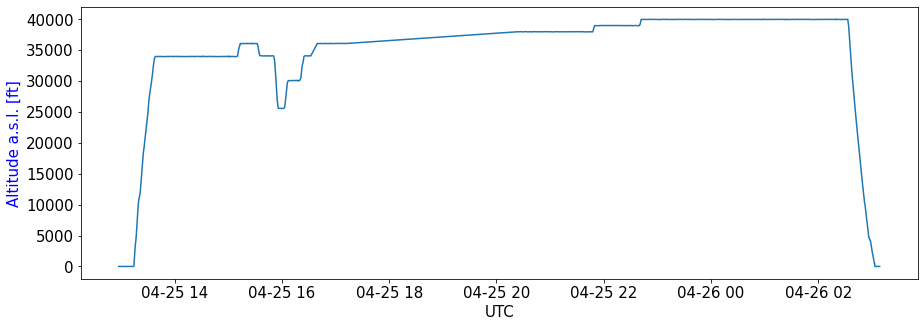

In [262]:
plt.figure(figsize=(15,5))

tele['time'] = pd.to_datetime(tele['UTC'], format='%Y-%m-%dT%H:%M:%SZ')
tele.set_index('time', inplace=True)
tele.sort_index(inplace=True)
plt.plot(tele['Altitude'])
plt.xlabel('UTC')
plt.ylabel('Altitude a.s.l. [ft]', color='blue')

In [8]:
#tele

# Combine AIRDOS and telemetry data

(0.0, 2.0)

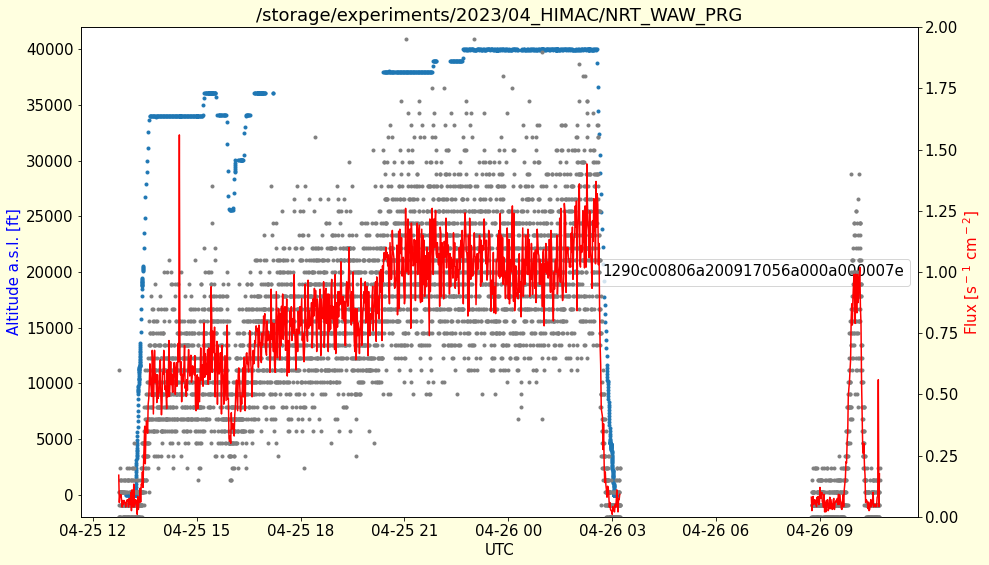

In [263]:
FIRST_CHANNEL = 9

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.plot(tele['Altitude'], label=str(rc.loc[rc[0]=='$DOS'][[6]].iloc[0,0]), marker='.', linestyle='')
# Set limits of plot for magnification
#plt.xlim(pd.Timestamp('2019-09-03'),pd.Timestamp('2019-09-7'))
#plt.xlim(pd.Timestamp('2021-06-8'),pd.Timestamp('2021-06-12'))
#plt.xlim(pd.Timestamp('2021-10-8'),pd.Timestamp('2021-11-5')) # SWA last measurement
#plt.xlim(pd.Timestamp('2021-9-15'),pd.Timestamp('2021-9-28')) # SWB last measurement
plt.ylabel('Altitude a.s.l. [ft]', color='blue')
plt.xlabel('UTC')
plt.legend()
#rc = rc.iloc[3286:]

plt.twinx()

rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2
#rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)

rc['sum'].plot(marker='.', linestyle='', color='gray')
#(rc.iloc[:,FIRST_CHANNEL]/10/2).plot(color='sandybrown')
rcc = rc.resample('1T').mean()
rcc['sum'].plot(color='red')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)

plt.ylim([0,2]) 


In [120]:
rc

,0,1,2,3,4,5,6,7,8,9,...,500,501,502,503,504,runtime,seconds,run,time,sum
time,,,,,,,,,,,,,,,,,,,,,
NaT,$DOS,LABDOS01A,NaN,514,71cdf196883fa3ab648ae47327ef2137eb69420f,CIBuild,1290c00806a200903c49a000a00000ef,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.00,2023-04-22 13:15,NaT,0.00
2023-04-22 13:15:11.340,$HIST,0,11.34,21355,2,375,17877,6467.0,7.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-11.34,11.34,2023-04-22 13:15,2023-04-22 13:15:11.340,0.10
2023-04-22 13:15:22.260,$HIST,1,22.26,21334,5,392,17828,6510.0,14.0,2.0,...,0.0,0.0,0.0,0.0,0.0,-10.92,22.26,2023-04-22 13:15,2023-04-22 13:15:22.260,0.25
NaT,$DOS,LABDOS01A,NaN,514,71cdf196883fa3ab648ae47327ef2137eb69420f,CIBuild,1290c00806a200903c49a000a00000ef,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,22.26,0.00,2023-04-22 13:15,NaT,0.00
2023-04-22 13:15:11.330,$HIST,0,11.33,21443,1,304,18255,6077.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-11.33,11.33,2023-04-22 13:15,2023-04-22 13:15:11.330,0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-23 02:29:55.610,$HIST,4376,47695.61,21299,1,221,17668,6888.0,6.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-10.82,47695.61,2023-04-22 13:15,2023-04-23 02:29:55.610,0.05
2023-04-23 02:30:06.430,$HIST,4377,47706.43,21402,0,223,17778,6678.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-10.82,47706.43,2023-04-22 13:15,2023-04-23 02:30:06.430,0.00
2023-04-23 02:30:17.240,$HIST,4378,47717.24,21371,2,188,17649,6866.0,7.0,2.0,...,0.0,0.0,0.0,0.0,0.0,-10.81,47717.24,2023-04-22 13:15,2023-04-23 02:30:17.240,0.10


0.0 0.015


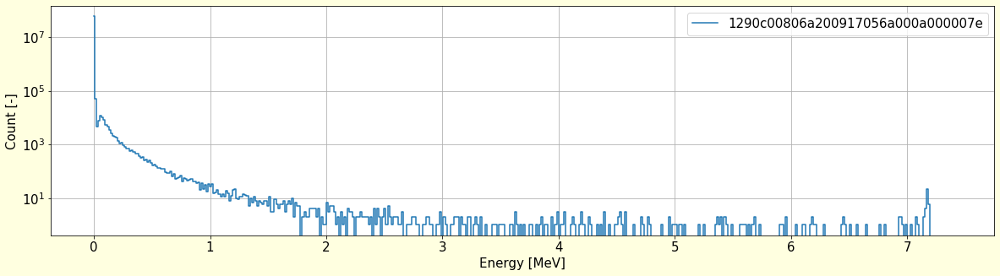

In [217]:
FIRST_CHANNEL = 7

ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.015
coef3[0] = 0.0
#coef3[1] = 0.03
#coef3[0] = 0.06

#(60 keV +-15 keV) + CH * 30 keV 
#0.034 MeV + ch * 0.016 MeV


print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.figure(figsize=(20,5), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] , label=str(rc.loc[rc[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()
#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

/tmp/ipykernel_29347/2395577449.py:2: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.

/tmp/ipykernel_29347/2395577449.py:37: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



0.034 0.016
0.034 0.016


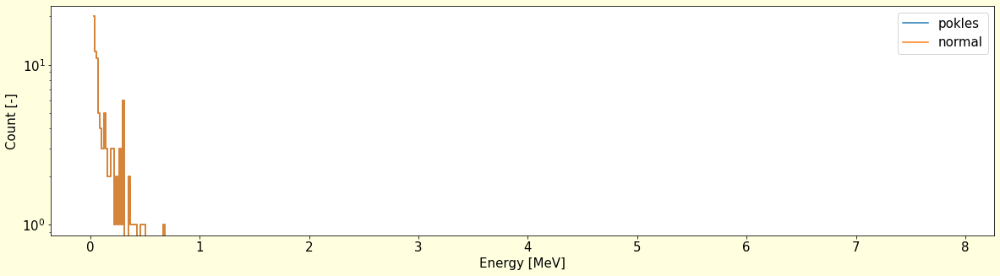

In [79]:
#ener = rc.loc['2023-04-25 14:25':'2023-04-25 14:35'].iloc[:,FIRST_CHANNEL:500].sum()
ener = rc.loc['2023-05-10 14:50':'2023-05-10 15:00'].iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#coef3[1] = 0.03
#coef3[0] = 0.06

#(60 keV +-15 keV) + CH * 30 keV 
#0.034 MeV + ch * 0.016 MeV


print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.figure(figsize=(20,5), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] , label='pokles', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()
#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

#ener = rc.loc['2023-04-25 14:50':'2023-04-25 15:00'].iloc[:,FIRST_CHANNEL:500].sum()
ener = rc.loc['2023-05-10 14:50':'2023-05-10 15:00'].iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#coef3[1] = 0.03
#coef3[0] = 0.06

#(60 keV +-15 keV) + CH * 30 keV 
#0.034 MeV + ch * 0.016 MeV


print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.plot(e3['x'], e3['1'] , label='normal', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()
#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None
None

In [102]:
rc.iloc[:,0:500]
#e3.loc[8:499]
#e3

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
time,,,,,,,,,,,,,,,,,,,,,
NaT,$DOS,LABDOS01A,NaN,513,71cdf196883fa3ab648ae47327ef2137eb69420f,CIBuild,1290c00806a200917056a000a000007e,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-04-22 13:15:11.340,$HIST,0,11.34,20993,3,200,16042,8839.0,6.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-04-22 13:15:22.560,$HIST,1,22.56,21146,5,228,16645,8055.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
NaT,$DOS,LABDOS01A,NaN,513,71cdf196883fa3ab648ae47327ef2137eb69420f,CIBuild,1290c00806a200917056a000a000007e,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-04-22 13:15:11.300,$HIST,0,11.30,21096,2,147,16516,8318.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-23 02:30:00.100,$HIST,4357,47700.10,20550,2,32,12817,12668.0,14.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-04-23 02:30:11.230,$HIST,4358,47711.23,20495,5,14,12607,12950.0,12.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-04-23 02:30:22.350,$HIST,4359,47722.35,20509,1,17,12266,13276.0,14.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


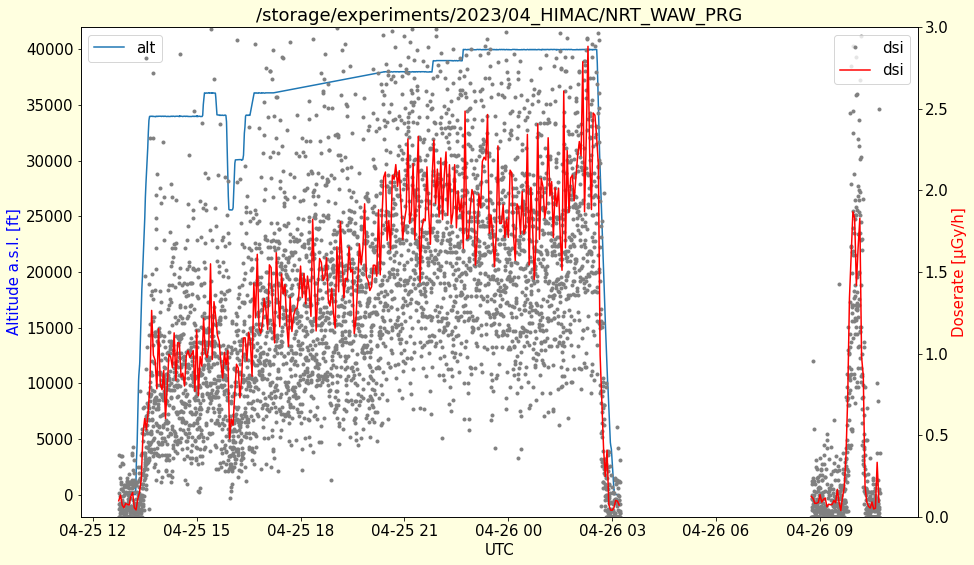

In [295]:
FIRST_CHANNEL = 9

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

plt.plot(tele['Altitude'], label='alt')
# Set limits of plot for magnification
#plt.xlim(pd.Timestamp('2019-09-03'),pd.Timestamp('2019-09-7'))
#plt.xlim(pd.Timestamp('2021-06-8'),pd.Timestamp('2021-06-12'))
#plt.xlim(pd.Timestamp('2021-10-8'),pd.Timestamp('2021-11-5')) # SWA last measurement
#plt.xlim(pd.Timestamp('2021-9-15'),pd.Timestamp('2021-9-28')) # SWB last measurement
plt.ylabel('Altitude a.s.l. [ft]', color='blue')
plt.xlabel('UTC')

#rc = rc.iloc[3286:]
plt.legend(loc=2)

plt.twinx()

rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2
#rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)
rc['ener'] = (np.asarray(rc.iloc[:,10:500]) * np.asarray(e3.loc[10:499,'x'])).sum(axis=1)   

# size of the chip (20 mm · 10 mm), 
# the thickness of the depletion layer (0.3 mm), 
# and the density of silicon (2.33 g cm^3)
# = 0.1398e-3 kg
# Meier DLR: 0.16597 g
# pro 230 um ~ 1.0252e-4 kg
#dose = ((1e6 * (1.602e-19 * depener * 1e6)/0.1398e-3)/integration_time) * 3600 # in uGy/h

rc['dsi'] = ((1e6 * (1.602e-19 * rc['ener'] * 1e6)/1.0252e-4)/10) * 3600 # in uGy/h


rc['dsi'].plot(marker='.', linestyle='', color='gray')
rc['roll'] = rc['dsi'].rolling(50).mean()
#rc['roll'].plot(color='black')
rcc = rc.resample('3T').mean()
rcc['dsi'].plot(color='red')
plt.ylabel('Doserate [µGy/h]', color='red')
plt.title(fto)
#plt.yscale('log')

plt.ylim([0,3]) 
plt.legend(loc=1)


In [202]:
e3

,1,i,x
7,58039875.0,7,0.000
8,46864.0,8,0.015
9,4141.0,9,0.030
10,7184.0,10,0.045
11,11897.0,11,0.060
...,...,...,...
495,0.0,495,7.320
496,0.0,496,7.335
497,0.0,497,7.350
498,0.0,498,7.365


/tmp/ipykernel_30662/1568872176.py:17: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rcc = rc.loc['2023-04-22 14:25':'2023-04-23 2:30'] # WAW-NRT


Text(0, 0.5, 'Flux [s$^-$$^1$ cm$^-$$^2$]')

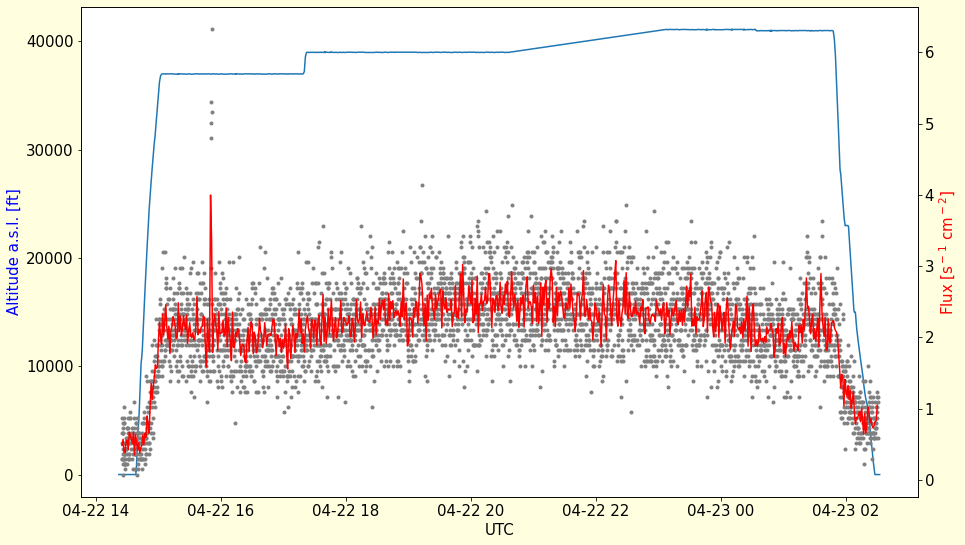

In [183]:
FIRST_CHANNEL = 8

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.plot(tele['Altitude'])
# Set limits of plot for magnification
#plt.xlim(pd.Timestamp('2019-09-03'),pd.Timestamp('2019-09-7'))
#plt.xlim(pd.Timestamp('2021-06-8'),pd.Timestamp('2021-06-12'))
#plt.xlim(pd.Timestamp('2021-10-8'),pd.Timestamp('2021-11-5')) # SWA last measurement
#plt.xlim(pd.Timestamp('2021-9-15'),pd.Timestamp('2021-9-28')) # SWB last measurement
plt.ylabel('Altitude a.s.l. [ft]', color='blue')
plt.xlabel('UTC')

#rcc = rc.loc['2023-03-1 12:35':'2023-03-1 16:25'] # NRT-WAW
rcc = rc.loc['2023-04-22 14:25':'2023-04-23 2:30'] # WAW-NRT

plt.twinx()

rcc['sum'] = rcc[range(FIRST_CHANNEL,500)].sum(axis=1)/6.88/2
#rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)

rcc['sum'].plot(marker='.', linestyle='', color='gray')
rccc = rcc.resample('1T').mean()
rccc['sum'].plot(color='red')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')

#plt.ylim([0,30]) 


0.034 0.016


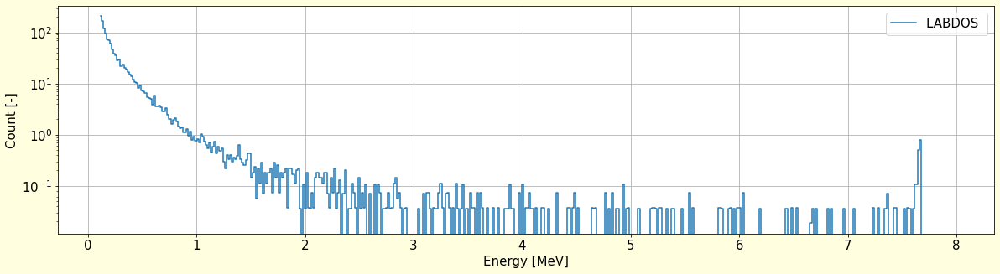

In [197]:
ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#coef3[1] = 0.03
#coef3[0] = 0.06

#(60 keV +-15 keV) + CH * 30 keV 
#0.034 MeV + ch * 0.016 MeV


print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.figure(figsize=(20,5), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] , label='LABDOS ', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()
#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

0.034 0.016


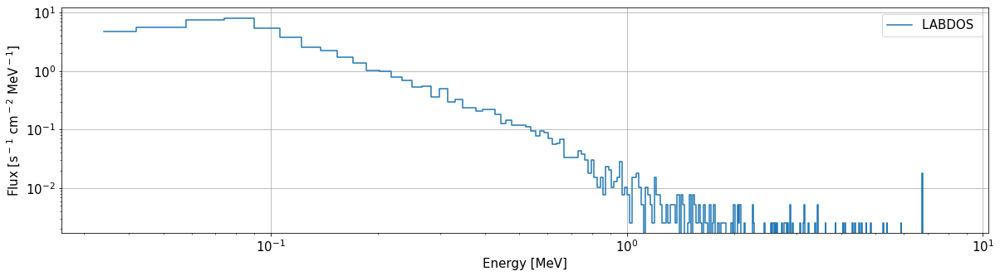

In [36]:
ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#coef3[1] = 0.03
#coef3[0] = 0.06

#(60 keV +-15 keV) + CH * 30 keV 
#0.034 MeV + ch * 0.016 MeV


print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0] 
plt.figure(figsize=(20,5))
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / 2 / measurement_duration / coef3[1], label='LABDOS ', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$ MeV$^-$$^1$]')
plt.grid()
plt.legend()
#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

In [203]:
print('The first measurement', rcc.iloc[0,1])
print('The last measurement', rcc.iloc[-1,1])
measurement_duration = (int(rcc.iloc[-1,1]) - int(rcc.iloc[0,1])) * 10 #6.88
flight_duration = rcc.iloc[-1,2] - rcc.iloc[0,2]
print('Begin', rcc.iloc[0,2], 's')
print('End', rcc.iloc[-1,2], 's')
print('Flight duration', round(flight_duration,2), 's')
print('Measurement duration', measurement_duration, 's')
deathtime_ratio = flight_duration / measurement_duration
print('Deathtime ratio', round(deathtime_ratio,2))

e3['total'] = e3['1']*e3['x']
depener = e3['total'].sum()*deathtime_ratio
print('Deposited Energy including deathtime', round(depener,2), 'MeV')
dose = (1e6*(1.602e-19 * depener*1e6)/0.1398e-3) 

# size of the chip (20 mm · 10 mm), 
# the thickness of the depletion layer (0.3 mm), 
# and the density of silicon (2.33 g cm^3)
# 0.1398e-3 kg
#dose = ((1e6 * (1.602e-19 * depener * 1e6)/0.1398e-3)/10.4) * 3600 * 2.71 # in uGy/h

print('Dose in silicon', round(dose,2), 'µGy')


The first measurement 913
The last measurement 4412
Begin 9905.2 s
End 47759.7 s
Flight duration 37854.5 s
Measurement duration 34990 s
Deathtime ratio 1.08
Deposited Energy including deathtime 21188.76 MeV
Dose in silicon 24.28 µGy


## Route map

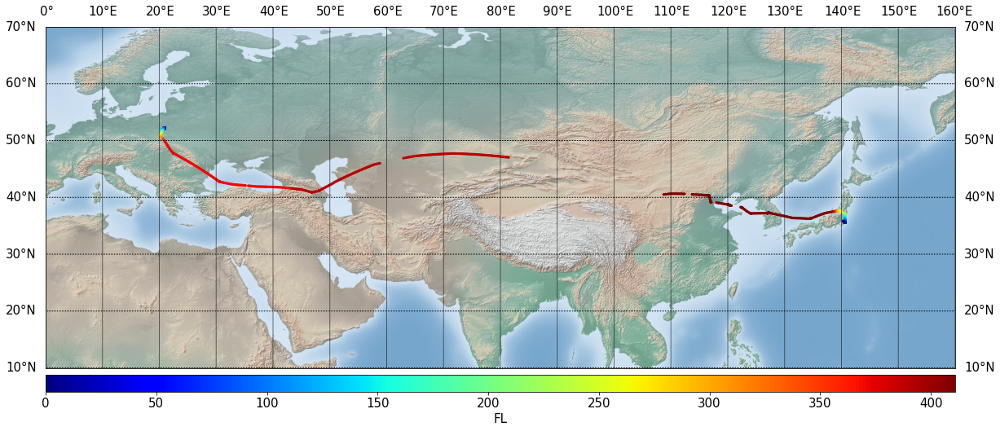

In [107]:
import time, calendar, datetime, numpy
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import matplotlib
import urllib, os

tele['lat'] = tele['Position'].str.split(',').str[0]
tele['lon'] = tele['Position'].str.split(',').str[1]
tele.lon = pd.to_numeric(tele.lon)
tele.lat = pd.to_numeric(tele.lat)
tele.Altitude = pd.to_numeric(tele.Altitude)


plt.figure(figsize=(20,20))
plt.tight_layout()

matplotlib.rcParams.update({'font.size': 15})

# create Basemap instance.
#m = Basemap(projection='kav7',lon_0=0)
m = Basemap(projection='cyl',lon_0=0, llcrnrlon=0,llcrnrlat=10,urcrnrlon=160,urcrnrlat=70)
#m = Basemap(projection='robin',lon_0=0)
#m = Basemap(llcrnrlon=-180,llcrnrlat=-80,urcrnrlon=180,urcrnrlat=85,projection='mill')


x, y = m(tele.lon.tolist(),tele.lat.tolist())
#m.drawmapboundary(fill_color='#99ffff')
#m.fillcontinents(color='#cc9966',lake_color='#99ffff',zorder=0)
# draw parallels and meridians, but don't bother labelling them.
m.drawparallels(np.arange(-90.,+90.,10.),labels=[1,1,0,0])
m.drawmeridians(np.arange(-180.,180.,10.),labels=[0,0,1,0])
m.shadedrelief()

im1 = m.scatter(x,y,c=(tele.Altitude/100).tolist(),marker='.', s = 20, cmap='jet')
cb = m.colorbar(im1,"bottom", size="5%", pad="2%")
cb.set_label('FL')

#plt.clim(0, 12500)  # limit for color axis
plt.show()                


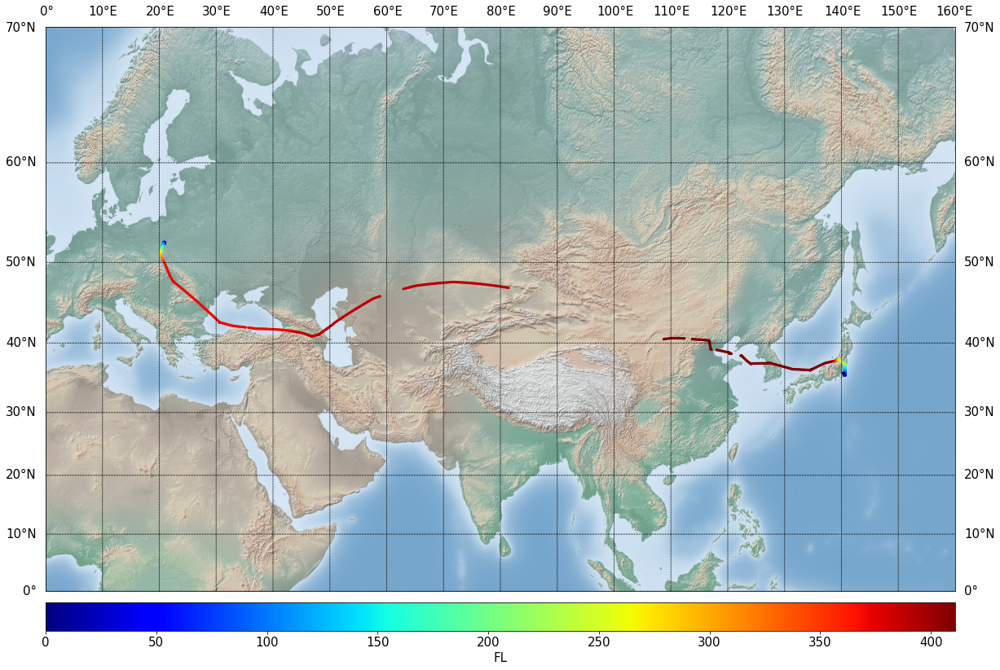

In [207]:
import time, calendar, datetime, numpy
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import matplotlib
import urllib, os

tele['lat'] = tele['Position'].str.split(',').str[0]
tele['lon'] = tele['Position'].str.split(',').str[1]
tele.lon = pd.to_numeric(tele.lon)
tele.lat = pd.to_numeric(tele.lat)
tele.Altitude = pd.to_numeric(tele.Altitude)


plt.figure(figsize=(20,20))
plt.tight_layout()

matplotlib.rcParams.update({'font.size': 15})

# create Basemap instance.
#m = Basemap(projection='kav7',lon_0=0)
#m = Basemap(projection='tmerc',lon_0=0,lat_0=0, llcrnrlon=-180,llcrnrlat=-90,urcrnrlon=180,urcrnrlat=90)
m = Basemap(projection='merc',lon_0=0,lat_0=0, llcrnrlon=0,llcrnrlat=0,urcrnrlon=160,urcrnrlat=70)
#m = Basemap(projection='robin',lon_0=0)
#m = Basemap(llcrnrlon=-180,llcrnrlat=-80,urcrnrlon=180,urcrnrlat=85,projection='mill')


x, y = m(tele.lon.tolist(),tele.lat.tolist())
#m.drawmapboundary(fill_color='#99ffff')
#m.fillcontinents(color='#cc9966',lake_color='#99ffff',zorder=0)
# draw parallels and meridians, but don't bother labelling them.
m.drawparallels(np.arange(-90.,+90.,10.),labels=[1,1,0,0])
m.drawmeridians(np.arange(-180.,180.,10.),labels=[0,0,1,0])
m.shadedrelief()

im1 = m.scatter(x,y,c=(tele.Altitude/100).tolist(),marker='.', s = 20, cmap='jet')
cb = m.colorbar(im1,"bottom", size="5%", pad="2%")
cb.set_label('FL')

#plt.clim(0, 12500)  # limit for color axis
plt.show()                


In [173]:
cari_photons = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_photons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_photons = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_photons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_photons.reset_index(drop=True, inplace=True)
cari_photons['time'] = pd.to_datetime(dict(year=cari_photons[6], month=cari_photons[7], day=cari_photons[8], hour=cari_photons[9], minute=cari_photons[10]))
cari_photons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [174]:
cari_electrons = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_electrons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_electrons.reset_index(drop=True, inplace=True)
cari_electrons['time'] = pd.to_datetime(dict(year=cari_electrons[6], month=cari_electrons[7], day=cari_electrons[8], hour=cari_electrons[9], minute=cari_electrons[10]))
cari_electrons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [175]:
cari_protons = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_protons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_protons.reset_index(drop=True, inplace=True)
cari_protons['time'] = pd.to_datetime(dict(year=cari_protons[6], month=cari_protons[7], day=cari_protons[8], hour=cari_protons[9], minute=cari_protons[10]))
cari_protons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [176]:
cari_alphas = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_alphas.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_alphas.reset_index(drop=True, inplace=True)
cari_alphas['time'] = pd.to_datetime(dict(year=cari_alphas[6], month=cari_alphas[7], day=cari_alphas[8], hour=cari_alphas[9], minute=cari_alphas[10]))
cari_alphas.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [177]:
cari_neg_muons = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_neg_muons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_neg_muons.reset_index(drop=True, inplace=True)
cari_neg_muons['time'] = pd.to_datetime(dict(year=cari_neg_muons[6], month=cari_neg_muons[7], day=cari_neg_muons[8], hour=cari_neg_muons[9], minute=cari_neg_muons[10]))
cari_neg_muons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [178]:
cari_positrons = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_positrons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_positrons.reset_index(drop=True, inplace=True)
cari_positrons['time'] = pd.to_datetime(dict(year=cari_positrons[6], month=cari_positrons[7], day=cari_positrons[8], hour=cari_positrons[9], minute=cari_positrons[10]))
cari_positrons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [179]:
cari_total = pd.read_csv('/storage/experiments/2023/0301_SA/0301_W62987/CARI/W62987_2f5ddba8_D_Total.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_total.reset_index(drop=True, inplace=True)
cari_total['time'] = pd.to_datetime(dict(year=cari_total[6], month=cari_total[7], day=cari_total[8], hour=cari_total[9], minute=cari_total[10]))
cari_total.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


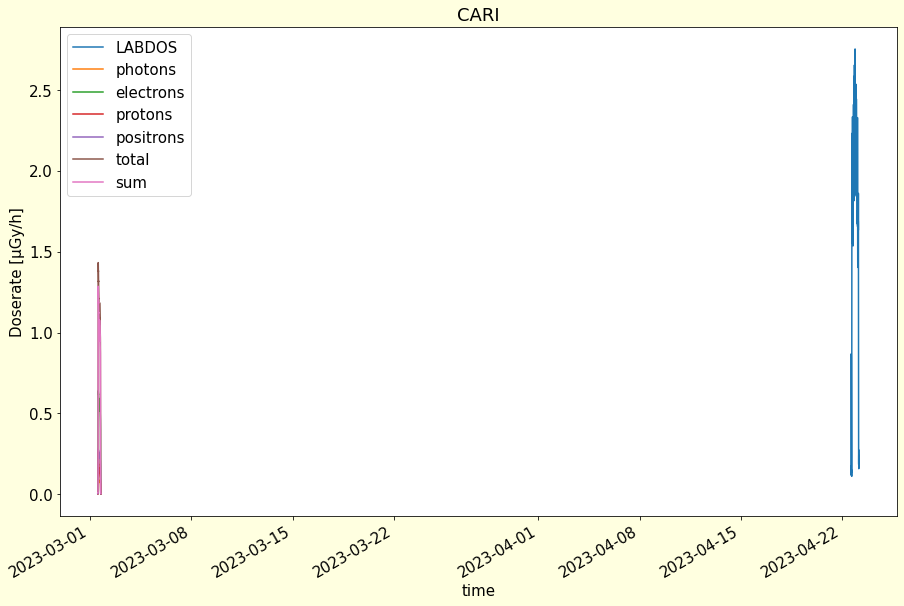

In [193]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

plt.plot(rcc.index + timedelta(hours=1.1),rcc['dsi'], label='LABDOS')
#plt.plot(rc.index + timedelta(hours=1),rc['roll'], label='LABDOS')

cari_photons[4].plot(label='photons')
cari_electrons[4].plot(label='electrons')
cari_protons[4].plot(label='protons')
#cari_alphas[4].plot(label='alphas')
cari_positrons[4].plot(label='positrons')
#cari_neg_muons[4].plot(label='neg_muons')
cari_total[4].plot(label='total')
(cari_photons[4]+cari_electrons[4]+cari_protons[4]+cari_positrons[4]).plot(label='sum')
plt.ylabel('Doserate [µGy/h]')
plt.title('CARI')
plt.legend()

In [266]:
#cari_total = pd.read_csv('/storage/experiments/2023/04_HIMAC/WAW_NRT/CARI7/DAT/LO1079_2fffa450_H_Total.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_total = pd.read_csv('/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/CARI7/DAT/LO80_3008d15a_H_Total.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_total.reset_index(drop=True, inplace=True)
cari_total['time'] = pd.to_datetime(dict(year=cari_total[6], month=cari_total[7], day=cari_total[8], hour=cari_total[9], minute=cari_total[10]))
cari_total.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [267]:
cari_neg_muons = pd.read_csv('/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/CARI7/DAT/LO80_3008d15a_H_NegMuons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_neg_muons.reset_index(drop=True, inplace=True)
cari_neg_muons['time'] = pd.to_datetime(dict(year=cari_neg_muons[6], month=cari_neg_muons[7], day=cari_neg_muons[8], hour=cari_neg_muons[9], minute=cari_neg_muons[10]))
cari_neg_muons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [268]:
cari_pos_muons = pd.read_csv('/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/CARI7/DAT/LO80_3008d15a_H_PosMuons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_pos_muons.reset_index(drop=True, inplace=True)
cari_pos_muons['time'] = pd.to_datetime(dict(year=cari_pos_muons[6], month=cari_pos_muons[7], day=cari_pos_muons[8], hour=cari_pos_muons[9], minute=cari_pos_muons[10]))
cari_pos_muons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


In [269]:
#cari_total = pd.read_csv('/storage/experiments/2023/04_HIMAC/WAW_NRT/CARI7/DAT/LO1079_2fffa450_H_Total.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_neutrons = pd.read_csv('/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/CARI7/DAT/LO80_3008d15a_H_Neutrons.DAT', delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')
cari_neutrons.reset_index(drop=True, inplace=True)
cari_neutrons['time'] = pd.to_datetime(dict(year=cari_neutrons[6], month=cari_neutrons[7], day=cari_neutrons[8], hour=cari_neutrons[9], minute=cari_neutrons[10]))
cari_neutrons.set_index('time', drop=False, inplace=True)
print('Loaded')

Loaded


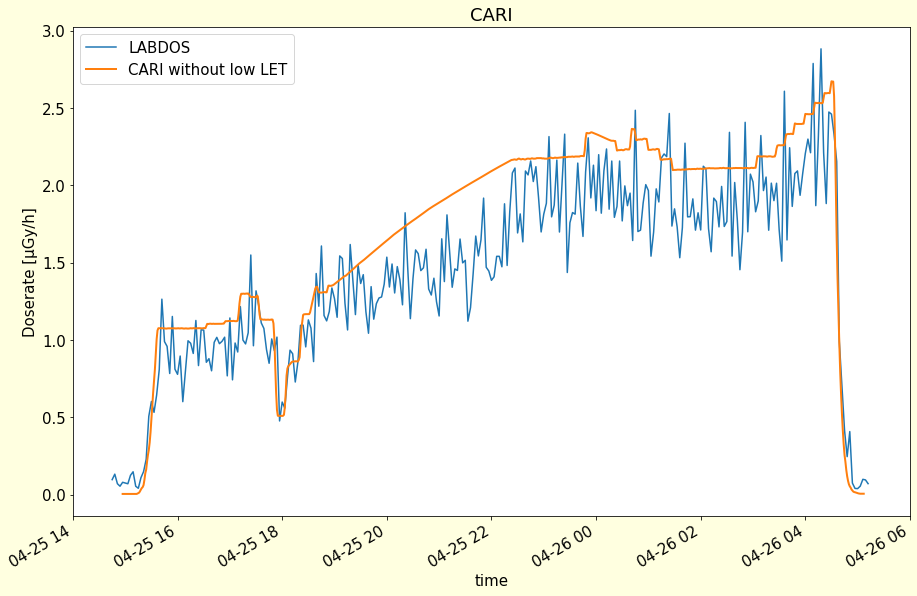

In [297]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

plt.plot(rcc.index + timedelta(hours=2),rcc['dsi'], label='LABDOS')

(cari_total[4] - cari_neutrons[4] - cari_neg_muons[4] - cari_pos_muons[4]).plot(label='CARI without low LET', lw=2)

plt.xlim('2023-04-25 14:00','2023-04-26 06:00')

plt.ylabel('Doserate [µGy/h]')
plt.title('CARI')
plt.legend()

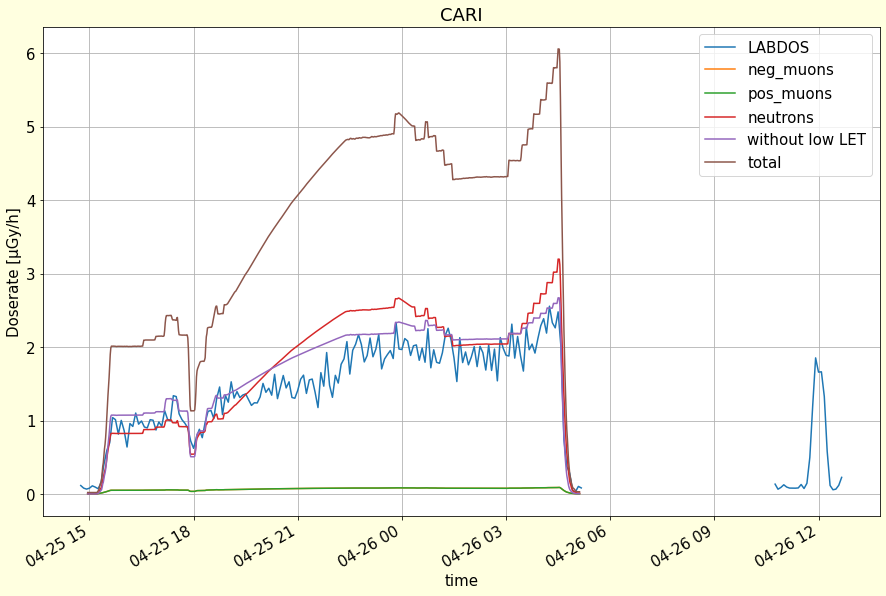

In [276]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

plt.plot(rcc.index + timedelta(hours=2),rcc['dsi'], label='LABDOS')
cari_neg_muons[4].plot(label='neg_muons')
cari_pos_muons[4].plot(label='pos_muons')
cari_neutrons[4].plot(label='neutrons')


(cari_total[4] - cari_neutrons[4] - cari_neg_muons[4] - cari_pos_muons[4]).plot(label='without low LET')

cari_total[4].plot(label='total')
plt.ylabel('Doserate [µGy/h]')
plt.title('CARI')
plt.legend()
plt.grid()

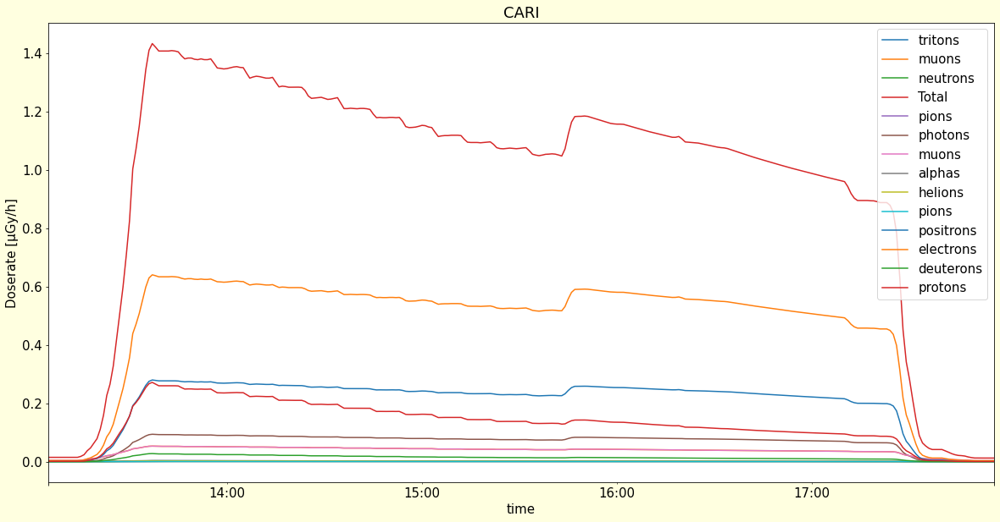

In [151]:
plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


dto = '/storage/experiments/2023/0301_SA/0301_W62987/CARI/'


for fto in glob.iglob(dto + 'W62987_2f5ddba8_D*'): # generator, search immediate subdirectories 
    particles = fto.split('/')[-1].split('.')[-2].split('_')[-1]
    if (len(particles)>2):
        cari = pd.read_table(fto, delim_whitespace=True, skipfooter=3, skiprows=1, header=None, comment='*', engine='python')    
        #cari.reset_index(drop=True, inplace=True)
        cari['time'] = pd.to_datetime(dict(year=cari[6], month=cari[7], day=cari[8], hour=cari[9], minute=cari[10]))
        cari.set_index('time', drop=False, inplace=True)
        cari[4].plot(label=particles)
    

plt.ylabel('Doserate [µGy/h]')
plt.title('CARI')
plt.legend()

In [113]:
fto.split('/')[-1].split('.')[-2].split('_')[-1]

'tritons'

# Load and plot mutiple devices

/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT


/tmp/ipykernel_29347/4282581349.py:42: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/B8/0.TXT


/tmp/ipykernel_29347/4282581349.py:42: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/4E/0.TXT


/tmp/ipykernel_29347/4282581349.py:42: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/7E/0.TXT


/tmp/ipykernel_29347/4282581349.py:42: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/EF/0.TXT


/tmp/ipykernel_29347/4282581349.py:42: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/D9/0.TXT


/tmp/ipykernel_29347/4282581349.py:42: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



Text(0.5, 0, 'UTC')

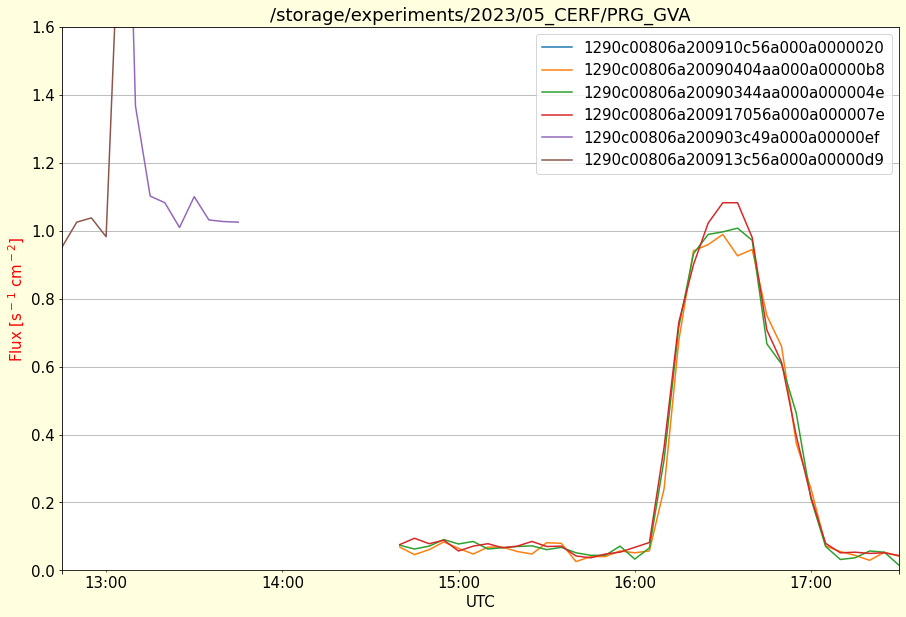

In [67]:
ftt = glob.iglob(fto+"/**/**/?.TXT") # generator, search immediate subdirectories 
#SWITCH_ON_TIMES = ['2023-04-22 13:15']

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    
    #rc = df.copy()  
    rc = df.iloc[:df.loc[df[0]=='$DOS'][-1:].index[0]].copy()


    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    
    #rc = rc.sort_index().loc['2023-04-25 14:00':'2023-04-26 02:00']
    rc = rc.sort_index().loc['2023-05-10 10:00':'2023-05-10 20:00']
    
    FIRST_CHANNEL = 9

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

    #rc['sum'].plot(marker='.', linestyle='', color='gray')
    rcc = rc.resample('5T').mean()
    rcc['sum'].plot(label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]))


plt.ylim([0,1.6]) 
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)
plt.legend()
plt.grid()
plt.xlabel('UTC')
  
#plt.twinx()

#tele['Altitude'].plot(label='Altitude')
#plt.ylabel('Altitude a.s.l. [ft]', color='blue')


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_D9/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_8B/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_7E/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_EF/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_4E/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_20/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_B8/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3418987471.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


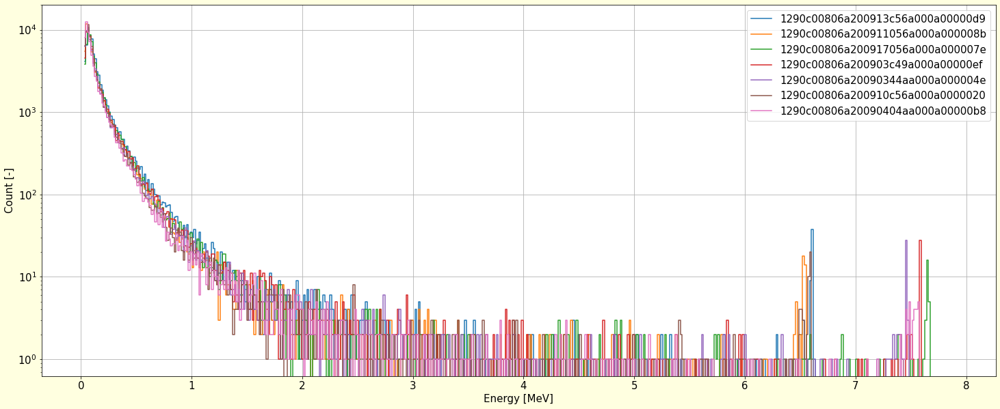

In [83]:
ftt = glob.iglob(fto+"/**/?.TXT") # generator, search immediate subdirectories 
#SWITCH_ON_TIMES = ['2023-04-22 13:15']

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
  
    #rc = df.copy()  
    rc = df.iloc[:df.loc[df[0]=='$DOS'][-1:].index[0]].copy()

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)

    rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']

    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.yscale('log')
    #plt.xscale('log')

    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()


#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_D9/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_8B/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_7E/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_EF/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_4E/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_20/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/LABDOS_B8/0.TXT
0.034 0.016


/tmp/ipykernel_26111/16978818.py:40: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']


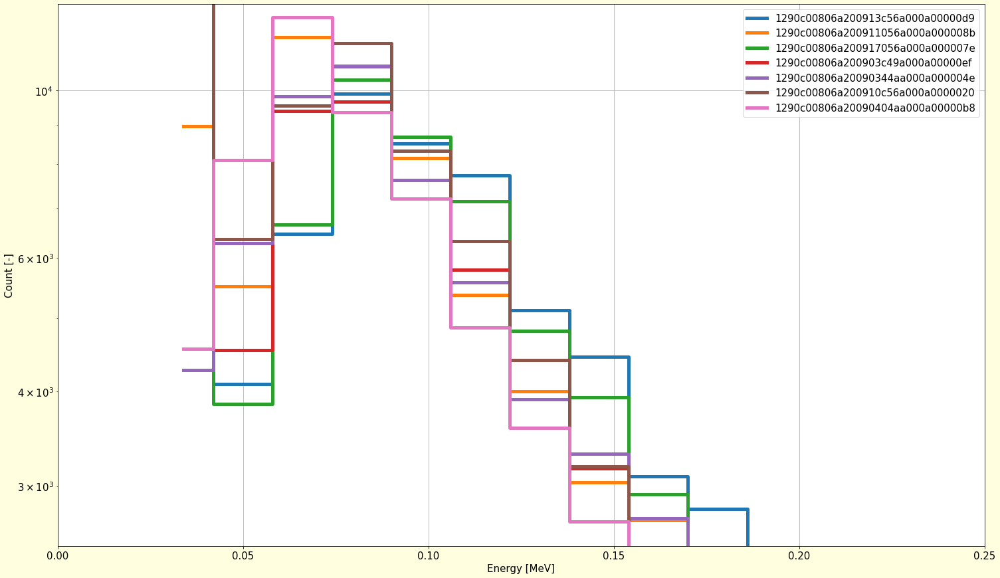

In [111]:
ftt = glob.iglob(fto+"/**/?.TXT") # generator, search immediate subdirectories 
#SWITCH_ON_TIMES = ['2023-04-22 13:15']

plt.figure(figsize=(25,15), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
  
    #rc = df.copy()  
    rc = df.iloc[:df.loc[df[0]=='$DOS'][-1:].index[0]].copy()

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)

    rc = rc.loc['2023-04-25 14:00':'2023-04-26 02:00']

    FIRST_CHANNEL = 8

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.yscale('log')
    #plt.xscale('log')

    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', linewidth=5)

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()


#plt.xticks(np.arange(0, 10, 1))
plt.xlim(0,0.25)
plt.ylim(2.5e3,1.3e4)
#plt.vlines(0.511,1,1e4, color='red')

None

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 20.0)

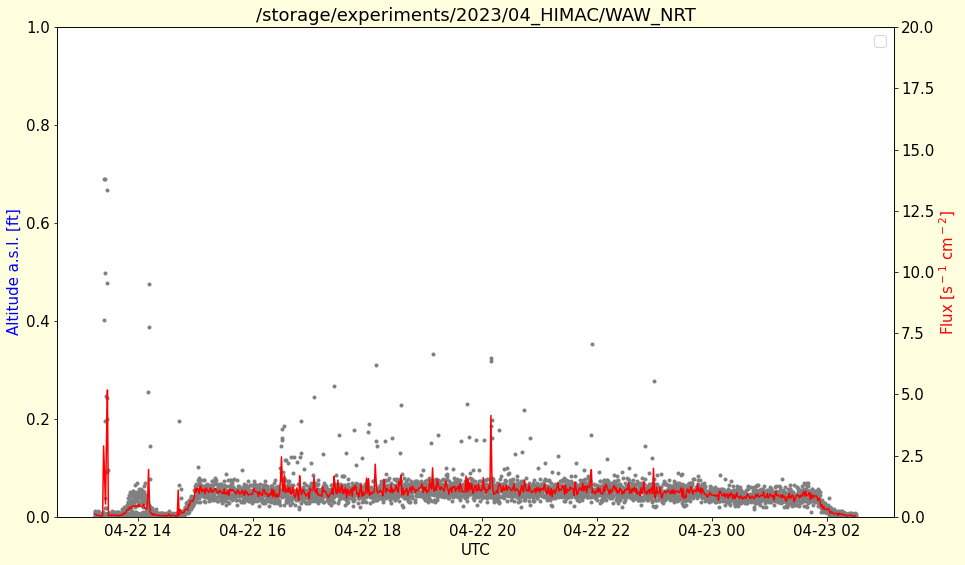

In [135]:
FIRST_CHANNEL = 9

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


#plt.plot(tele['Altitude'], label=str(rc.loc[rc[0]=='$DOS'][[6]].iloc[0,0]))
# Set limits of plot for magnification
#plt.xlim(pd.Timestamp('2019-09-03'),pd.Timestamp('2019-09-7'))
#plt.xlim(pd.Timestamp('2021-06-8'),pd.Timestamp('2021-06-12'))
#plt.xlim(pd.Timestamp('2021-10-8'),pd.Timestamp('2021-11-5')) # SWA last measurement
#plt.xlim(pd.Timestamp('2021-9-15'),pd.Timestamp('2021-9-28')) # SWB last measurement
plt.ylabel('Altitude a.s.l. [ft]', color='blue')
plt.xlabel('UTC')
plt.legend()
#rc = rc.iloc[3286:]

plt.twinx()

rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2
#rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)

rc['sum'].plot(marker='.', linestyle='', color='gray')
rcc = rc.resample('1T').mean()
rcc['sum'].plot(color='red')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)

plt.ylim([0,20]) 


In [32]:
pd.set_option('display.max_columns', 40)
pd.set_option('display.max_rows', 400)

rc.loc['2023-04-22 20:40':'2023-04-22 20:50'].iloc[:,8:40]
None

/tmp/ipykernel_26111/3704047499.py:4: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc.loc['2023-04-22 20:40':'2023-04-22 20:50'].iloc[:,8:40]


# Liulin

In [252]:
filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220352_00.y16'
#filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220941_00.y15'
#filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220356_00.y10'
#filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220945_00.y14'
#filename = '/storage/experiments/2023/05_CERF/15052023/LIULIN/2305150921_01.y10'
filename = '/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/Liulin/2304250616_01.y10'


# extract time
path = filename.split('/')
time = path[-1].split('_')
print (time)
date_object = datetime.datetime.strptime(time[0], '%y%m%d%H%M')
print (date_object)

# read data
liulin = pd.read_csv(filename, header = None, sep = ' ', skiprows = 1) # read Liulin data Y
liulin = liulin.drop(256, axis=1) # delete last empty column
infile = open(filename, 'r')
header = infile.readline()
print (header) # print data header
exposition = header.split(' ')[4].split('[')[0] # extract exposition time  
exposition_val = float(exposition)
exposition += 'S'
print (exposition)

# compute time series
#dates = pd.date_range(date_object, freq='5T', periods=len(liulin)).tolist()


['2304250616', '01.y10']
2023-04-25 06:16:00
MDU-10  EXPOSITION = 120[sec]

120S


In [253]:
time_offset = 6*60
liulin['time'] = date_object + pd.to_timedelta(liulin.index * exposition_val, unit='s') + pd.to_timedelta(time_offset, unit='min')
#rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
liulin_data = liulin
liulin.set_index('time', drop=False, inplace=True)

(28040460.0, 28041300.0)

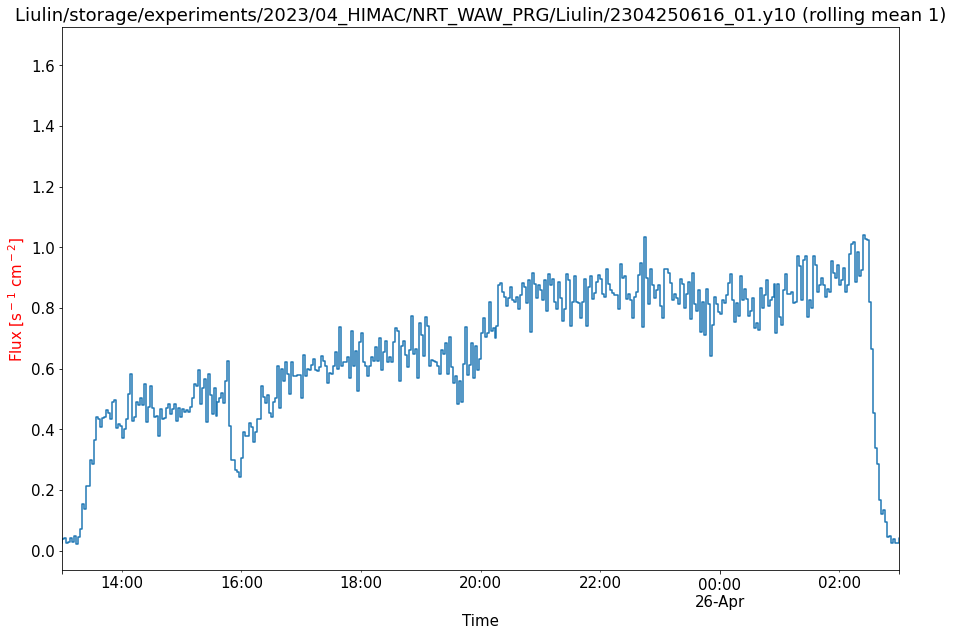

In [254]:
# index liulin data (compute time)
#liulin_data = pd.DataFrame(index = pd.date_range(date_object, freq=exposition, periods=len(liulin)).tolist(), data = liulin.as_matrix())
#liulin_data = pd.DataFrame(index = pd.date_range(date_object, freq=exposition, periods=len(liulin)).tolist(), data = liulin)
#liulin_data['flux'] = liulin_data[range(0,256)].sum(axis=1)
#liulin_data = liulin_data.loc['2018-08-02 17:00:00':'2018-08-03 13:00:00']
#ABSjets liulin_data = liulin_data.loc['2017-11-29 12:00:00':'2017-11-29 15:30:00']
#liulin_data = liulin_data#.loc['2023-04-22 13:15':'2023-04-23 13:15']

liulin_data['flux'] = liulin_data.iloc[:,0:255].sum(axis=1)/exposition_val/2

WINDOW = 1
#liulin_data['flux'] = liulin_data['flux'].rolling(WINDOW).mean()

#liulin_data
plt.figure(figsize=(15, 10))
matplotlib.rcParams.update({'font.size': 15})
liulin_data['flux'].plot(drawstyle='steps')
plt.title('Liulin' + filename + ' (rolling mean ' + str(WINDOW) + ')')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.xlabel('Time')
plt.xlim('2023-04-25 13:00','2023-04-26 3:00')


0.1 0.05


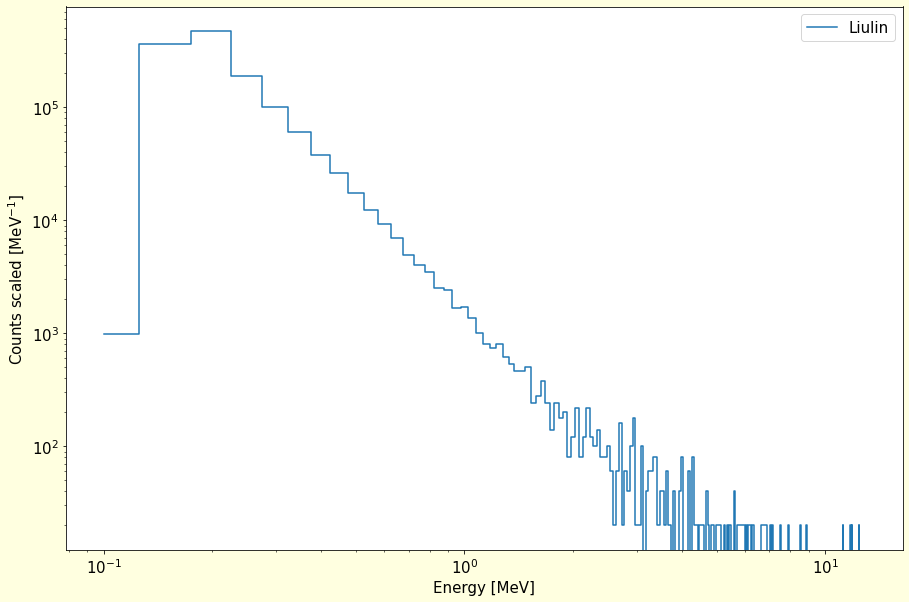

In [255]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

#liulin_data2 = liulin_data.loc['2023-05-15 21:00:00':'2023-05-15 22:00']
#liulin_data2 = liulin_data.loc['2023-04-22 14:25':'2023-04-23 2:30']
liulin_data2 = liulin_data.loc['2023-04-25 13:00':'2023-04-26 03:00']

ener = liulin_data2.iloc[:,0:256].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.05
coef3[0] = 0.1
#coef3[0] = 0.600

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin', drawstyle='steps-mid')
#plt.plot(e3['x'], e3['1'], label='Liulin', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
#plt.grid()
plt.legend()


None

# Liulin + LABDOS 

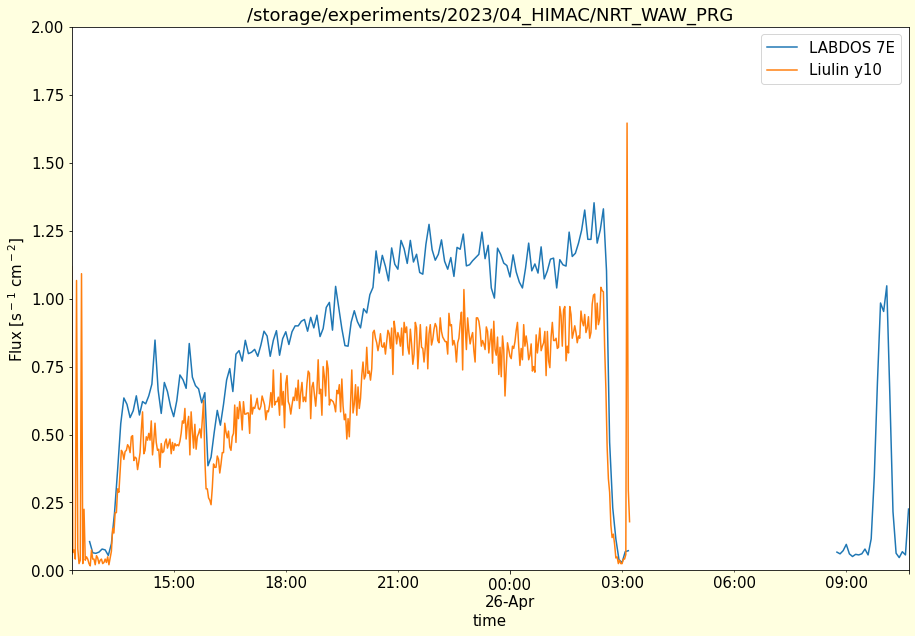

In [264]:
FIRST_CHANNEL = 9

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2
#rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)

#rc['sum'].plot(marker='.', linestyle='', color='gray')
#(rc.iloc[:,FIRST_CHANNEL]/10/2).plot(color='sandybrown')
rcc = rc.resample('5T').mean()
(rcc['sum']*1.1).plot(label='LABDOS '+ID.split('_')[-1])

#liulin['time'] = date_object + pd.to_timedelta(liulin.index * exposition_val, unit='s') + pd.to_timedelta(time_offset, unit='min')

liulin_data['flux'].plot(label='Liulin '+filename.split('.')[-1])

#plt.plot(rcc.index + timedelta(hours=2),rcc['dsi'], label='LABDOS')


plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]')
plt.title(fto)

plt.ylim([0,2])
#plt.xlim('2023-04-22 14:25','2023-04-23 2:30')
#plt.xlim('2023-04-25 07:00','2023-04-25 21:00')

plt.legend()





In [306]:
liulin

,0,1,2,3,4,5,6,7,8,9,...,248,249,250,251,252,253,254,255,time,flux
time,,,,,,,,,,,,,,,,,,,,,
2023-04-25 06:16:00,2,43,217,4,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 06:16:00,1.116667
2023-04-25 06:18:00,0,9,5,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 06:18:00,0.066667
2023-04-25 06:20:00,1,9,3,1,2,1,0,1,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 06:20:00,0.075000
2023-04-25 06:22:00,0,2,2,4,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 06:22:00,0.041667
2023-04-25 06:24:00,1,40,208,6,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 06:24:00,1.066667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-25 21:04:00,0,5,1,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 21:04:00,0.041667
2023-04-25 21:06:00,0,2,9,2,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 21:06:00,0.058333
2023-04-25 21:08:00,4,80,309,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,2023-04-25 21:08:00,1.645833


/tmp/ipykernel_14406/2893352644.py:5: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rcc = rc.loc['2023-04-25 13:00':'2023-04-26 03:00'] # NRT-WAW


0.03 0.015
0.131 0.047


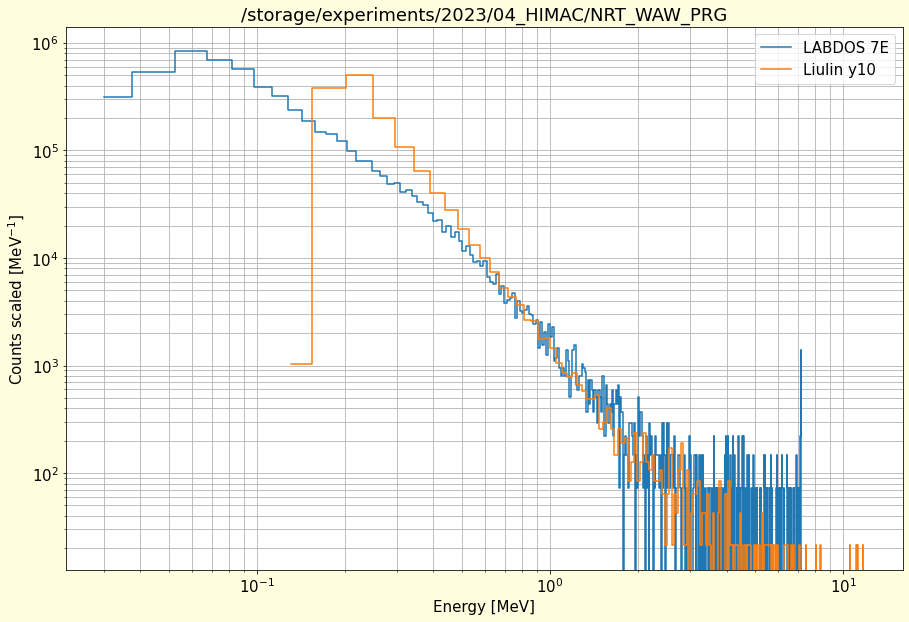

In [295]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

#rcc = rc.loc['2023-04-22 14:25':'2023-04-23 2:30'] # WAW-NRT
rcc = rc.loc['2023-04-25 13:00':'2023-04-26 03:00'] # NRT-WAW

FIRST_CHANNEL = 9

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.015
coef3[0] = 0.03
#coef3[0] = 0.1

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
#e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] * ((e3.index*0.001))  + coef3[0]
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] * 1.1 / coef3[1], label='LABDOS '+ID.split('_')[-1], drawstyle='steps-mid')


#liulin_data2 = liulin_data.loc['2023-04-22 14:25':'2023-04-23 2:30'] # WAW-NRT
liulin_data2 = liulin_data.loc['2023-04-25 13:00':'2023-04-26 03:00'] # NRT-WAW

ener = liulin_data2.iloc[:,0:250].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.047 # MDU10
coef3[0] = 0.131
#coef3[1] = 0.061 # MDU15
#coef3[0] = 0.158

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin '+filename.split('.')[-1], drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid(which='both')
plt.legend()
plt.title(fto)


None

In [152]:
e3

,1,i,x
0,0,0,0.08
1,5085,1,0.13
2,39454,2,0.18
3,10882,3,0.23
4,5535,4,0.28
...,...,...,...
245,0,245,12.33
246,0,246,12.38
247,0,247,12.43
248,0,248,12.48


In [ ]:
plt.figure(figsize=(20,5), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

ener = liulin_data.iloc[:,0:250].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.069
coef3[0] = 0.18
#coef3[1] = 0.03
#coef3[0] = 0.06

#(60 keV +-15 keV) + CH * 30 keV 
#0.034 MeV + ch * 0.016 MeV


print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid()
plt.legend()
#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

# HIMAC preview

In [38]:
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
#fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10'
#fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17'
#fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20'
#fto = '/storage/experiments/2023/04_labdos_BaCs/2nd'

#fto = '/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS'


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT


Text(0.5, 0, 'UTC')

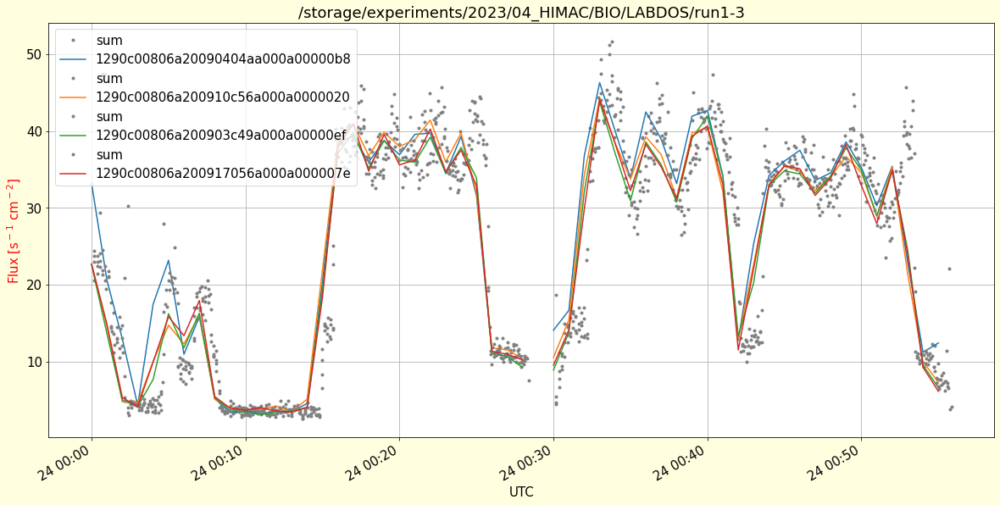

In [64]:
%matplotlib inline
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
#ftt = glob.iglob(fto+"/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']
#SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']

plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    
    rc = df.iloc[ df.loc[df[0]=='$DOS'].index[1]:].copy()

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    
    FIRST_CHANNEL = 9

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

    rc['sum'].plot(marker='.', linestyle='', color='gray')
    rcc = rc.resample('1T').mean()
    rcc['sum'].plot(label=str(rc.loc[rc[0]=='$DOS'][[6]].iloc[0,0]))

    #plt.ylim([0,1.6]) 

plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)
plt.legend()
plt.grid()
plt.xlabel('UTC')
  
#plt.twinx()

#tele['Altitude'].plot(label='Altitude')
#plt.ylabel('Altitude a.s.l. [ft]', color='blue')


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT


/tmp/ipykernel_359/2354378267.py:39: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 03:00:00']
/tmp/ipykernel_359/2354378267.py:39: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 03:00:00']
/tmp/ipykernel_359/2354378267.py:39: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 03:00:00']


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT


/tmp/ipykernel_359/2354378267.py:39: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 03:00:00']


Text(0.5, 0, 'UTC')

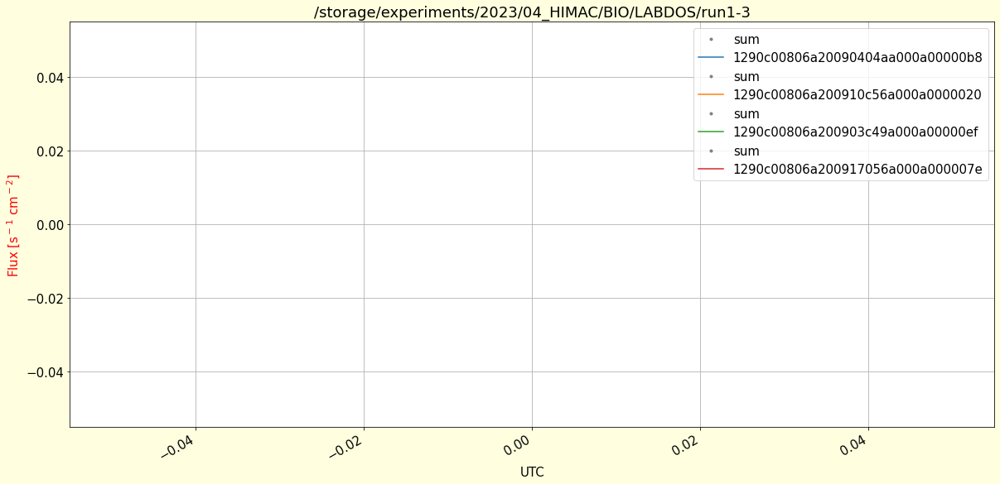

In [65]:
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
#ftt = glob.iglob(fto+"/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0']

plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    
    rc = df.iloc[ df.loc[df[0]=='$DOS'].index[1]:].copy()

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 03:00:00']
    
    FIRST_CHANNEL = 9

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

    rc['sum'].plot(marker='.', linestyle='', color='gray')
    rcc = rc.resample('1T').mean()
    rcc['sum'].plot(label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]))

    #plt.ylim([0,1.6]) 

plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)
plt.legend()
plt.grid()
plt.xlabel('UTC')
  
#plt.twinx()

#tele['Altitude'].plot(label='Altitude')
#plt.ylabel('Altitude a.s.l. [ft]', color='blue')


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log


Text(0.5, 0, 'UTC')

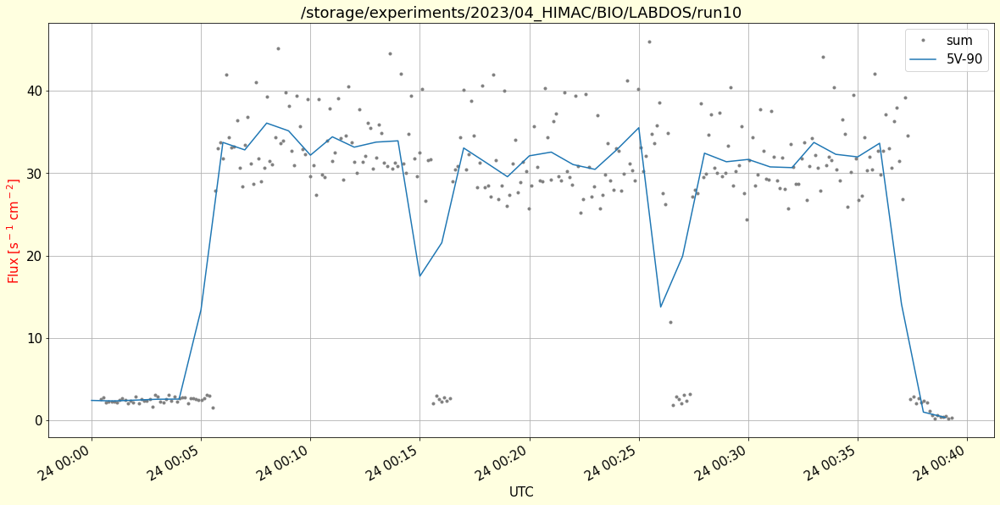

In [245]:
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230422_191414.log'
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230422_195219.log'
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230422_195702.log'
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log'

SWITCH_ON_TIMES = ['2023-04-24 0:0']

plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
df = df.shift(-1,axis=1)
df = df.shift(-1)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1

rc = df.copy()

run = 0
#rc['run'] = np.nan

rc['run'] = SWITCH_ON_TIMES[0]
#rc['run'].fillna(method="ffill", inplace=True)

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
#rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 9

rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

rc['sum'].plot(marker='.', linestyle='', color='gray')
rcc = rc.resample('1T').mean()
rcc['sum'].plot(label='5V-90')

#plt.ylim([0,1.6]) 

plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)
plt.legend()
plt.grid()
plt.xlabel('UTC')


In [12]:
%matplotlib widget
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log'
SWITCH_ON_TIMES = ['2023-04-24 00:00']

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
df = df.shift(-1,axis=1)
df = df.shift(-1)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df.copy()

run = 0
rc['run'] = np.nan

try:
    for x in rc.loc[rc[0]=='$DOS'].index:
        rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
        run += 1
except:
    pass
rc['run'].fillna(method="ffill", inplace=True)

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)


FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()
#ener = rc.loc['2023-04-24 00:10:00':'2023-04-24 00:25:00'].iloc[:,FIRST_CHANNEL:500].sum()
#ener = rc.loc['2023-04-24 00:29:00':'2023-04-24 00:43:00'].iloc[:,FIRST_CHANNEL:500].sum()
#ener = rc.loc['2023-04-24 01:00:00':'2023-04-24 01:25:00'].iloc[:,FIRST_CHANNEL:500].sum()

#ener = rc.loc['2023-04-24 00:50:00':'2023-04-24 01:10:00'].iloc[:,FIRST_CHANNEL:500].sum()
#ener = rc.loc['2023-04-24 00:25:00':'2023-04-24 00:40:00'].iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] , label='5V-90', drawstyle='steps-mid', lw=3)

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()


#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

<IPython.core.display.Javascript object>

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log
0.034 0.016


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/4E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/8B/0.TXT
0.034 0.016


/tmp/ipykernel_359/3386662275.py:98: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
/tmp/ipykernel_359/3386662275.py:98: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
/tmp/ipykernel_359/3386662275.py:98: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/D9/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_7E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_EF/0.TXT
0.034 0.016


/tmp/ipykernel_359/3386662275.py:146: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_B8/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_B8/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_EF/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_7E/0.TXT
0.034 0.016


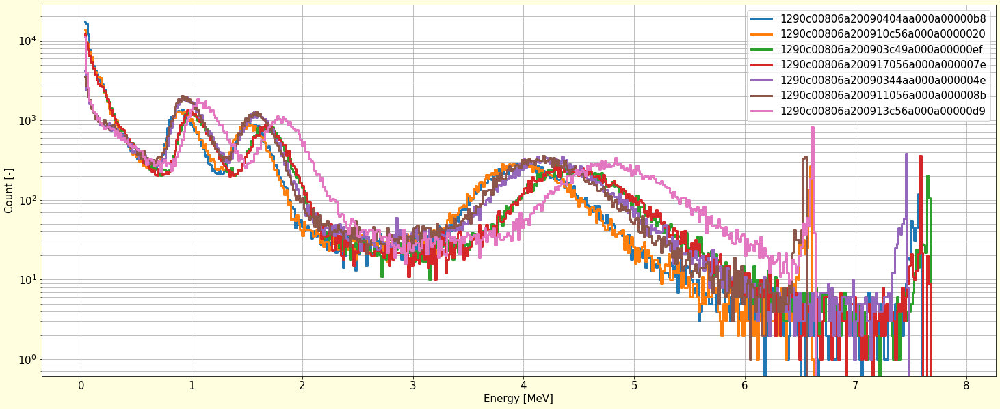

In [74]:
# 4
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 00:15:00':'2023-04-24 02:00:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)


#----------------------------------------------------------------------------------------------------------------------
# 3
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10'

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)

#------------------------------------------------------------------------------
# 5V s krabickou
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log'
SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
df = df.shift(-1,axis=1)
df = df.shift(-1)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

####plt.plot(e3['x'], e3['1'] , label='5V-90', drawstyle='steps-mid', lw=3)


#----------------------------------------------------------------------------------------------------------------------
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17' # 4 s vicky

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    ####plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])+' vicka', drawstyle='steps-mid', lw=3)

#----------------------------------------------------------------------------------------------------------------------
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20' # 4 opacne

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    ###plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])+' opacne', drawstyle='steps-mid', lw=3)






plt.grid(which='minor')
plt.yscale('log')
#plt.xscale('log')
#plt.xlim(0,3)
plt.grid(which='minor')
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.legend()
plt.grid(which='both')


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/4E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/8B/0.TXT
0.034 0.016


/tmp/ipykernel_26111/3986874092.py:98: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
/tmp/ipykernel_26111/3986874092.py:98: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
/tmp/ipykernel_26111/3986874092.py:98: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/D9/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_7E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_EF/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_B8/0.TXT


/tmp/ipykernel_26111/3986874092.py:146: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']


0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17/LABDOS_20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_B8/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_EF/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20/LABDOS_7E/0.TXT
0.034 0.016


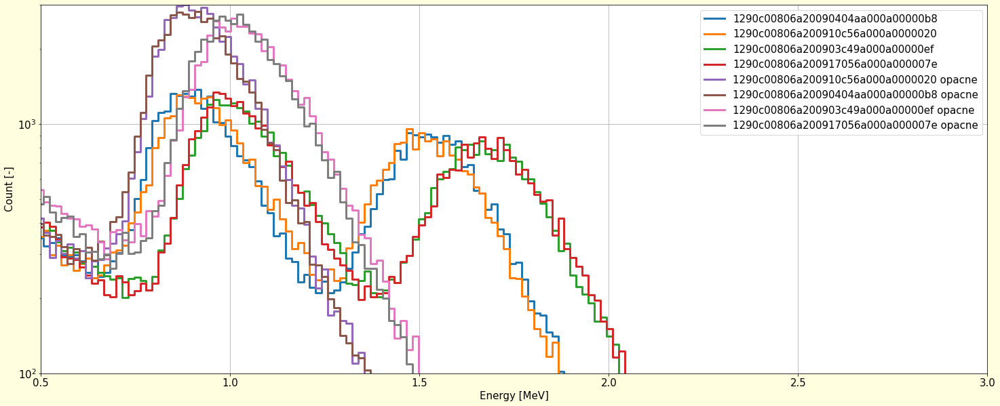

In [279]:
# 4
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 00:15:00':'2023-04-24 02:00:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)


#----------------------------------------------------------------------------------------------------------------------
# 3
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10'

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    ###plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)

#------------------------------------------------------------------------------
# 5V s krabickou
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run13/LABDOS_20230424_191332.log'
SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
df = df.shift(-1,axis=1)
df = df.shift(-1)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.016
coef3[0] = 0.034
#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

#####plt.plot(e3['x'], e3['1'] , label='5V-90', drawstyle='steps-mid', lw=3)


#----------------------------------------------------------------------------------------------------------------------
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17' # 4 s vicky

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    #plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])+' vicka', drawstyle='steps-mid', lw=3)

#----------------------------------------------------------------------------------------------------------------------
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20' # 4 opacne

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])+' opacne', drawstyle='steps-mid', lw=3)





    
plt.yscale('log')
#plt.xscale('log')
plt.xlim(0.5,3)
plt.ylim(100,3000)
plt.grid()
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.legend()


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT
0.0547 0.0164
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT
0.0347 0.0172
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT
0.0377 0.0157
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT
0.0377 0.0157
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/4E/0.TXT
0.0547 0.0164
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/8B/0.TXT


/tmp/ipykernel_29347/779062064.py:121: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.

/tmp/ipykernel_29347/779062064.py:121: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



0.0547 0.0164
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/D9/0.TXT
0.0513 0.0143
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/AmPu/AmPu.TXT
0.0547 0.0164


/tmp/ipykernel_29347/779062064.py:121: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.

/tmp/ipykernel_29347/779062064.py:190: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



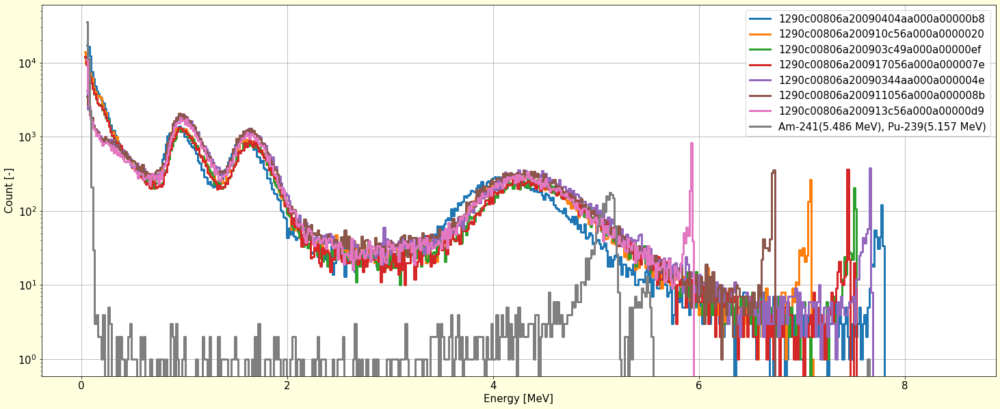

In [20]:
# 4
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 00:15:00':'2023-04-24 02:00:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    sn = str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])[-2:]
    if sn=='8b': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
    if sn=='d9': # 0.0143*x + 0.0513
        coef3[1] = 0.0143
        coef3[0] = 0.0513
    if sn=='7e': # 0.0157*x + 0.0377
        coef3[1] = 0.0157
        coef3[0] = 0.0377
    if sn=='20': # 0.0172*x + 0.0347
        coef3[1] = 0.0172
        coef3[0] = 0.0347
    if sn=='ef': # 0.0157*x + 0.0377
        coef3[1] = 0.0157
        coef3[0] = 0.0377
    if sn=='b8': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
    if sn=='4e': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
 
    #coef3[1] = coef3[1]*1.7
    #coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)


#----------------------------------------------------------------------------------------------------------------------
# 3
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10'

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    sn = str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])[-2:]
    if sn=='8b': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
    if sn=='d9': # 0.0143*x + 0.0513
        coef3[1] = 0.0143
        coef3[0] = 0.0513
    if sn=='7e': # 0.0157*x + 0.0377
        coef3[1] = 0.0157
        coef3[0] = 0.0377
    if sn=='20': # 0.0172*x + 0.0347
        coef3[1] = 0.0172
        coef3[0] = 0.0347
    if sn=='ef': # 0.0157*x + 0.0377
        coef3[1] = 0.0157
        coef3[0] = 0.0377
    if sn=='b8': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
    if sn=='4e': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
    
    #coef3[1] = coef3[1]*1.7
    #coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]


    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)
    
#------------------------------------------------------------------------------
# kalibrace AmPu 0x4E
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/AmPu/AmPu.TXT'
SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.0164
coef3[0] = 0.0547

#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.plot(e3['x'], e3['1'] , label='Am-241(5.486 MeV), Pu-239(5.157 MeV)', drawstyle='steps-mid', lw=3)
    


plt.yscale('log')
#plt.xscale('log')
#plt.xlim(0.5,3)
#plt.ylim(100,3000)
plt.grid()
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.legend()


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT


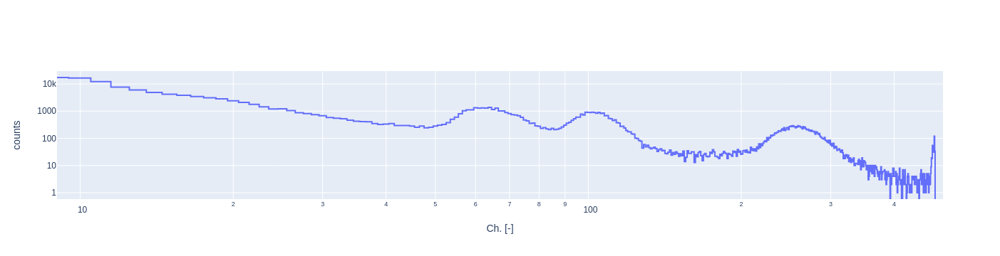

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT


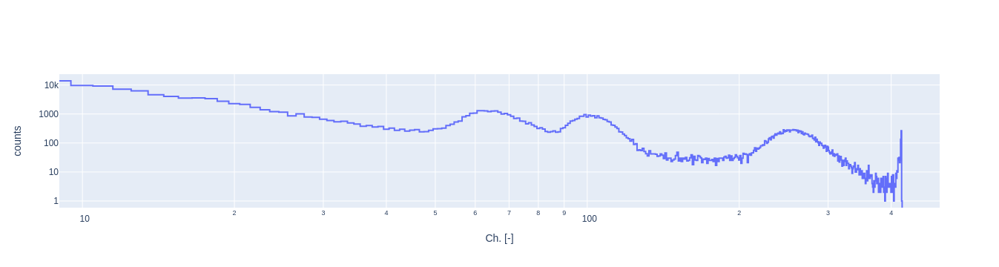

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT


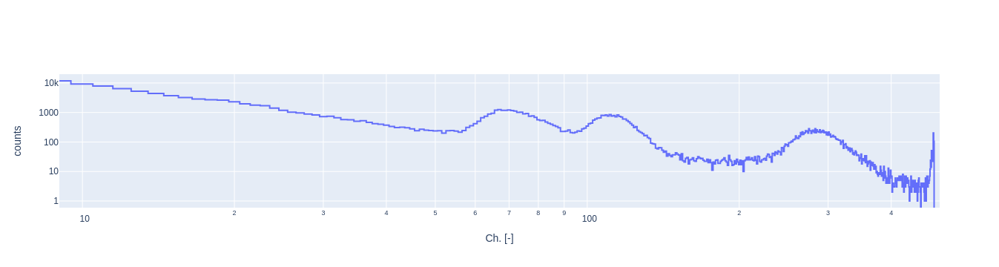

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT


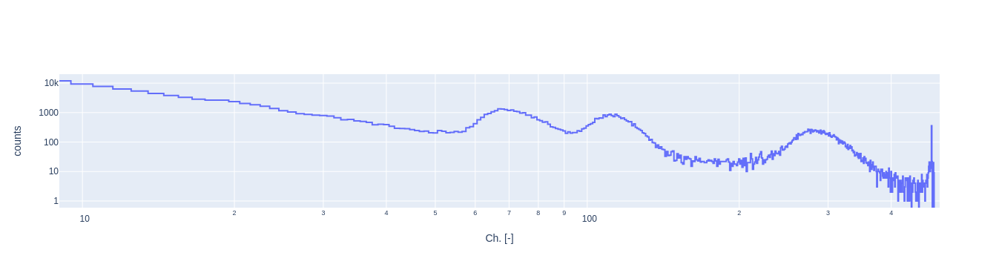

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/4E/0.TXT


/tmp/ipykernel_5835/1259090173.py:114: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



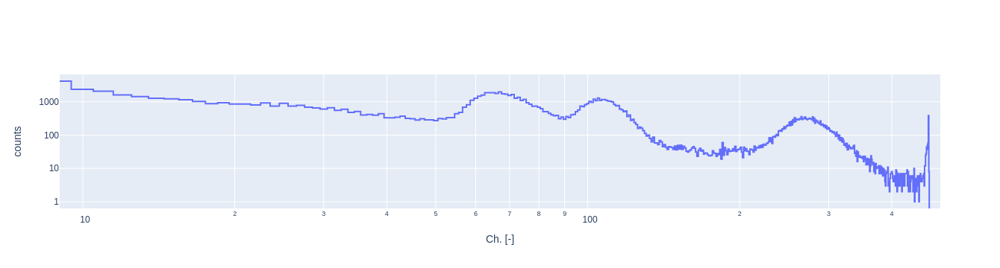

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/8B/0.TXT


/tmp/ipykernel_5835/1259090173.py:114: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



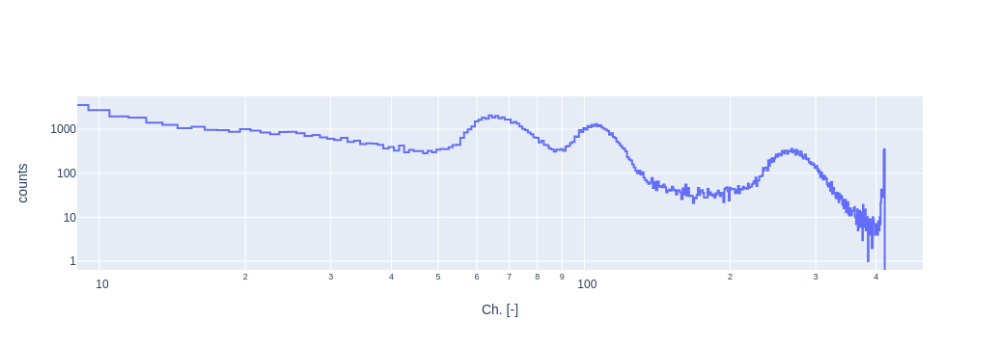

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/D9/0.TXT


/tmp/ipykernel_5835/1259090173.py:114: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



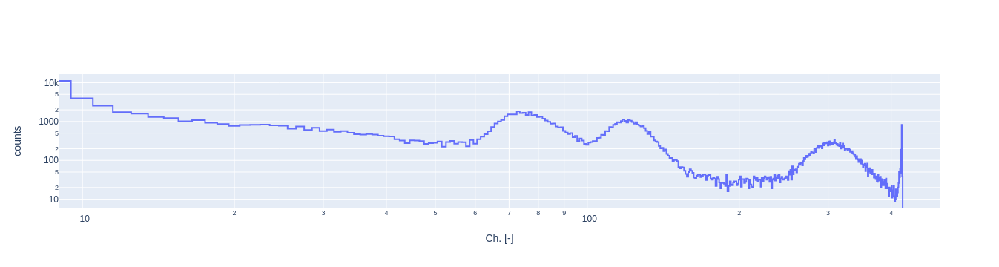

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/AmPu/AmPu.TXT


/tmp/ipykernel_5835/1259090173.py:147: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



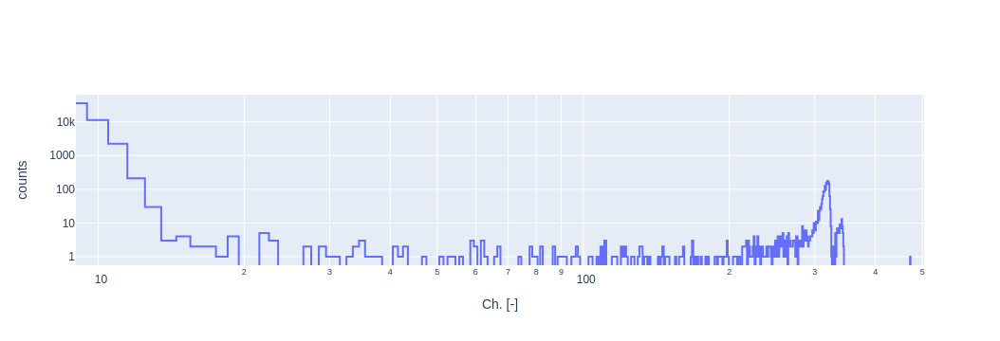

In [21]:
import plotly.graph_objs as go

def plot_ly(label):
    data = [
        go.Scatter(
            x=ener.index,
            y=ener,
            name=label,
            yaxis='y',
            line=dict(
            shape='hvh'
            )
        )    
        ]

    layout = go.Layout(
        #title='LABDOS',
        yaxis=dict(
            title='counts',
            type='log',
            #range = [0,40000]
        ),
        xaxis=dict(
            type='log',
            title='Ch. [-]',
        )
    )

    fig = go.Figure(data=data, layout=layout)
    fig.show()
    
# 4
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 00:15:00':'2023-04-24 02:00:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    plot_ly(str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]))


#----------------------------------------------------------------------------------------------------------------------
# 3
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10'

ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:0','2023-04-24 0:0']


for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    rc = rc.loc['2023-04-24 02:15:00':'2023-04-24 02:47:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    plot_ly(str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]))
    
#------------------------------------------------------------------------------
# kalibrace AmPu
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/AmPu/AmPu.TXT'
SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

plot_ly('AmPu')


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT


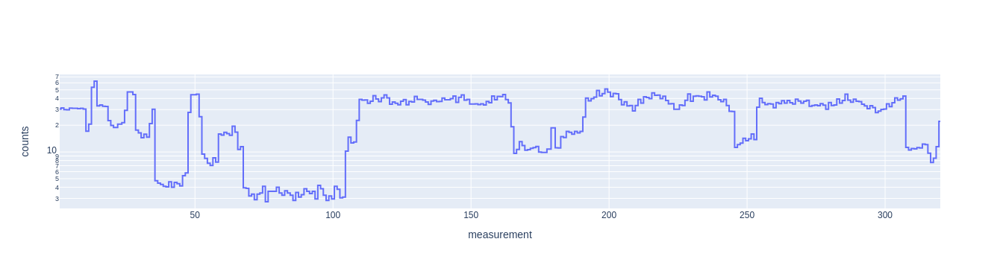

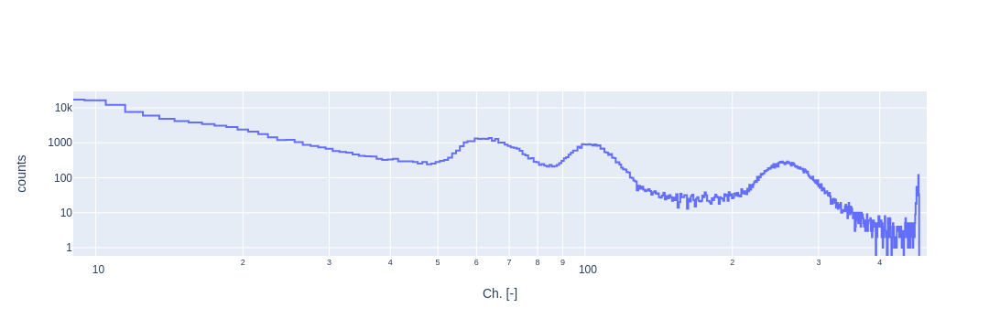

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT


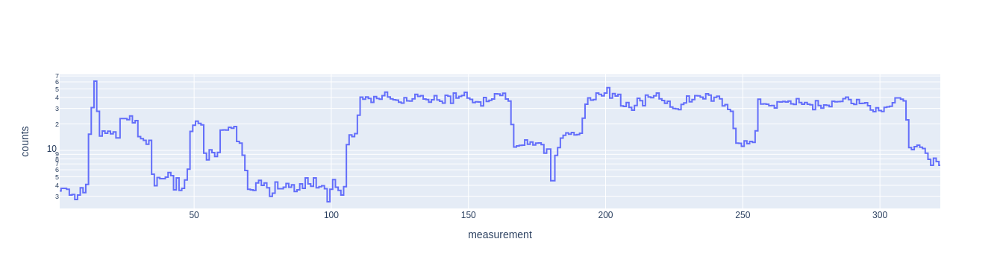

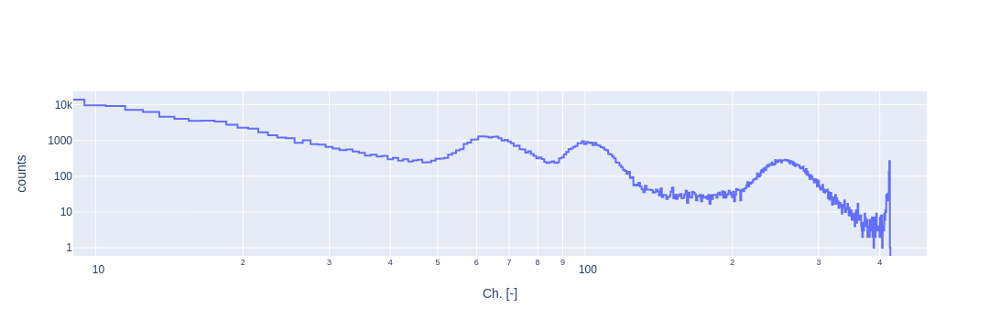

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT


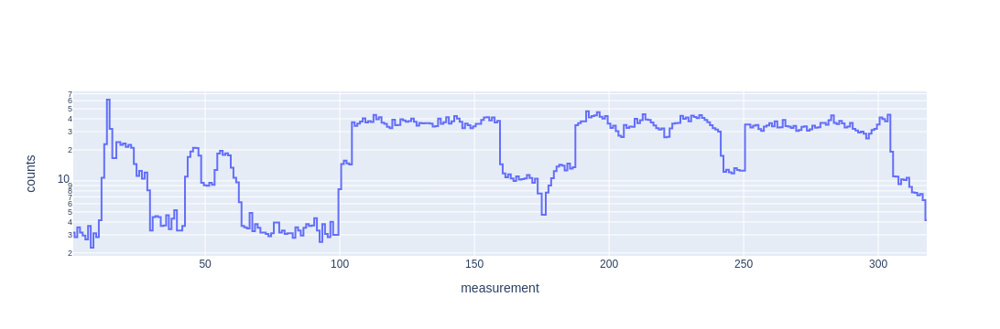

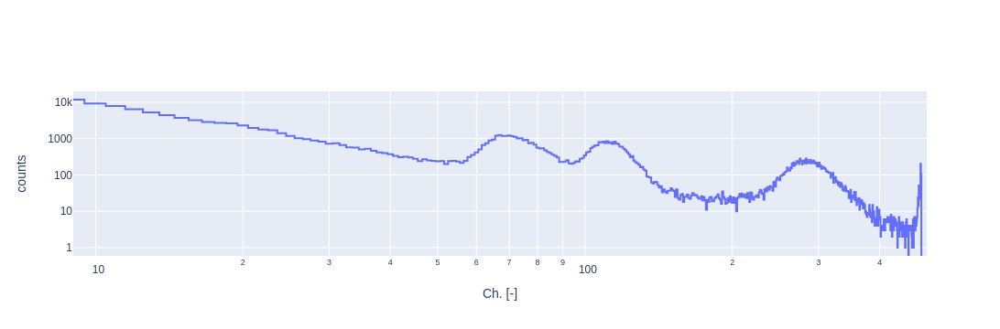

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT


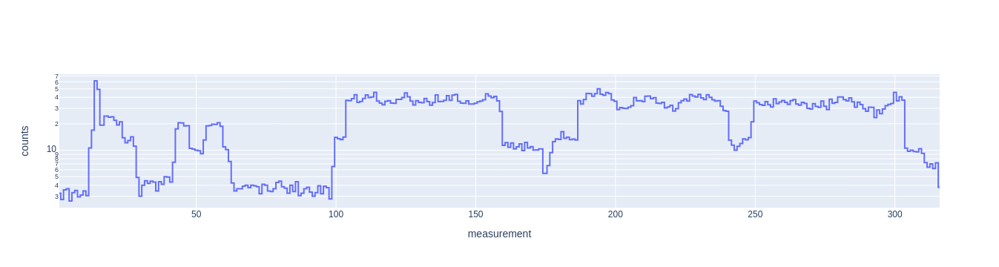

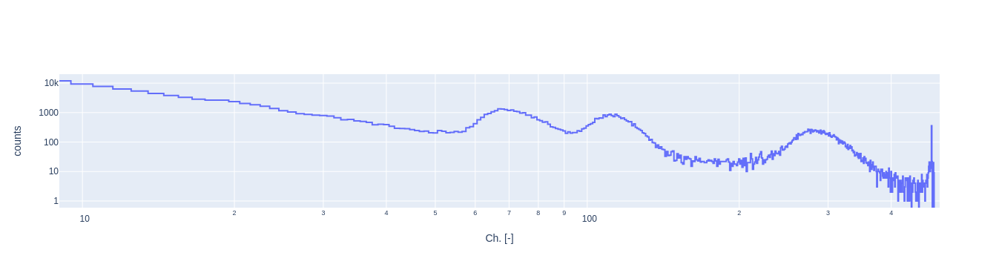

In [2]:
import plotly.graph_objs as go

def plot_lyly(label):
    data = [
        go.Scatter(
            x=rc.index,
            y=rc['sum'],
            name=label,
            yaxis='y',
            line=dict(
            shape='hvh'
            )
        )    
        ]

    layout = go.Layout(
        #title='LABDOS',
        yaxis=dict(
            title='counts',
            type='log',
            #range = [0,40000]
        ),
        xaxis=dict(
            #type='log',
            title='measurement',
        )
    )

    fig = go.Figure(data=data, layout=layout)
    fig.show()


def plot_ly(label):
    data = [
        go.Scatter(
            x=ener.index,
            y=ener,
            name=label,
            yaxis='y',
            line=dict(
            shape='hvh'
            )
        )    
        ]

    layout = go.Layout(
        #title='LABDOS',
        yaxis=dict(
            title='counts',
            type='log',
            #range = [0,40000]
        ),
        xaxis=dict(
            type='log',
            title='Ch. [-]',
        )
    )

    fig = go.Figure(data=data, layout=layout)
    fig.show()
    
# 4
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    rc = df.loc[df[0]=='$HIST'].copy()
        
    FIRST_CHANNEL = 9

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2
    
    #rc=rc.iloc[256:305]

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    plot_lyly(f)
    plot_ly(f)



# Am Pu vypocet sirky kanalu

/storage/experiments/2023/10_labdos_tests/EF/0.TXT


/tmp/ipykernel_19884/3569082050.py:28: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-04-24 00:02:00':]


0.06 0.0146


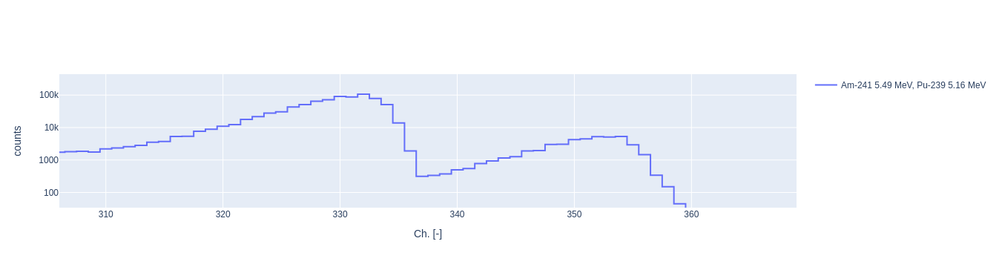

In [2]:
    
#------------------------------------------------------------------------------
# kalibrace AmPu 0x4E
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/AmPu/AmPu.TXT'
f = '/storage/experiments/2023/10_labdos_tests/EF/0.TXT' #  Uranove sklo

SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
rc = rc.loc['2023-04-24 00:02:00':]

FIRST_CHANNEL = 7

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.0146
coef3[0] = 0.060

#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    
data = [
    go.Scatter(
        x=e3['i'],
        y=e3['1'],
        name='Am-241 5.49 MeV, Pu-239 5.16 MeV',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Ch. [-]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(showlegend=True)
fig.show()




# Am Pu LABDOS01B 

/storage/experiments/2023/12_Korea_calibration/26/0.TXT
0.06 0.0146


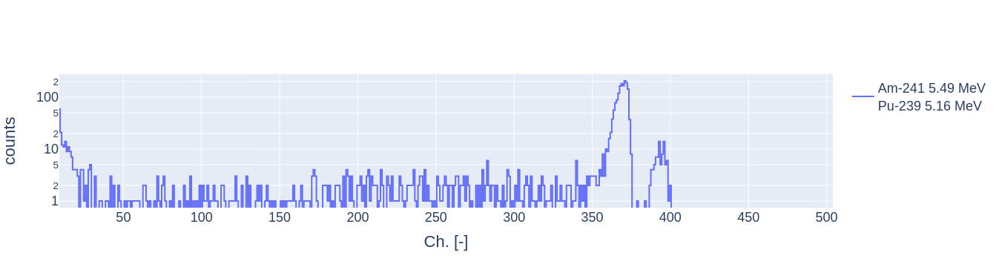

In [96]:
    
f = '/storage/experiments/2023/12_Korea_calibration/67_3n3/0.TXT' # 3n3 ve filtrech
f = '/storage/experiments/2023/12_Korea_calibration/67_1n/0.TXT' # 1n ve filtrech
f = '/storage/experiments/2023/12_Korea_calibration/67_3k6/0.TXT'
f = '/storage/experiments/2023/12_Korea_calibration/8B/0.TXT' # Korea
f = '/storage/experiments/2023/12_Korea_calibration/26/0.TXT' # Korea

SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,520))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
#rc = rc.loc['2023-04-24 00:02:00':]

FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.0146
coef3[0] = 0.060

#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    
data = [
    go.Scatter(
        x=e3['i'],
        y=e3['1'],
        name='Am-241 5.49 MeV<br>Pu-239 5.16 MeV',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Ch. [-]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(showlegend=True, font=dict(size=18))
fig.show()




In [ ]:
    
#------------------------------------------------------------------------------
# kalibrace AmPu 0x4E
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/AmPu/AmPu.TXT'
f = '/storage/experiments/2023/10_labdos_tests/EF/0.TXT' #  Uranove sklo

SWITCH_ON_TIMES = ['2023-04-24 00:00']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
#rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 9

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.0146
coef3[0] = 0.060

#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    
data = [
    go.Scatter(
        x=e3['x'],
        y=e3['1'],
        name='Am-241 5.49 MeV, Pu-239 5.16 MeV',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Energy [MeV]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(showlegend=True)
fig.show()




## Solving linear equation

In [114]:
'''
Solve the system of equations x0 + 2 * x1 = 1 and 3 * x0 + 5 * x1 = 2:

a = np.array([[1, 2], [3, 5]])
b = np.array([1, 2])
x = np.linalg.solve(a, b)
x
array([-1.,  1.])

5.157 = 332 * x + 0.134 * w
5.486 = 354 * x + 0.139 * w 


Channel width: 13 keV
Entrance window: 1.02 µm
Zero offset: Ch. 514 (from 0 to 1023)
Zero ($HIST ≔ 0): column 5 
First channel without noise ($HIST ≔ 0): column 9 
Uncertainty of zero: +26 keV
Effective channels (from the first channel without noise): 509
Device range: 6.94 + 0.5 MeV

'''
offset = 514 # 8B
offset = 513 # 26
zero_culomn = 5
zero_noise_culomn = 9
maxchannel = 1023
column_range = maxchannel - offset
A = np.array([[368-zero_culomn, 0.134], [392-zero_culomn, 0.139]]) # LABDOS01B Korea s.n. 8B
A = np.array([[371-zero_culomn, 0.134], [396-zero_culomn, 0.139]]) # LABDOS01B Korea s.n. 26
b = np.array([5.157, 5.486])
x = np.linalg.solve(A, b)
print('Channel width:', round(x[0],4), '[MeV]')
print('Entrance window thickness:', round(x[1],2), '[\u03BCm]')
print('Pu', A[0,0], b[0], round(b[0] - A[0,1]*x[1],3))
print('Am', A[1,0], b[1], round(b[1] - A[1,1]*x[1],3))
print('Effective channels (from the first channel without noise):', column_range - (zero_noise_culomn - zero_culomn))
print('Channels range:', maxchannel - offset)
print('Range calculated from ch. width:', round(x[0] * (1+ maxchannel - offset),1),'[MeV]')
print('Range calculated from Am ch.:', round(((b[1] - A[1,1]*x[1]) / A[1,0]) * (maxchannel - offset),1),'[MeV]')
print('Energy in the 1st channel without noise:', round(x[0] * ( 1+ zero_noise_culomn - zero_culomn),3), '[MeV]')

Channel width: 0.012 [MeV]
Entrance window thickness: 5.6 [μm]
Pu 366.0 5.157 4.407
Am 391.0 5.486 4.708
Effective channels (from the first channel without noise): 506
Channels range: 510
Range calculated from ch. width: 6.2 [MeV]
Range calculated from Am ch.: 6.1 [MeV]
Energy in the 1st channel without noise: 0.06 [MeV]


/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT
0.0 0.015


/tmp/ipykernel_9557/3011389129.py:24: FutureWarning:

Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.



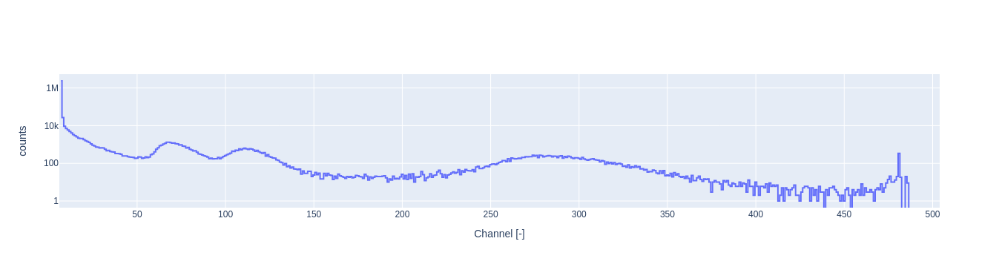

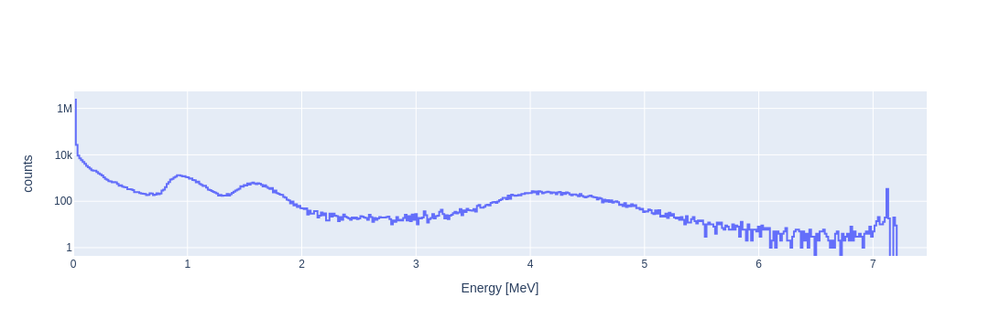

In [73]:
f = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT'
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 6

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.015
coef3[0] = 0.0

#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    
data = [
    go.Scatter(
        x=e3['i'],
        y=e3['1'],
        name='HIMAC',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Channel [-]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()

data = [
    go.Scatter(
        x=e3['x'],
        y=e3['1'],
        name='HIMAC',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Energy [MeV]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()




In [8]:
e3

,1,i,x
6,1648816273167151677516393168421669116602128811...,6,0.000
7,2393796.0,7,0.015
8,27070.0,8,0.030
9,9277.0,9,0.045
10,7089.0,10,0.060
...,...,...,...
500,0.0,500,7.410
501,0.0,501,7.425
502,0.0,502,7.440
503,0.0,503,7.455


# spectra

In [39]:
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3' # 4
#fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10' # 3
#fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run17' # 4 s vicky
#fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run20' # 4 opacne
#fto = '/storage/experiments/2023/04_labdos_BaCs/2nd'
fto = '/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS'
fto = '/storage/experiments/2023/05_CERF/16052023/LABDOS'
fto = '/storage/experiments/2023/05_CERF/15052023/LABDOS'


/storage/experiments/2023/05_CERF/15052023/LABDOS/4E/0.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/20/1.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/20/0.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/B8/0.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/D9/0.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/D9/1.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/7E/0.TXT
/storage/experiments/2023/05_CERF/15052023/LABDOS/EF/0.TXT


Text(0.5, 0, 'Measurement No.')

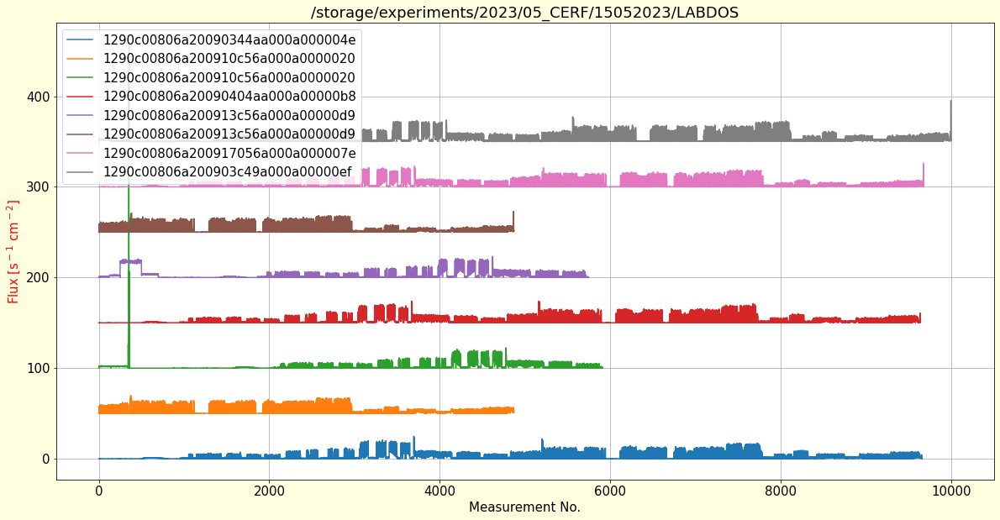

In [40]:
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
#ftt = glob.iglob(fto+"/*.TXT") # generator, search immediate subdirectories 

plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

offset = 0

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    #df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    rc = df.loc[:].copy()
    #rc = df.iloc[ df.loc[df[0]=='$DOS'].index[1]:].copy()

    rc[2] = pd.to_numeric(rc[2])
    
    FIRST_CHANNEL = 10

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

    ###rc['sum'].plot(marker='.', linestyle='', color='gray')
    #rcc = rc.resample('1T').mean()
    (rc['sum']+offset).plot(label=str(rc.loc[rc[0]=='$DOS'][[6]].iloc[0,0]))
    offset += 50

    #plt.ylim([0,20])
    #break

plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(fto)
plt.legend()
plt.grid()
plt.xlabel('Measurement No.')
#plt.xlim(3000,3400)

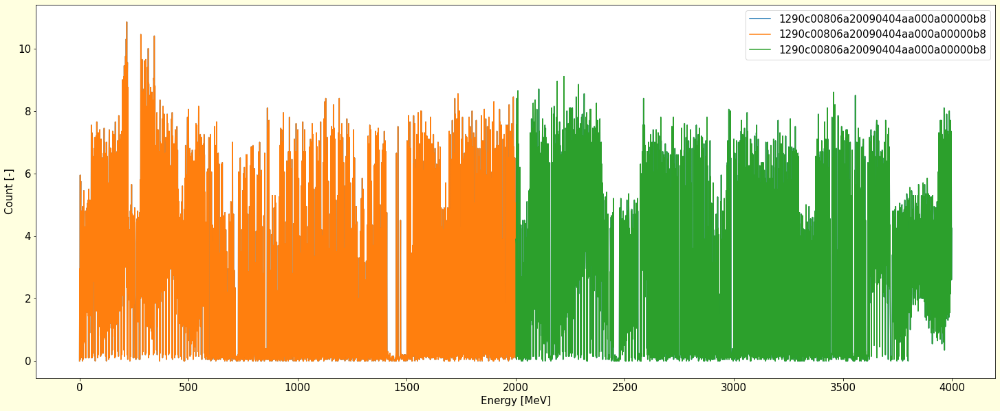

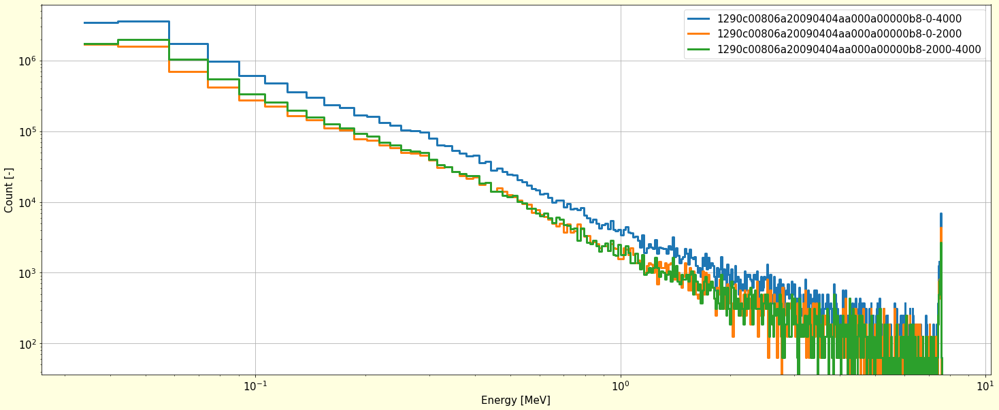

In [22]:
SN = 'B8'

def flux(file, start, end):
    l=[]
    l.extend(range(0,505))
    df = pd.read_csv(file, sep=',', header=None, names=l, comment='*', low_memory=False)

    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    rc = df.iloc[start:end].copy()
    #rc = df.iloc[ df.loc[df[0]=='$DOS'].index[1]:].copy()

    rc[2] = pd.to_numeric(rc[2])
    
    FIRST_CHANNEL = 9

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2    
    #rc = rc.loc[rc['sum']<2]

    ###rc['sum'].plot(marker='.', linestyle='', color='gray')
    #rcc = rc.resample('1T').mean()
    (rc['sum']).plot(label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]))

    #plt.ylim([0,30])
    
def spectrum(file, start, end):
    #end = start+100
    #end = start+20
    l=[]
    l.extend(range(0,505))
    df = pd.read_csv(file, sep=',', header=None, names=l, comment='*', low_memory=False)

    FIRST_CHANNEL = 9
    
    rc = df.iloc[start:end].copy()

    rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2    
    #rc = rc.loc[rc['sum']<1]

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.plot(e3['x'], e3['1']/coef3[1] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])+'-'+str(start)+'-'+str(end), drawstyle='steps-mid', lw=3)
    #plt.ylim(0.0001,100)

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
#plt.yscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()

#spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_8B.TXT',420) # 420, 590
#spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_D9.TXT',300) # 300, 510
#spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_B8.TXT',510) # 300, 510
#spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_4E.TXT',570) # 410, 570

#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT', 120) # 120, 200, 260
#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT', 120)
#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT', 120)
#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT', 120)

#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/4E/0.TXT', 790) # 790, 850, 910
#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/8B/0.TXT', 790)
#spectrum('/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run10/D9/0.TXT', 790)

#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 2000, 9000)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 2250, 2250+240)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 3250, 3250+160)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 4350, 4350+80)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 4900, 4900+240)

#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 1000, 5000)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 1200, 1200+240)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 2200, 2200+160)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 3250, 3250+80)
#flux('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 3750, 3750+240)

flux('/storage/experiments/2023/05_CERF/16052023/LABDOS/'+SN+'/0.TXT', 0, 4000)
flux('/storage/experiments/2023/05_CERF/16052023/LABDOS/'+SN+'/0.TXT', 0, 2000)
flux('/storage/experiments/2023/05_CERF/16052023/LABDOS/'+SN+'/0.TXT', 2000, 4000)

plt.legend()

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 2000, 9000)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 2250, 2250+240)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 3250, 3250+160)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 4350, 4350+80)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/20/0.TXT', 4900, 4900+240)

#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 1000, 5000)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 1200, 1200+240)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 2200, 2200+160)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 3250, 3250+80)
#spectrum('/storage/experiments/2023/05_CERF/PRG_GVA/LABDOS/'+SN+'/0.TXT', 3750, 3750+240)

spectrum('/storage/experiments/2023/05_CERF/16052023/LABDOS/'+SN+'/0.TXT', 0, 4000)
spectrum('/storage/experiments/2023/05_CERF/16052023/LABDOS/'+SN+'/0.TXT', 0, 2000)
spectrum('/storage/experiments/2023/05_CERF/16052023/LABDOS/'+SN+'/0.TXT', 2000, 4000)
#spectrum('/storage/experiments/2023/05_CERF/15/LABDOS/'+SN+'/0.TXT', 8000, 8500)
plt.legend()

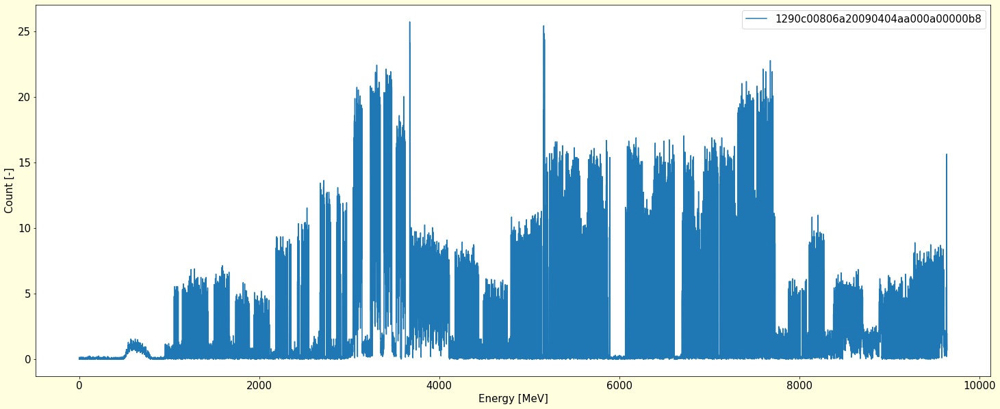

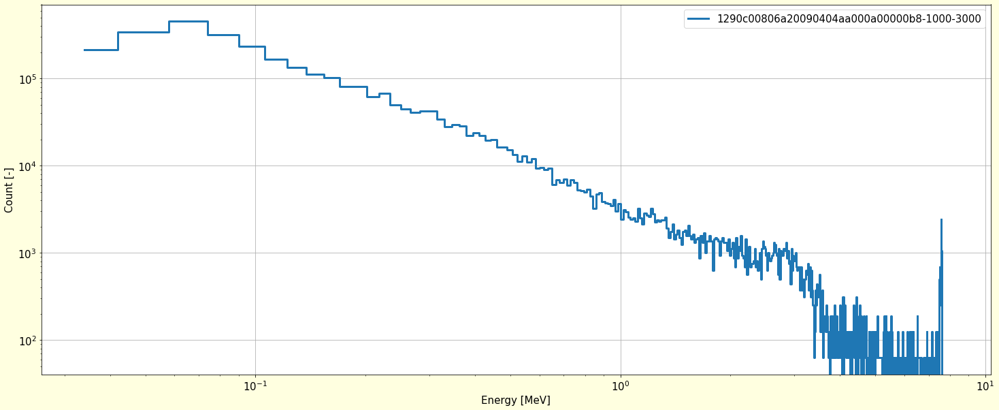

In [23]:
SN = 'B8'

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
#plt.yscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
flux('/storage/experiments/2023/05_CERF/15052023/LABDOS/'+SN+'/0.TXT', 0, 20000)
plt.legend()

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
spectrum('/storage/experiments/2023/05_CERF/15052023/LABDOS/'+SN+'/0.TXT', 1000, 3000)
plt.legend()


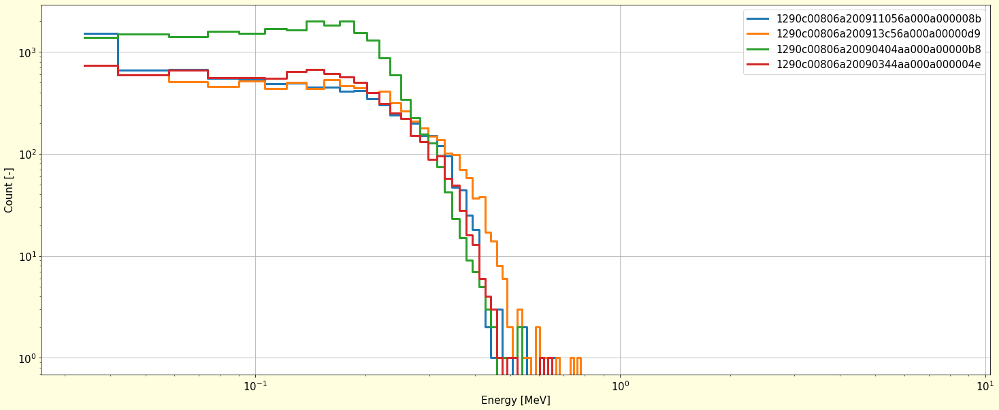

In [27]:
def spectrum(file, start):
    end = start+100
    l=[]
    l.extend(range(0,505))
    df = pd.read_csv(file, sep=',', header=None, names=l, comment='*', low_memory=False)

    FIRST_CHANNEL = 9

    ener = df.iloc[start:end].iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.plot(e3['x'], e3['1'] , label=str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()

spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_8B.TXT',590) # 420, 590
spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_D9.TXT',510) # 300, 510
spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_B8.TXT',300) # 300, 510
spectrum('/storage/experiments/2023/04_labdos_BaCs/2nd/LABDOS_4E.TXT',410) # 410, 570

plt.legend()



/storage/experiments/2023/05_CERF/15052023/LABDOS/4E/0.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/20/1.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/20/0.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/B8/0.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/D9/0.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/D9/1.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/7E/0.TXT
0.034 0.015
/storage/experiments/2023/05_CERF/15052023/LABDOS/EF/0.TXT
0.034 0.015


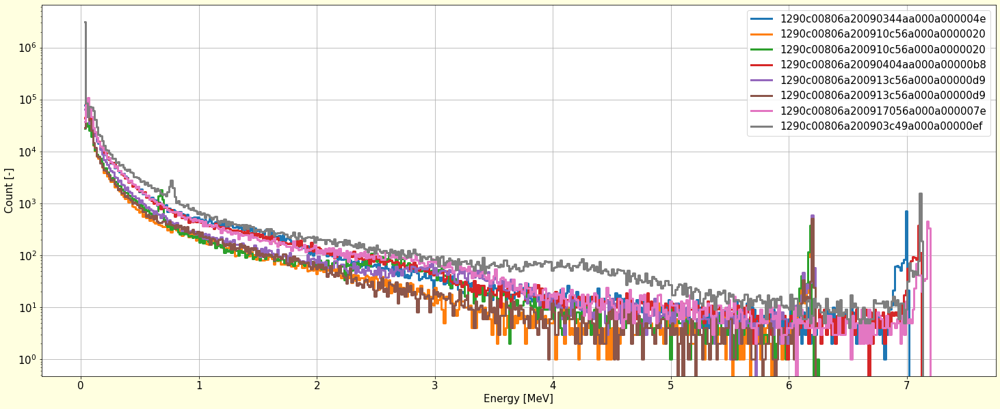

In [6]:
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
#ftt = glob.iglob(fto+"/*.TXT") # generator, search immediate subdirectories 

plt.figure(figsize=(25,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    #df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    rc = df.copy()
    
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()
    #ener = rc.iloc[300:400].iloc[:,FIRST_CHANNEL:500].sum()

    coef3 = np.array([0.,0.])
    coef3[1] = 0.015
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.yscale('log')
    #plt.xscale('log')

    plt.plot(e3['x'], e3['1'] , label=str(rc.loc[rc[0]=='$DOS'][[6]].iloc[0,0]), drawstyle='steps-mid', lw=3)

plt.xlabel('Energy [MeV]')
plt.ylabel('Count [-]')
plt.grid()
plt.legend()


#plt.xticks(np.arange(0, 10, 1))
#plt.xlim(0,2)
#plt.vlines(0.511,1,1e4, color='red')

None

/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/B8/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/20/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/7E/0.TXT
0.034 0.016
/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3/EF/0.TXT
0.034 0.016


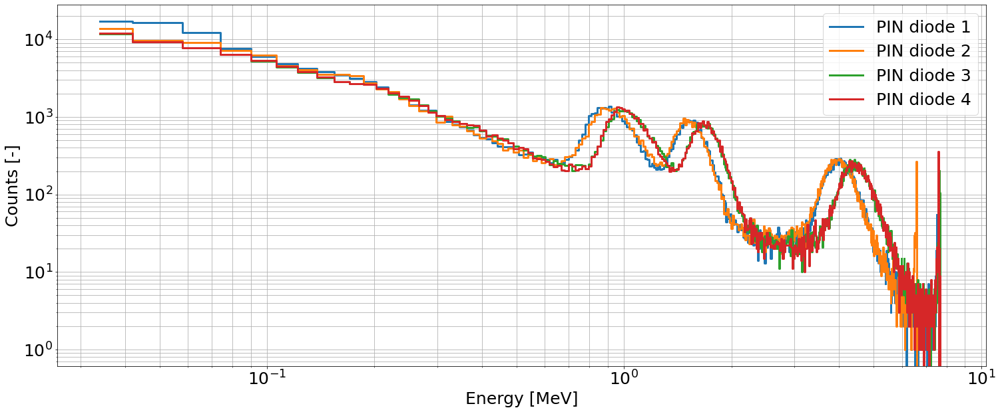

In [89]:
# 4
fto = '/storage/experiments/2023/04_HIMAC/BIO/LABDOS/run1-3'
ftt = glob.iglob(fto+"/**/*.TXT") # generator, search immediate subdirectories 
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

plt.figure(figsize=(25,10))#, facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 25})

for f in ftt:
    l=[]
    l.extend(range(0,505))

    df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = df.reset_index(drop=True)
    print(f)
    
    df[2] = df[2].apply(pd.to_numeric, errors='coerce')

    df['runtime'] = np.nan
    df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
    df.loc[df[0]=='$DOS','seconds'] = 0
    df['runtime'] = df['seconds'].diff() * -1
    rc = df

    run = 0
    rc['run'] = np.nan

    try:
        for x in rc.loc[rc[0]=='$DOS'].index:
            rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
            run += 1
    except:
        pass
    rc['run'].fillna(method="ffill", inplace=True)

    rc[2] = pd.to_numeric(rc[2])
    rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
    rc.set_index(rc['time'], drop=False, inplace=True)
    #rc = rc.loc['2023-04-24 00:15:00':'2023-04-24 02:00:00']
    
    FIRST_CHANNEL = 9

    ener = rc.iloc[:,FIRST_CHANNEL:500].sum()

    sn = str(df.loc[df[0]=='$DOS'][[6]].iloc[0,0])[-2:]
    if sn=='8b': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
    if sn=='d9': # 0.0143*x + 0.0513
        coef3[1] = 0.0143
        coef3[0] = 0.0513
    if sn=='7e': # 0.0157*x + 0.0377
        coef3[1] = 0.0157
        coef3[0] = 0.0377
        name='4'
    if sn=='20': # 0.0172*x + 0.0347
        coef3[1] = 0.0172
        coef3[0] = 0.0347
        name='2'
    if sn=='ef': # 0.0157*x + 0.0377
        coef3[1] = 0.0157
        coef3[0] = 0.0377
        name='3'
    if sn=='b8': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547
        name='1'
    if sn=='4e': # 0.0164*x + 0.0547
        coef3[1] = 0.0164
        coef3[0] = 0.0547

    coef3 = np.array([0.,0.])
    coef3[1] = 0.016
    coef3[0] = 0.034
    #0.034 MeV + ch * 0.016 MeV

    print (coef3[0], coef3[1])

    e3 = pd.DataFrame()
    e3['1'] = ener
    e3['i'] = ener.index
    e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    plt.plot(e3['x'], e3['1'] , label='PIN diode '+name, drawstyle='steps-mid', lw=3)



plt.grid(which='minor')
plt.yscale('log')
plt.xscale('log')
#plt.xlim(3e-1,10)
plt.grid(which='minor')
plt.xlabel('Energy [MeV]')
plt.ylabel('Counts [-]')
plt.legend()
plt.grid(which='both')


In [21]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

rcc = rc.loc['2023-04-22 16:00':'2023-04-23 2:30'] # WAW-NRT

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.0164
coef3[0] = 0.0547
coef3[0] = 0.1

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e3['x'], e3['1'] * 1.1 / coef3[1], label='LABDOS', drawstyle='steps-mid')


#liulin_data = liulin_data.loc['2023-04-22 16:00':'2023-04-23 2:30'] # WAW-NRT

ener = liulin_data.iloc[:,0:250].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.05
coef3[0] = 0.1
#coef3[0] = 0.600

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
#plt.grid()
plt.legend()


None

NameError: name 'rc' is not defined

<Figure size 1080x720 with 0 Axes>

# CERF
## Liulin

In [465]:
filename = '/storage/experiments/2023/05_CERF/15052023/LIULIN/2305150921_01.y10' # nic +20 minut
#filename = '/storage/experiments/2023/05_CERF/15052023/LIULIN/2305151327_00.y14' # hrb (pozice u zdi)
#filename = '/storage/experiments/2023/05_CERF/15052023/LIULIN/2305151326_00.y15' # hrb (pozice u zdi)
#filename = '/storage/experiments/2023/05_CERF/15052023/LIULIN/2305150929_01.y16' # placka +15 minut


# extract time
path = filename.split('/')
time = path[-1].split('_')
print (time)
date_object = datetime.datetime.strptime(time[0], '%y%m%d%H%M')
print (date_object)

# read data
liulin = pd.read_csv(filename, header = None, sep = ' ', skiprows = 1) # read Liulin data Y
liulin = liulin.drop(256, axis=1) # delete last empty column
infile = open(filename, 'r')
header = infile.readline()
print (header) # print data header
exposition = header.split(' ')[4].split('[')[0] # extract exposition time  
exposition_val = float(exposition)
exposition += 'S'
print (exposition)

# compute time series
#dates = pd.date_range(date_object, freq='5T', periods=len(liulin)).tolist()


['2305150921', '01.y10']
2023-05-15 09:21:00
MDU-10  EXPOSITION = 10[sec]

10S


In [466]:
time_offset = 20
liulin['time'] = date_object + pd.to_timedelta(liulin.index * exposition_val, unit='s') + pd.to_timedelta(time_offset, unit='min')
#rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
liulin_data = liulin
liulin.set_index('time', drop=False, inplace=True)

In [341]:
time_offset = 0
liulin['time'] = date_object + pd.to_timedelta(liulin.index * exposition_val, unit='s') + pd.to_timedelta(time_offset, unit='min')
#rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
liulin_data3 = liulin
liulin.set_index('time', drop=False, inplace=True)

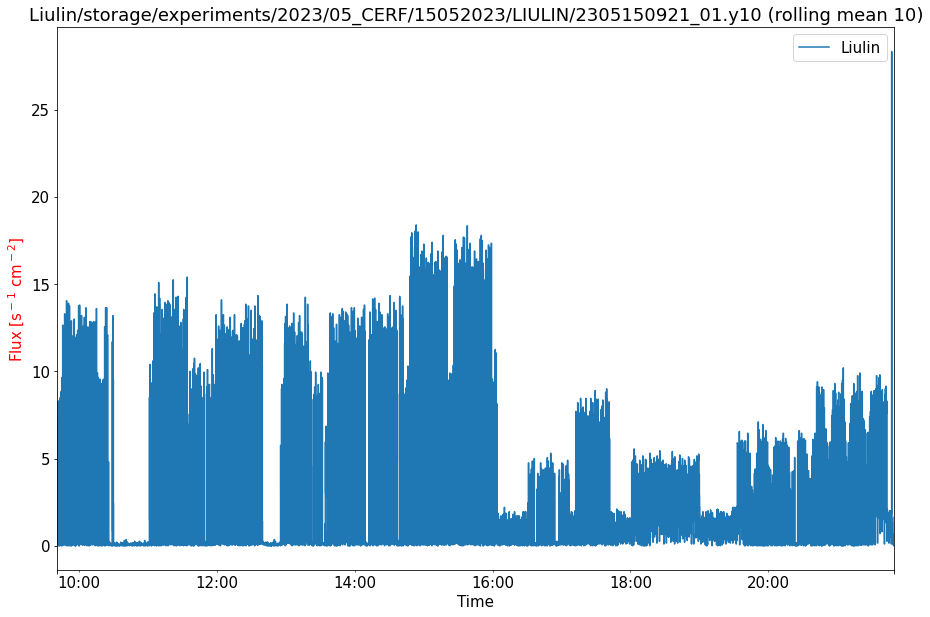

In [467]:
liulin_data['flux'] = liulin_data.iloc[:,0:255].sum(axis=1)/exposition_val/2

WINDOW = 10
#liulin_data['flux'] = liulin_data['flux'].rolling(WINDOW).mean()

#liulin_data
plt.figure(figsize=(15, 10))
matplotlib.rcParams.update({'font.size': 15})
liulin_data['flux'].plot(drawstyle='steps', label='Liulin')
plt.title('Liulin' + filename + ' (rolling mean ' + str(WINDOW) + ')')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.xlabel('Time')
#plt.ylim(0, 20)
plt.legend()


0.1 0.05


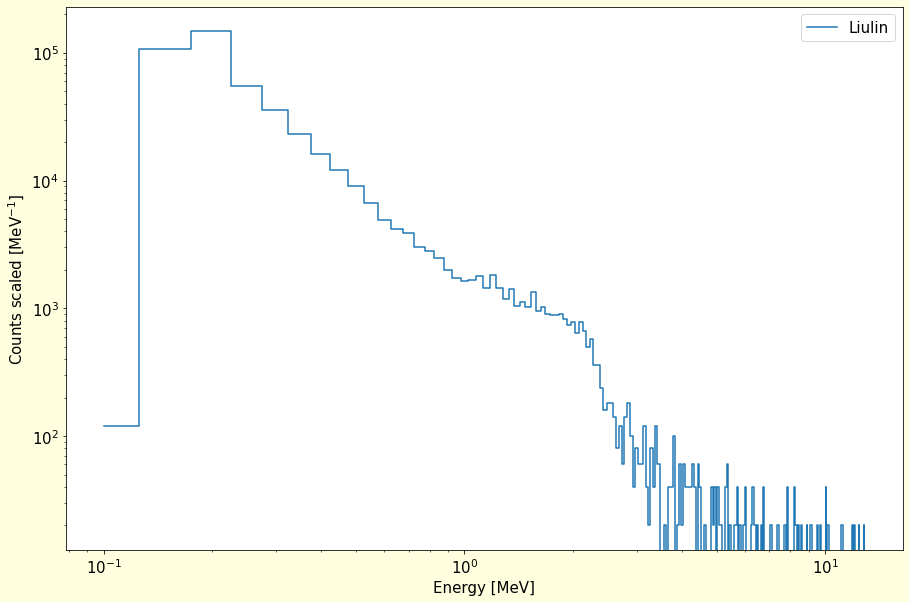

In [468]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

liulin_data2 = liulin_data.loc['2023-05-15 20:34:00':'2023-05-15 23:00']

ener = liulin_data2.iloc[:,0:256].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.05
coef3[0] = 0.1
#coef3[0] = 0.600

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin', drawstyle='steps-mid')
#plt.plot(e3['x'], e3['1'], label='Liulin', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
#plt.grid()
plt.legend()


None

# LABDOS

In [469]:
f = '/storage/experiments/2023/05_CERF/15052023/LABDOS/4E/0.TXT'
#f = '/storage/experiments/2023/05_CERF/15052023/LABDOS/7E/0.TXT'
#f = '/storage/experiments/2023/05_CERF/15052023/LABDOS/B8/0.TXT'
#f = '/storage/experiments/2023/05_CERF/15052023/LABDOS/EF/0.TXT'
#f = '/storage/experiments/2023/05_CERF/15052023/LABDOS/D9/0.TXT'
#f = '/storage/experiments/2023/05_CERF/15052023/LABDOS/20/0.TXT'

SWITCH_ON_TIMES = ['2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-13 0:0','2023-05-14 10:20','2023-05-15 7:10']
SWITCH_ON_TIMES = ['2023-05-12 0:0','2023-05-13 0:0','2023-05-14 10:20','2023-05-15 7:10']

l=[]
l.extend(range(0,505))
df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df.copy()

run = 0
rc['run'] = np.nan

try:
    for x in rc.loc[rc[0]=='$DOS'].index:
        rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
        run += 1
except:
    pass
rc['run'].fillna(method="ffill", inplace=True)

pd.set_option('display.max_rows', rc.shape[0]+1)
print(rc.loc[rc[0]=='$DOS'][[0,1,2,3,4,5,6, 'run', 'runtime']])
#print(rc.loc[rc[0]=='$AIRDOS'][[0,1, 'runtime']])
pd.set_option('display.max_rows', 10)

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)

#!!!!!!!!!!!!!!!
#rc = rc.iloc[1:4745]

         0          1   2    3                                         4  \
0     $DOS  LABDOS01A NaN  517  71cdf196883fa3ab648ae47327ef2137eb69420f   
6     $DOS  LABDOS01A NaN  517  71cdf196883fa3ab648ae47327ef2137eb69420f   
947   $DOS  LABDOS01A NaN  517  71cdf196883fa3ab648ae47327ef2137eb69420f   
4831  $DOS  LABDOS01A NaN  517  71cdf196883fa3ab648ae47327ef2137eb69420f   

            5                                 6               run   runtime  
0     CIBuild  1290c00806a20090344aa000a000004e    2023-05-12 0:0       NaN  
6     CIBuild  1290c00806a20090344aa000a000004e    2023-05-13 0:0     55.39  
947   CIBuild  1290c00806a20090344aa000a000004e  2023-05-14 10:20  10309.30  
4831  CIBuild  1290c00806a20090344aa000a000004e   2023-05-15 7:10  42029.52  


/tmp/ipykernel_2478/2995351769.py:7: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  rc = rc.loc['2023-05-15 00:00':'2023-05-16 23:29'].copy()


Text(0.5, 0, 'UTC')

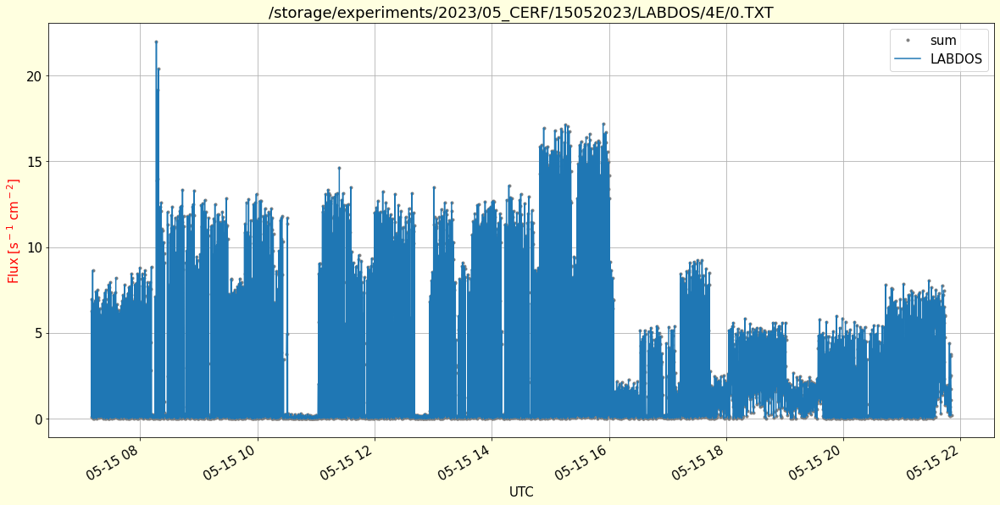

In [470]:

plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

FIRST_CHANNEL = 10

#rc = rc.loc['2023-05-15 00:00':'2023-05-15 23:29']
rc = rc.loc['2023-05-15 00:00':'2023-05-16 23:29'].copy()

rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

rc['sum'].plot(marker='.', linestyle='', color='gray')
rcc = rc.resample('10s').mean()
rcc['sum'].plot(label='LABDOS')

#plt.ylim([0,1.6]) 

plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(f)
plt.legend()
plt.grid()
plt.xlabel('UTC')


# Liulin + LABDOS 

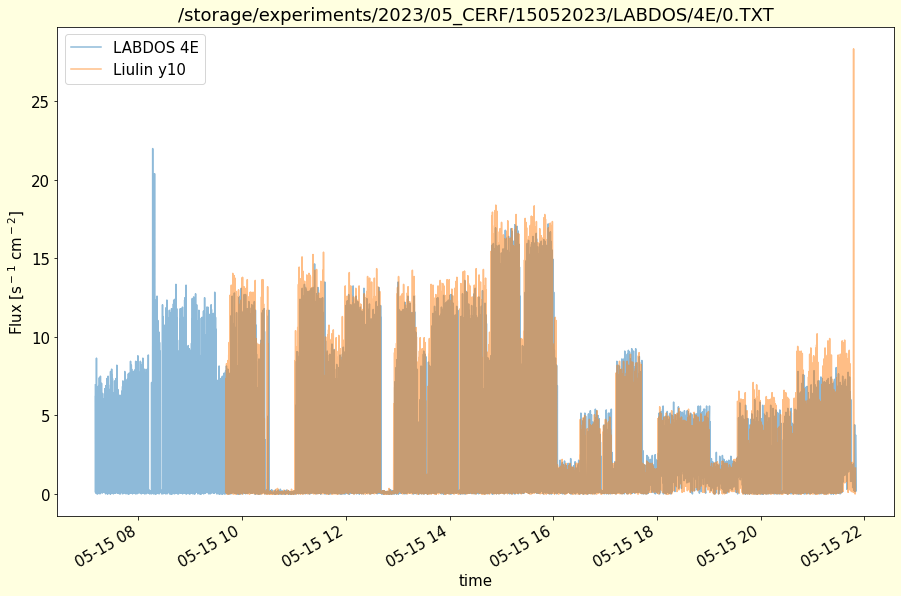

In [471]:
FIRST_CHANNEL = 8

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


(rc['sum']).plot(label='LABDOS '+f.split('/')[-2], alpha=0.5)

#liulin_data2 = liulin_data.resample('10s').mean()

(liulin_data['flux']+0).plot(label='Liulin '+filename.split('.')[-1], alpha=0.5)


plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]')
plt.title(f)

#plt.ylim([0,2])
#plt.xlim('2023-05-15 14:25','2023-04-23 2:30')

plt.legend()





0.045 0.015
0.158 0.061


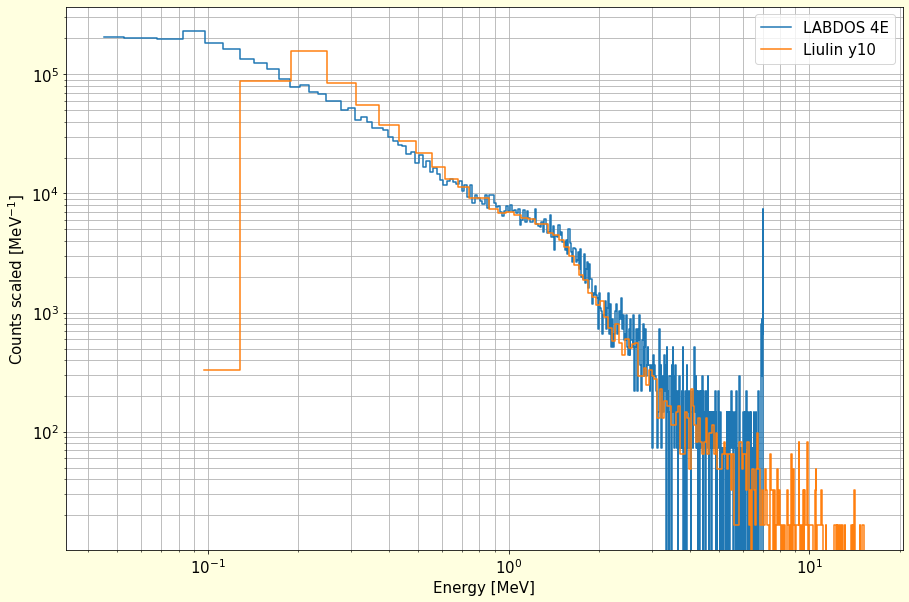

In [488]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

FIRST_CHANNEL = 8

#rcc = rc.loc['2023-05-15 16:00':'2023-05-15 19:00'] # hrby
rcc = rc.loc['2023-05-15 16:32':'2023-05-15 19:00'] # hrby
#rcc = rc.loc['2023-05-15 14:00':'2023-05-15 16:00'] 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.015
coef2[0] = 0.015*3

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i'].astype(float)-FIRST_CHANNEL) * coef2[1] + coef2[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e2['x'], e2['1'] * 1.1/ coef2[1], label='LABDOS '+f.split('/')[-2], drawstyle='steps-mid')


#liulin_data2 = liulin_data.loc['2023-05-15 18:00':'2023-05-15 19:00']
#liulin_data2 = liulin_data.loc['2023-05-15 16:00':'2023-05-15 19:00'] #hrby
liulin_data2 = liulin_data.loc['2023-05-15 16:32':'2023-05-15 19:00'] #hrby
#liulin_data2 = liulin_data.loc['2023-05-15 14:00':'2023-05-15 16:00']

ener = liulin_data2.iloc[:,0:250].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.047 # MDU15
coef3[0] = 0.131
coef3[1] = 0.061 # MDU10
coef3[0] = 0.158

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-1) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin '+filename.split('.')[-1], drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid(which='both')
plt.legend()


None

In [323]:
e3

,1,i,x
0,20,0,0.097
1,5362,1,0.158
2,9654,2,0.219
3,5143,3,0.280
4,3401,4,0.341
...,...,...,...
245,1,245,15.042
246,1,246,15.103
247,1,247,15.164
248,1,248,15.225


0.075 0.015
0.158 0.061


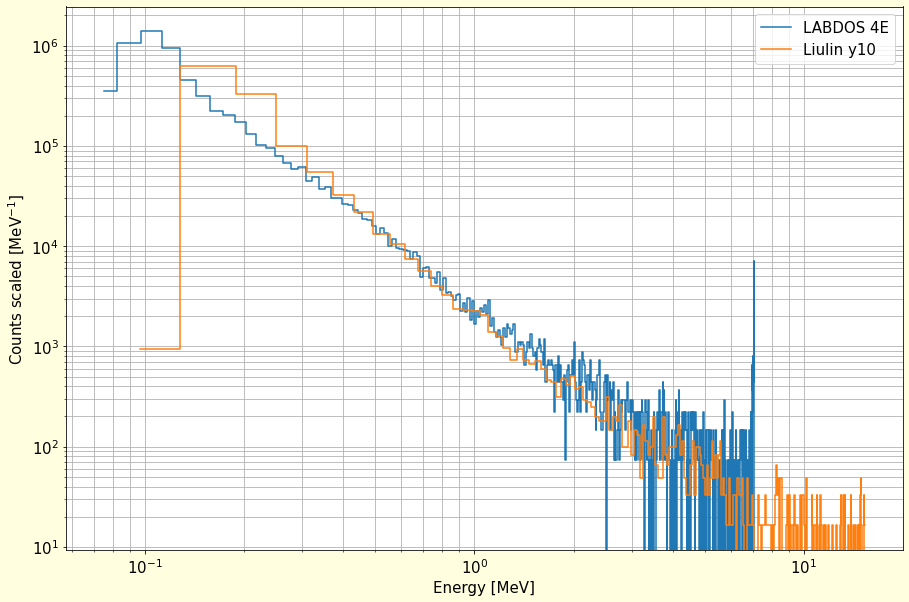

In [485]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

#rcc = rc.loc['2023-05-15 16:00':'2023-05-15 19:00'] # hrby
rcc = rc.loc['2023-05-15 14:00':'2023-05-15 16:00'] 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.015
coef2[0] = 0.015*3 + 0.015*2

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i'].astype(float)-FIRST_CHANNEL) * coef2[1] + coef2[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e2['x'], e2['1'] * 1.1/ coef2[1], label='LABDOS '+f.split('/')[-2], drawstyle='steps-mid')


#liulin_data2 = liulin_data.loc['2023-05-15 18:00':'2023-05-15 19:00']
#liulin_data2 = liulin_data.loc['2023-05-15 16:00':'2023-05-15 19:00'] #hrby
liulin_data2 = liulin_data.loc['2023-05-15 14:00':'2023-05-15 16:00']

ener = liulin_data2.iloc[:,0:250].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.047 # MDU15
coef3[0] = 0.131
coef3[1] = 0.061 # MDU10
coef3[0] = 0.158

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-1) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin '+filename.split('.')[-1], drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid(which='both')
plt.legend()


None

In [486]:
print('LABDOS')
      
deathtime_ratio = 1.1

e2['total'] = e2['1']*e2['x']
depener = e2['total'].sum()*deathtime_ratio
print('Deposited Energy including deathtime', round(depener,2), 'MeV')
dose = (1e6*(1.602e-19 * depener*1e6)/0.101122e-3) 

# size of the chip (20 mm · 10 mm), 
# the thickness of the depletion layer (0.217 mm), 
# and the density of silicon (2.33 g cm^3)
# 0.101122e-3 kg
# size of the chip (20 mm · 10 mm), 
# the thickness of the depletion layer (0.3 mm), 
# and the density of silicon (2.33 g cm^3)
# 0.1398e-3 kg
#dose = ((1e6 * (1.602e-19 * depener * 1e6)/0.1398e-3)/10.4) * 3600 * 2.71 # in uGy/h

print('Dose in silicon', round(dose,2), 'µGy')
print('--------------------------------------------------------------------------')

print('Liulin')

deathtime_ratio = 1.0

e3['total'] = e3['1']*e3['x']
depener = e3['total'].sum()*deathtime_ratio
print('Deposited Energy including deathtime', round(depener,2), 'MeV')
dose = (1e6*(1.602e-19 * depener*1e6)/0.101122e-3) 

print('Dose in silicon', round(dose,2), 'µGy')


LABDOS
Deposited Energy including deathtime 20531.87 MeV
Dose in silicon 32.53 µGy
--------------------------------------------------------------------------
Liulin
Deposited Energy including deathtime 20629.64 MeV
Dose in silicon 32.68 µGy


In [484]:
rcc

,0,1,2,3,4,5,6,7,8,9,...,500,501,502,503,504,runtime,seconds,run,time,sum
time,,,,,,,,,,,,,,,,,,,,,
2023-05-15 14:00:06.400,$HIST,2265,24606.40,21932,3,1210,20705,2231.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-11.12,24606.40,2023-05-15 7:10,2023-05-15 14:00:06.400,0.15
2023-05-15 14:00:17.220,$HIST,2266,24617.22,21818,293,741,20019,3204.0,8.0,40.0,...,0.0,0.0,0.0,0.0,0.0,-10.82,24617.22,2023-05-15 7:10,2023-05-15 14:00:17.220,12.65
2023-05-15 14:00:28.300,$HIST,2267,24628.30,21857,2,751,20117,3356.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,-11.08,24628.30,2023-05-15 7:10,2023-05-15 14:00:28.300,0.00
2023-05-15 14:00:38.870,$HIST,2268,24638.87,21851,82,812,20225,3109.0,4.0,19.0,...,0.0,0.0,0.0,0.0,0.0,-10.57,24638.87,2023-05-15 7:10,2023-05-15 14:00:38.870,3.15
2023-05-15 14:00:49.680,$HIST,2269,24649.68,21856,166,912,20265,2875.0,9.0,34.0,...,0.0,0.0,0.0,0.0,0.0,-10.81,24649.68,2023-05-15 7:10,2023-05-15 14:00:49.680,6.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-15 16:00:08.990,$HIST,2925,31808.99,21930,6,1073,20677,2397.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-10.83,31808.99,2023-05-15 7:10,2023-05-15 16:00:08.990,0.30
2023-05-15 16:00:19.820,$HIST,2926,31819.82,21860,53,1294,20709,2165.0,2.0,11.0,...,0.0,0.0,0.0,0.0,0.0,-10.83,31819.82,2023-05-15 7:10,2023-05-15 16:00:19.820,2.10
2023-05-15 16:00:30.650,$HIST,2927,31830.65,21786,302,1236,20439,2304.0,16.0,45.0,...,0.0,0.0,0.0,0.0,0.0,-10.83,31830.65,2023-05-15 7:10,2023-05-15 16:00:30.650,12.85


0.03 0.015


NameError: name 'liulin_data3' is not defined

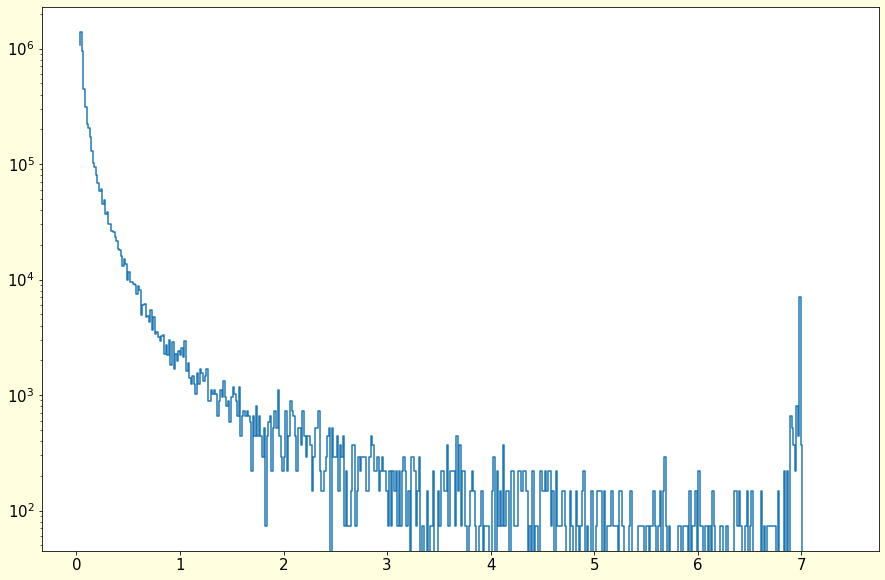

In [27]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

FIRST_CHANNEL = 9

#rcc = rc.loc['2023-05-15 16:00':'2023-05-15 19:00'] # hrby
#rcc = rc.loc['2023-05-15 16:32':'2023-05-15 19:00'] # hrby
rcc = rc.loc['2023-05-15 14:00':'2023-05-15 16:00'] 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.015
coef2[0] = 0.03

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i'].astype(float)-FIRST_CHANNEL) * coef2[1] + coef2[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e2['x'], e2['1'] * 1.1/ coef2[1], label='LABDOS '+f.split('/')[-2], drawstyle='steps-mid')



#liulin_data2 = liulin_data3.loc['2023-05-15 16:32':'2023-05-15 19:00'] #hrby
liulin_data2 = liulin_data3.loc['2023-05-15 14:00':'2023-05-15 16:00']

ener = liulin_data2.iloc[:,0:250].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.061 # MDU15
coef3[0] = 0.158

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-1) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin y15', drawstyle='steps-mid')



#liulin_data2 = liulin_data.loc['2023-05-15 18:00':'2023-05-15 19:00']
#liulin_data2 = liulin_data.loc['2023-05-15 16:00':'2023-05-15 19:00'] #hrby
#liulin_data2 = liulin_data.loc['2023-05-15 16:32':'2023-05-15 19:00'] #hrby
liulin_data2 = liulin_data.loc['2023-05-15 14:00':'2023-05-15 16:00']

ener = liulin_data2.iloc[:,0:250].sum()

coef4 = np.array([0.,0.])
coef4[1] = 0.061 # MDU15
coef4[0] = 0.158
#coef4[1] = 0.047 # MDU10
#coef4[0] = 0.131

print (coef3[0], coef3[1])

e4 = pd.DataFrame()
e4['1'] = ener
e4['i'] = ener.index
e4['x'] = (e4['i'].astype(float)-1) * coef4[1] + coef4[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e4['x'], e4['1'] / coef4[1], label='Liulin y10', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid(which='both')
plt.legend()


None

In [45]:
rcc.iloc[:,8:500]
rcc

,0,1,2,3,4,5,6,7,8,9,...,500,501,502,503,504,runtime,seconds,run,time,sum
time,,,,,,,,,,,,,,,,,,,,,
2023-05-15 14:00:06.400,$HIST,2265,24606.40,21932,3,1210,20705,2231.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-11.12,24606.40,2023-05-15 7:10,2023-05-15 14:00:06.400,0.15
2023-05-15 14:00:17.220,$HIST,2266,24617.22,21818,293,741,20019,3204.0,8.0,40.0,...,0.0,0.0,0.0,0.0,0.0,-10.82,24617.22,2023-05-15 7:10,2023-05-15 14:00:17.220,12.65
2023-05-15 14:00:28.300,$HIST,2267,24628.30,21857,2,751,20117,3356.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,-11.08,24628.30,2023-05-15 7:10,2023-05-15 14:00:28.300,0.00
2023-05-15 14:00:38.870,$HIST,2268,24638.87,21851,82,812,20225,3109.0,4.0,19.0,...,0.0,0.0,0.0,0.0,0.0,-10.57,24638.87,2023-05-15 7:10,2023-05-15 14:00:38.870,3.15
2023-05-15 14:00:49.680,$HIST,2269,24649.68,21856,166,912,20265,2875.0,9.0,34.0,...,0.0,0.0,0.0,0.0,0.0,-10.81,24649.68,2023-05-15 7:10,2023-05-15 14:00:49.680,6.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-15 16:00:08.990,$HIST,2925,31808.99,21930,6,1073,20677,2397.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-10.83,31808.99,2023-05-15 7:10,2023-05-15 16:00:08.990,0.30
2023-05-15 16:00:19.820,$HIST,2926,31819.82,21860,53,1294,20709,2165.0,2.0,11.0,...,0.0,0.0,0.0,0.0,0.0,-10.83,31819.82,2023-05-15 7:10,2023-05-15 16:00:19.820,2.10
2023-05-15 16:00:30.650,$HIST,2927,31830.65,21786,302,1236,20439,2304.0,16.0,45.0,...,0.0,0.0,0.0,0.0,0.0,-10.83,31830.65,2023-05-15 7:10,2023-05-15 16:00:30.650,12.85


## Generator

In [15]:
f = '/storage/experiments/2023/08_labdos_charge_injection/4e/0.TXT'


SWITCH_ON_TIMES = ['2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-12 0:0','2023-05-13 0:0','2023-05-14 10:20','2023-05-15 7:10']
SWITCH_ON_TIMES = ['2023-05-12 0:0','2023-05-13 0:0','2023-05-14 10:20','2023-05-15 7:10']

l=[]
l.extend(range(0,505))
df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df.copy()

run = 0
rc['run'] = np.nan

try:
    for x in rc.loc[rc[0]=='$DOS'].index:
        rc.loc[x,'run'] = SWITCH_ON_TIMES[run]
        run += 1
except:
    pass
rc['run'].fillna(method="ffill", inplace=True)

pd.set_option('display.max_rows', rc.shape[0]+1)
print(rc.loc[rc[0]=='$DOS'][[0,1,2,3,4,5,6, 'run', 'runtime']])
#print(rc.loc[rc[0]=='$AIRDOS'][[0,1, 'runtime']])
pd.set_option('display.max_rows', 10)

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)

#!!!!!!!!!!!!!!!
#rc = rc.iloc[1:4745]


      0          1   2    3                                         4  \
0  $DOS  LABDOS01A NaN  516  71cdf196883fa3ab648ae47327ef2137eb69420f   

         5                                 6             run  runtime  
0  CIBuild  1290c00806a20090344aa000a000004e  2023-05-12 0:0      NaN  


Text(0.5, 0, 'UTC')

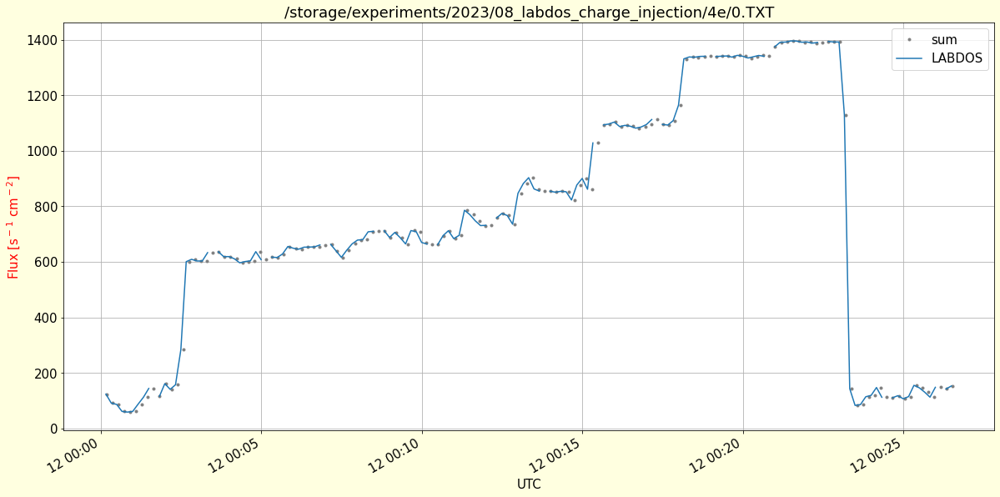

In [17]:

plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

FIRST_CHANNEL = 8

rc['sum'] = rc[range(FIRST_CHANNEL,500)].sum(axis=1)/10/2

rc['sum'].plot(marker='.', linestyle='', color='gray')
rcc = rc.resample('10s').mean()
rcc['sum'].plot(label='LABDOS')

#plt.ylim([0,1.6]) 

plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.title(f)
plt.legend()
plt.grid()
plt.xlabel('UTC')


0.0 0.015


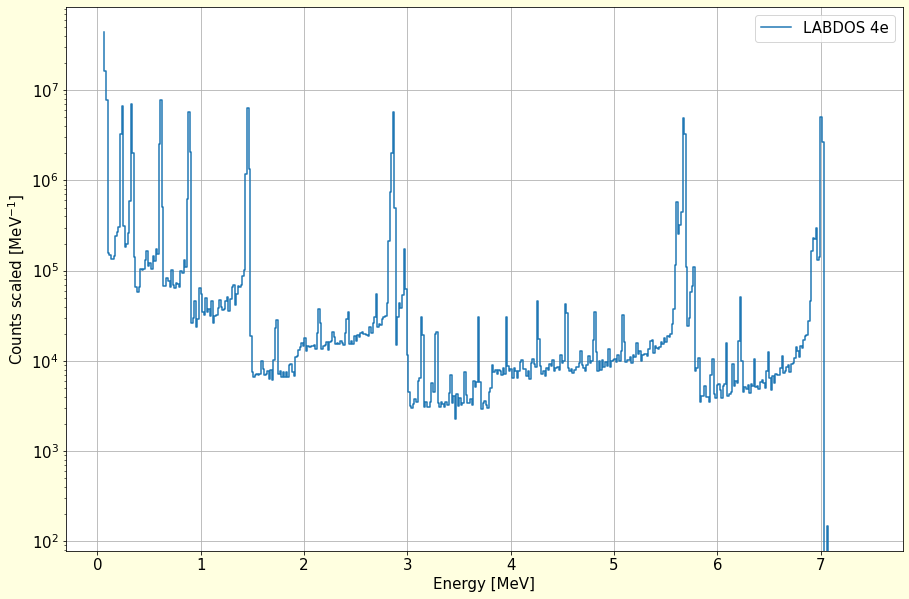

In [20]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

#rcc = rc.loc['2023-05-15 16:00':'2023-05-15 19:00'] # hrby
rcc = rc 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.015
coef2[0] = 0

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i'].astype(float)-FIRST_CHANNEL+4) * coef2[1] + coef2[0]

plt.yscale('log')
#plt.xscale('log')

plt.plot(e2['x'], e2['1'] * 1.1/ coef2[1], label='LABDOS '+f.split('/')[-2], drawstyle='steps-mid')


plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid()
plt.legend()


None

/storage/experiments/2023/08_labdos_charge_injection/d9/0.TXT
0.0 0.015


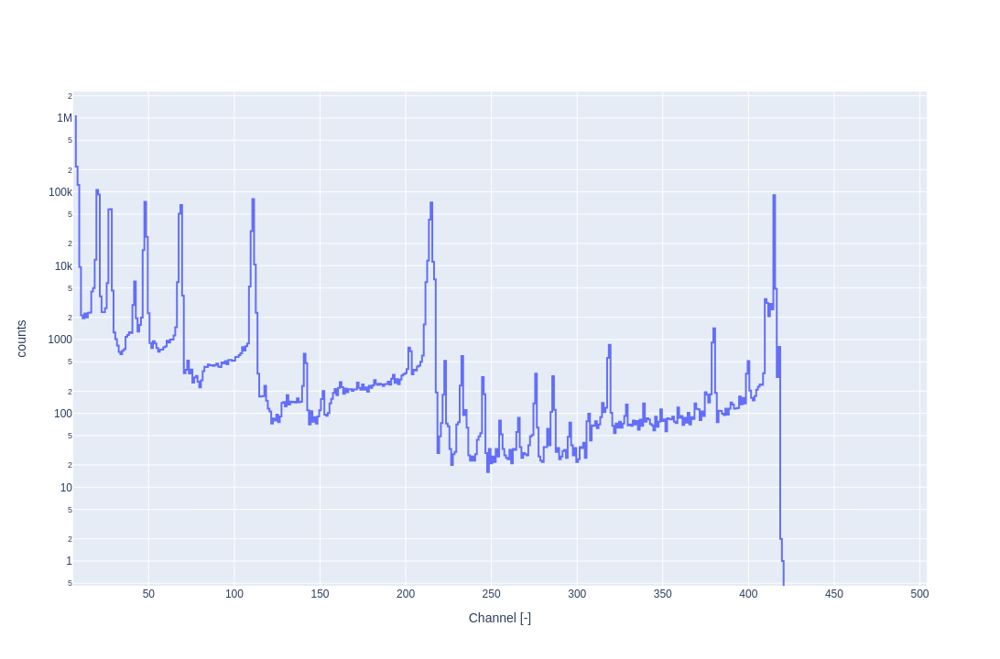

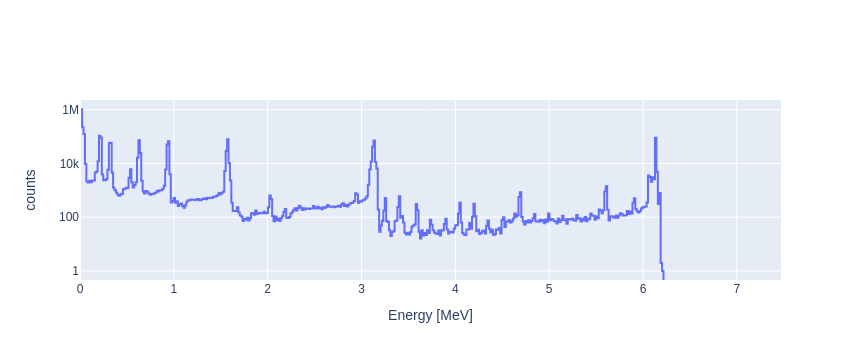

In [29]:
f = '/storage/experiments/2023/08_labdos_charge_injection/4e/1.TXT'
f = '/storage/experiments/2023/08_labdos_charge_injection/d9/0.TXT'
SWITCH_ON_TIMES = ['2023-04-24 0:0','2023-04-24 00:30','2023-04-25 0:0']

l=[]
l.extend(range(0,506))

df = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
df = df.reset_index(drop=True)
print(f)

df[2] = df[2].apply(pd.to_numeric, errors='coerce')

df['runtime'] = np.nan
df.loc[df[0]=='$HIST','seconds'] = df.loc[df[0]=='$HIST',2]
df.loc[df[0]=='$DOS','seconds'] = 0
df['runtime'] = df['seconds'].diff() * -1
rc = df

rc['run'] = SWITCH_ON_TIMES[0]

rc[2] = pd.to_numeric(rc[2])
rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
rc.set_index(rc['time'], drop=False, inplace=True)
#rc = rc.loc['2023-04-24 00:05:00':'2023-04-24 00:35:00']

FIRST_CHANNEL = 6

ener = rc.iloc[:,FIRST_CHANNEL:505].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.015
coef3[0] = 0.0

#0.034 MeV + ch * 0.016 MeV

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)-FIRST_CHANNEL) * coef3[1] + coef3[0]

    
data = [
    go.Scatter(
        x=e3['i'],
        y=e3['1'],
        name='HIMAC',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Channel [-]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()

data = [
    go.Scatter(
        x=e3['x'],
        y=e3['1'],
        name='HIMAC',
        yaxis='y',
        line=dict(
        shape='hvh'
        )
    )    
    ]

layout = go.Layout(
    #title='LABDOS',
    yaxis=dict(
        title='counts',
        type='log',
        #range = [0,40000]
    ),
    xaxis=dict(
        title='Energy [MeV]',
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()




# Timepix

In [2]:
tf = '/storage/stations/LS/Malina/tpx_ls_data.csv'
l=[]
l.extend(range(0,505))

#timepix = pd.read_csv(tf, sep=',', header=None, names=l, comment='*', low_memory=False)
timepix = pd.read_csv(tf, sep=',', header=0, comment='*', low_memory=False)
timepix['time'] = pd.to_datetime(timepix['unix'], unit='s')
timepix.set_index('time', inplace=True)
timepix = timepix.sort_index()

In [61]:
timepix.iat[0,2] = 7000
#timepix['jedna'] = 1
timepix
#timepix.sort_values(by=['volume'])

,Unnamed: 0,unix,shutter,volume,height,size
time,,,,,,
2023-03-21 07:07:40.268282880,2538928,1.679382e+09,7000.0,280.01117,44.66427,11
2023-03-21 07:07:40.268282880,2538929,1.679382e+09,5.0,10.46647,10.46647,1
2023-03-21 07:07:40.268282880,2538930,1.679382e+09,5.0,26.46885,26.46885,1
2023-03-21 07:07:45.462220032,2538933,1.679382e+09,5.0,179.04023,69.00113,5
2023-03-21 07:07:45.462220032,2538931,1.679382e+09,5.0,29.44860,29.44860,1
...,...,...,...,...,...,...
2024-02-23 10:10:06.413063168,3942820,1.708683e+09,5.0,377.94246,43.88829,22
2024-02-23 10:10:11.645085952,3942821,1.708683e+09,5.0,440.86087,113.08155,13
2024-02-23 10:10:22.146856960,3942822,1.708683e+09,5.0,106.40491,37.55200,5


In [3]:
plt.figure(figsize=(15,5), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

timepix = timepix.resample('10s').sum()
plt.plot(pd.concat([timepix['jedna'].loc['2023-06-01':'2023-06-13'],timepix['jedna'].loc['2023-06-15':'2023-06-19'],timepix['jedna'].loc['2023-06-21':'2023-07-07']]))


NameError: name 'timepix' is not defined

<Figure size 1080x360 with 0 Axes>

In [4]:
timepix['volume'].loc[timepix['volume']<800].hist(bins=200)

NameError: name 'timepix' is not defined

In [3]:
timepix = timepix.loc[timepix['volume']<=7000]
timepix.iat[0,2] = 7000



In [4]:
binsnum = int(7000/15)
#tphistogram = np.histogram(timepix['volume'].loc['2023-06-01':'2023-07-07'],bins=binsnum)
tphistogram = np.histogram(pd.concat([timepix['volume'].loc['2023-06-01':'2023-06-13'],timepix['volume'].loc['2023-06-15':'2023-06-19'],timepix['volume'].loc['2023-06-21':'2023-06-26'],timepix['volume'].loc['2023-06-28':'2023-07-07']]),bins=25000)
tphistogram[1][1]-tphistogram[1][0]

0.27975715400000034

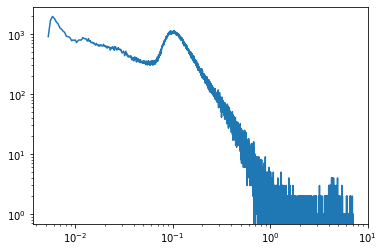

In [5]:
plt.plot(tphistogram[1][1:]/1000,tphistogram[0])
plt.yscale('log')
plt.xscale('log')


In [25]:
tphistogram

(array([59462,     0,     0, ...,     0,     0,     1]),
 array([0.00000000e+00, 2.79957877e-01, 5.59915754e-01, ...,
        6.99838701e+03, 6.99866697e+03, 6.99894693e+03]))

In [6]:
tf = '/storage/stations/LS/Malina'

df = pd.DataFrame()

for f in glob.iglob(tf+"/run_11*/**/*USB2.log"):
    print(f)
    l=[]
    l.extend(range(0,506))
    rdf = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = pd.concat([df, rdf])

for f in glob.iglob(tf+"/run_10*/**/*USB2.log"):
    print(f)
    l=[]
    l.extend(range(0,506))
    rdf = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = pd.concat([df, rdf])

for f in glob.iglob(tf+"/run_9*/**/*USB2.log"):
    print(f)
    l=[]
    l.extend(range(0,506))
    rdf = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = pd.concat([df, rdf])

for f in glob.iglob(tf+"/run_8*/**/*USB2.log"):
    print(f)
    l=[]
    l.extend(range(0,506))
    rdf = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = pd.concat([df, rdf])

for f in glob.iglob(tf+"/run_7*/**/*USB2.log"):
    print(f)
    l=[]
    l.extend(range(0,506))
    rdf = pd.read_csv(f, sep=',', header=None, names=l, comment='*', low_memory=False)
    df = pd.concat([df, rdf])

    
print('data reduction')
df = df.loc[df[1]=='$HIST']
print('converting time')
df['time'] = pd.to_datetime(df[0], unit='s')
labdos = df.set_index('time').copy()
labdos = labdos.sort_index()
print('end')

/storage/stations/LS/Malina/run_118/Labdos/labdos_1689285618_ttyUSB2.log
/storage/stations/LS/Malina/run_112/Labdos/labdos_1688853617_ttyUSB2.log
/storage/stations/LS/Malina/run_115/Labdos/labdos_1689056236_ttyUSB2.log
/storage/stations/LS/Malina/run_111/Labdos/labdos_1688767218_ttyUSB2.log
/storage/stations/LS/Malina/run_116/Labdos/labdos_1689112817_ttyUSB2.log
/storage/stations/LS/Malina/run_114/Labdos/labdos_1689026419_ttyUSB2.log
/storage/stations/LS/Malina/run_113/Labdos/labdos_1688940018_ttyUSB2.log
/storage/stations/LS/Malina/run_119/Labdos/labdos_1689372018_ttyUSB2.log
/storage/stations/LS/Malina/run_117/Labdos/labdos_1689199219_ttyUSB2.log
/storage/stations/LS/Malina/run_110/Labdos/labdos_1688680818_ttyUSB2.log
/storage/stations/LS/Malina/run_101/Labdos/labdos_1687903218_ttyUSB2.log
/storage/stations/LS/Malina/run_106/Labdos/labdos_1688335218_ttyUSB2.log
/storage/stations/LS/Malina/run_108/Labdos/labdos_1688508019_ttyUSB2.log
/storage/stations/LS/Malina/run_102/Labdos/labdos_1

In [59]:
labdos

,0,1,2,3,4,5,6,7,8,9,...,496,497,498,499,500,501,502,503,504,505
time,,,,,,,,,,,,,,,,,,,,,
2023-05-28 16:43:38.443489536,1.685292e+09,$HIST,0,10.94,20688.0,0,76,14213,11093.0,13.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:01.161919232,1.685292e+09,$HIST,1,21.78,20859.0,2,118,15010,10090.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:11.972123136,1.685292e+09,$HIST,2,32.60,20829.0,3,101,14914,10231.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:22.819764992,1.685292e+09,$HIST,3,43.41,20743.0,1,75,14506,10748.0,10.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:33.618832640,1.685292e+09,$HIST,4,54.22,20767.0,0,78,14473,10758.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-15 22:00:50.192203008,1.689458e+09,$HIST,7978,86414.40,20422.0,1,9,9113,16467.0,71.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-07-15 22:01:01.025984000,1.689458e+09,$HIST,7979,86425.23,20432.0,2,5,8807,16762.0,75.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-07-15 22:01:11.874157312,1.689458e+09,$HIST,7980,86436.7,20449.0,2,6,9135,16414.0,77.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


0.025 0.0143


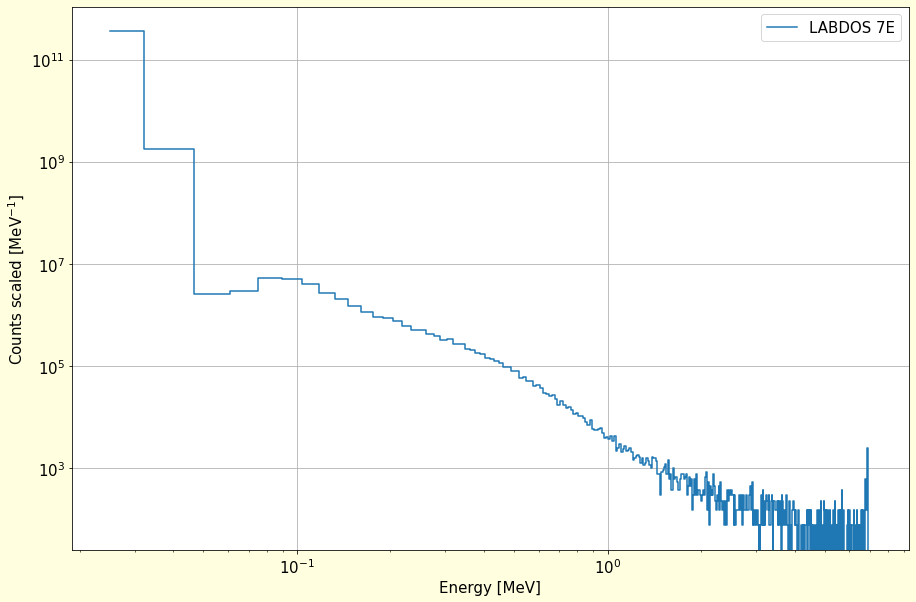

In [7]:
FIRST_CHANNEL = 8

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

labdos1 = labdos.loc[labdos[8]<9000].shift(-1, axis=1)
labdos2 = labdos.loc[labdos[8]>=9000]
labdos3 = pd.concat([labdos1, labdos2])
#labdos3 = labdos1
labdos3 = labdos3.sort_index()
#rcc = labdos3.loc['2023-06-01':'2023-07-07'].copy() 
rcc = pd.concat([labdos3.loc['2023-06-01':'2023-06-13'],labdos3.loc['2023-06-15':'2023-06-19'],labdos3.loc['2023-06-21':'2023-07-07']]).copy() 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.0143
coef2[0] = 0.025

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i'].astype(float)-FIRST_CHANNEL) * coef2[1] + coef2[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e2['x'], e2['1'] * 1.1/ coef2[1], label='LABDOS 7E', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
plt.grid()
plt.legend()


None

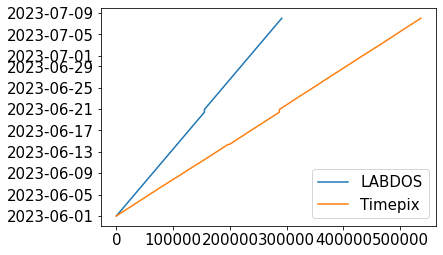

In [95]:
plt.plot(rcc.index, label='LABDOS')
plt.plot(timepix['2023-06-01':'2023-07-07'].index, label='Timepix')
plt.legend(loc=4)

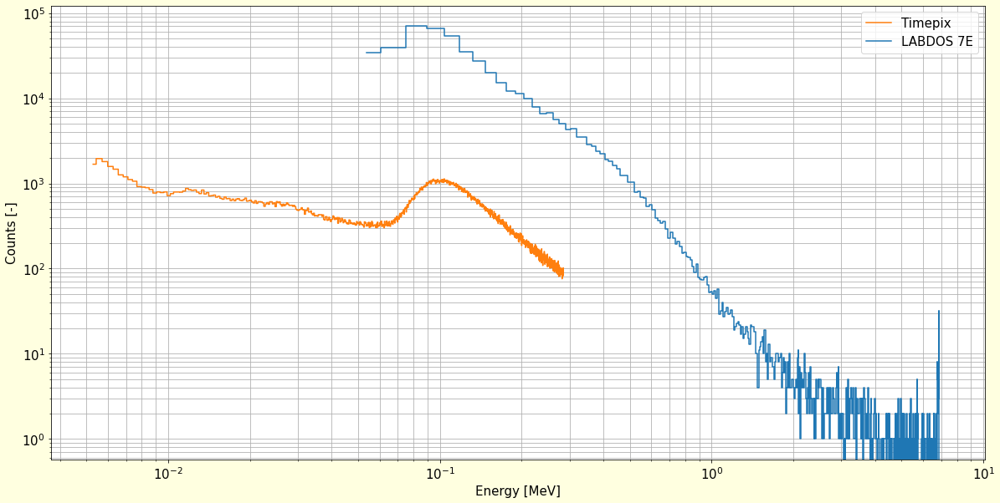

In [8]:
plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.yscale('log')
plt.xscale('log')

plt.plot(tphistogram[1][1:1000]/1000,tphistogram[0][1:1000] * 1, label='Timepix', drawstyle='steps-mid', c='tab:orange')
#plt.plot(tphistogram[1][1:25000]/1000,tphistogram[0][1:25000], label='Timepix', drawstyle='steps-mid')
plt.plot(e2.loc[10:,'x'], e2.loc[10:,'1'], label='LABDOS 7E', drawstyle='steps-mid', c='tab:blue')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts [-]')
plt.grid(which='both')
plt.legend()


None

In [44]:
spectrum1 = pd.DataFrame()
spectrum2 = pd.DataFrame()

spectrum1['energy'] = tphistogram[1][3:85]/1000
spectrum1['counts'] = tphistogram[0][3:85]
spectrum2['energy'] = e2.loc[10:90,'x']
spectrum2['counts'] = e2.loc[10:90,'1']
#spectrum1.to_csv('spectrum1.csv')
#spectrum2.to_csv('spectrum2.csv')


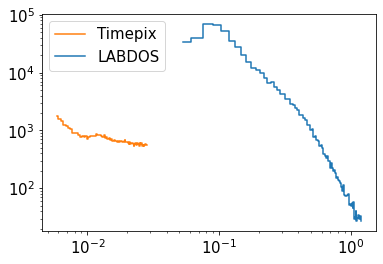

In [45]:
plt.plot(spectrum1['energy'], spectrum1['counts'], label='Timepix', drawstyle='steps-mid', c='tab:orange')
plt.plot(spectrum2['energy'], spectrum2['counts'], label='LABDOS', drawstyle='steps-mid', c='tab:blue')
plt.yscale('log')
plt.xscale('log')
plt.legend()

(array([19509., 19513., 19517., 19521., 19525., 19529., 19533., 19537.,
        19539., 19543., 19547.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

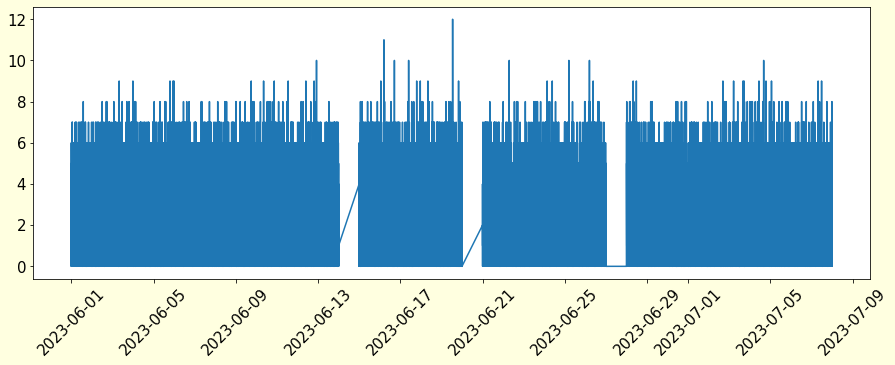

In [9]:
plt.figure(figsize=(15,5), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

labdos3['sum'] = labdos3[range(10,500)].sum(axis=1)
rcc = pd.concat([labdos3.loc['2023-06-01':'2023-06-13'],labdos3.loc['2023-06-15':'2023-06-19'],labdos3.loc['2023-06-21':'2023-06-26'],labdos3.loc['2023-06-28':'2023-07-07']]).copy() 
#rcc = labdos3

plt.plot(rcc['sum'])

plt.xticks(rotation=45)


0.0143 0.0143


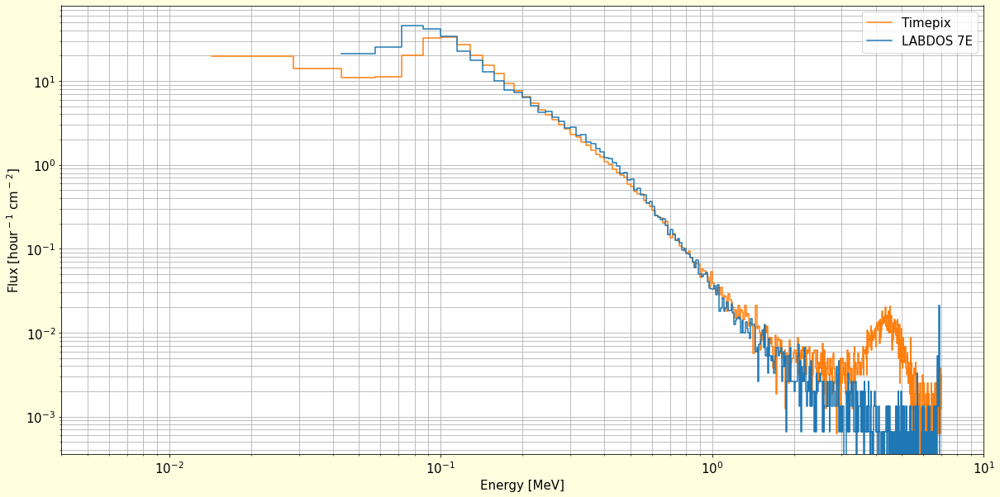

In [10]:
FIRST_CHANNEL = 8
#FROM = '2023-06-1'
#TO = '2023-07-7'
#FROM = '2023-06-25'
#TO = pd.to_datetime(FROM) + pd.DateOffset(5)

binsnum = 488 # int((7000-14.3)/14.3)

timepix = timepix.loc[timepix['volume']<=7000]
timepix = timepix.loc[timepix['volume']>14.3]
timepix.iat[0,2] = 7000

#tpx = timepix.loc[FROM:TO]
tpx = pd.concat([timepix.loc['2023-06-01':'2023-06-13'],timepix.loc['2023-06-15':'2023-06-19'],timepix.loc['2023-06-21':'2023-06-26'],timepix.loc['2023-06-28':'2023-07-07']]).copy() 

#tphistogram = np.histogram(tpx['volume'],bins=6750)
tphistogram = np.histogram(tpx['volume'],bins=binsnum)


labdos1 = labdos.loc[labdos[8]<9000].shift(-1, axis=1)
labdos2 = labdos.loc[labdos[8]>=9000]
labdos3 = pd.concat([labdos1, labdos2])
#labdos3 = labdos
labdos3 = labdos3.sort_index()
#rcc = labdos3.loc[FROM:TO] 
rcc = pd.concat([labdos3.loc['2023-06-01':'2023-06-13'],labdos3.loc['2023-06-15':'2023-06-19'],labdos3.loc['2023-06-21':'2023-06-26'],labdos3.loc['2023-06-28':'2023-07-07']]).copy() 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.0143
coef2[0] = 0.0143

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i']-FIRST_CHANNEL) * coef2[1] + coef2[0]


plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.yscale('log')
plt.xscale('log')

tphist = pd.DataFrame()
tphist['energy'] = tphistogram[1][:-1]/1000
tphist['count'] = tphistogram[0][:] * 1.04 / (1.408*1.408) / ((31+7-3)*24)

plt.plot(tphist['energy'],tphist['count'], label='Timepix', drawstyle='steps-post', c='tab:orange')

labdos4 = pd.DataFrame()
labdos4['energy'] = e2.loc[10:,'x']
labdos4['count'] = e2.loc[10:,'1'] / 10 / 2 / len(rcc) * 60 * 60

plt.plot(labdos4['energy'], labdos4['count'], label='LABDOS 7E', drawstyle='steps-post', c='tab:blue')

plt.xlabel('Energy [MeV]')
plt.ylabel('Flux [hour$^-$$^1$ cm$^-$$^2$]')
plt.grid(which='both')
plt.legend()

plt.xlim(0.004,10)


tphist.to_csv('spectrum_tpx.csv')
labdos4.to_csv('spectrum_labdos.csv')

None

0.0143 0.0143


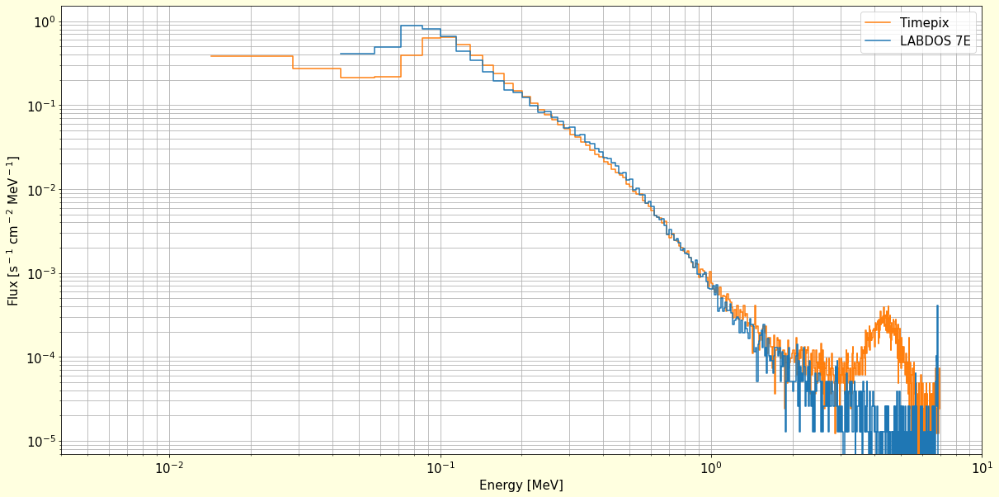

In [11]:
FIRST_CHANNEL = 8
#FROM = '2023-06-1'
#TO = '2023-07-7'
#FROM = '2023-06-25'
#TO = pd.to_datetime(FROM) + pd.DateOffset(5)

binsnum = 488 # int((7000-14.3)/14.3)

timepix = timepix.loc[timepix['volume']<=7000]
timepix = timepix.loc[timepix['volume']>14.3]
timepix.iat[0,2] = 7000

#tpx = timepix.loc[FROM:TO]
tpx = pd.concat([timepix.loc['2023-06-01':'2023-06-13'],timepix.loc['2023-06-15':'2023-06-19'],timepix.loc['2023-06-21':'2023-06-26'],timepix.loc['2023-06-28':'2023-07-07']]).copy() 

#tphistogram = np.histogram(tpx['volume'],bins=6750)
tphistogram = np.histogram(tpx['volume'],bins=binsnum)


labdos1 = labdos.loc[labdos[8]<9000].shift(-1, axis=1)
labdos2 = labdos.loc[labdos[8]>=9000]
labdos3 = pd.concat([labdos1, labdos2])
#labdos3 = labdos
labdos3 = labdos3.sort_index()
#rcc = labdos3.loc[FROM:TO] 
rcc = pd.concat([labdos3.loc['2023-06-01':'2023-06-13'],labdos3.loc['2023-06-15':'2023-06-19'],labdos3.loc['2023-06-21':'2023-06-26'],labdos3.loc['2023-06-28':'2023-07-07']]).copy() 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.0143
coef2[0] = 0.0143

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i']-FIRST_CHANNEL) * coef2[1] + coef2[0]


plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.yscale('log')
plt.xscale('log')

tphist = pd.DataFrame()
tphist['energy'] = tphistogram[1][:-1]/1000
tphist['count'] = tphistogram[0][:] * 1.04 / (1.408*1.408) / ((31+7-3)*24*60*60) / coef2[1]

plt.plot(tphist['energy'],tphist['count'], label='Timepix', drawstyle='steps-post', c='tab:orange')

labdos4 = pd.DataFrame()
labdos4['energy'] = e2.loc[10:,'x']
labdos4['count'] = e2.loc[10:,'1'] / 10 / 2 / len(rcc) / coef2[1]

plt.plot(labdos4['energy'], labdos4['count'], label='LABDOS 7E', drawstyle='steps-post', c='tab:blue')

plt.xlabel('Energy [MeV]')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$ MeV$^-$$^1$]')
plt.grid(which='both')
plt.legend()

plt.xlim(0.004,10)


tphist.to_csv('spectrum_tpx.csv')
labdos4.to_csv('spectrum_labdos.csv')

None

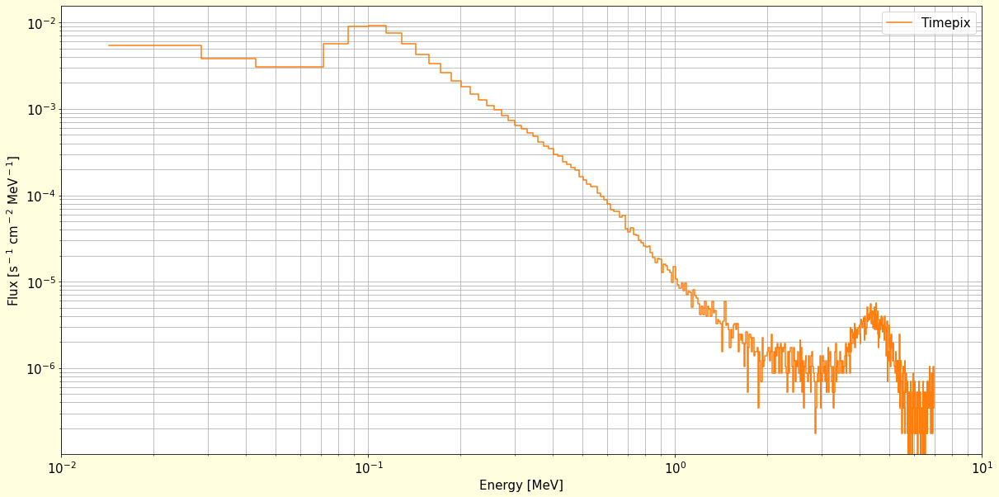

In [12]:
FIRST_CHANNEL = 8
#FROM = '2023-06-1'
#TO = '2023-07-7'
#FROM = '2023-06-25'
#TO = pd.to_datetime(FROM) + pd.DateOffset(5)

binsnum = 488 # int((7000-14.3)/14.3)

timepix = timepix.loc[timepix['volume']<=7000]
timepix = timepix.loc[timepix['volume']>14.3]
timepix.iat[0,2] = 7000

#tpx = timepix.loc[FROM:TO]
tpx = pd.concat([timepix.loc['2023-06-01':'2023-06-13'],timepix.loc['2023-06-15':'2023-06-19'],timepix.loc['2023-06-21':'2023-06-26'],timepix.loc['2023-06-28':'2023-07-07']]).copy() 

#tphistogram = np.histogram(tpx['volume'],bins=6750)
tphistogram = np.histogram(tpx['volume'],bins=binsnum)


plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.yscale('log')
plt.xscale('log')

tphist = pd.DataFrame()
tphist['energy'] = tphistogram[1][:-1]/1000
tphist['count'] = tphistogram[0][:] * 1.04 / (1.408*1.408) / ((31+7-3)*24*60*60) 

plt.plot(tphist['energy'],tphist['count'], label='Timepix', drawstyle='steps-post', c='tab:orange')


plt.xlabel('Energy [MeV]')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$ MeV$^-$$^1$]')
plt.grid(which='both')
plt.legend()

plt.xlim(0.01,10)


None

In [15]:
fn = '/storage/experiments/2024/02_AIRDOS_PHITS/LABDOS_vs_minipix_LS.csv'

l=[]
l.extend(range(0,4))

#timepix = pd.read_csv(tf, sep=',', header=None, names=l, comment='*', low_memory=False)
model = pd.read_csv(fn, sep=',', header=0, comment='*', low_memory=False)


0.0143 0.0143


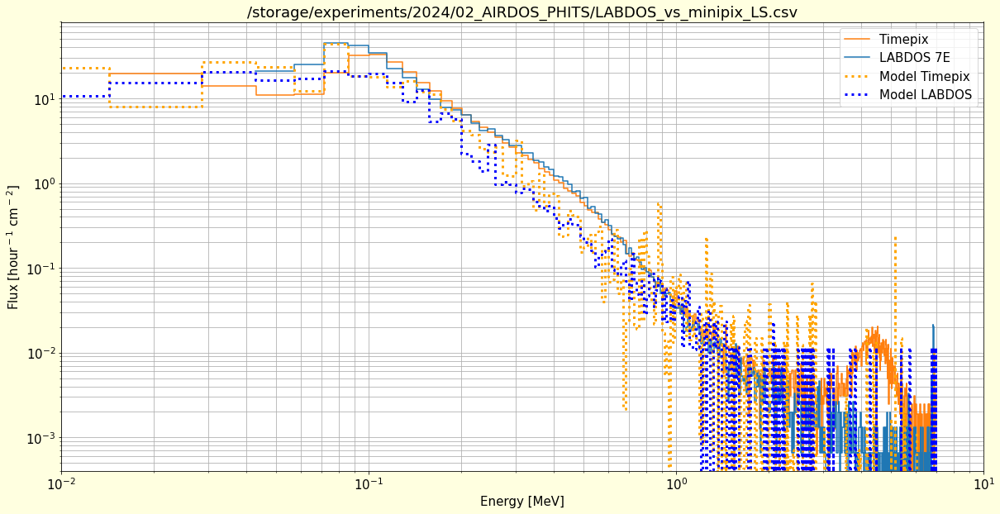

In [18]:
FIRST_CHANNEL = 8
#FROM = '2023-06-1'
#TO = '2023-07-7'
#FROM = '2023-06-25'
#TO = pd.to_datetime(FROM) + pd.DateOffset(5)

binsnum = 488 # int((7000-14.3)/14.3)

timepix = timepix.loc[timepix['volume']<=7000]
timepix = timepix.loc[timepix['volume']>14.3]
timepix.iat[0,2] = 7000

#tpx = timepix.loc[FROM:TO]
tpx = pd.concat([timepix.loc['2023-06-01':'2023-06-13'],timepix.loc['2023-06-15':'2023-06-19'],timepix.loc['2023-06-21':'2023-06-26'],timepix.loc['2023-06-28':'2023-07-07']]).copy() 

#tphistogram = np.histogram(tpx['volume'],bins=6750)
tphistogram = np.histogram(tpx['volume'],bins=binsnum)


labdos1 = labdos.loc[labdos[8]<9000].shift(-1, axis=1)
labdos2 = labdos.loc[labdos[8]>=9000]
labdos3 = pd.concat([labdos1, labdos2])
#labdos3 = labdos
labdos3 = labdos3.sort_index()
#rcc = labdos3.loc[FROM:TO] 
rcc = pd.concat([labdos3.loc['2023-06-01':'2023-06-13'],labdos3.loc['2023-06-15':'2023-06-19'],labdos3.loc['2023-06-21':'2023-06-26'],labdos3.loc['2023-06-28':'2023-07-07']]).copy() 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.0143
coef2[0] = 0.0143

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i']-FIRST_CHANNEL) * coef2[1] + coef2[0]


plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.yscale('log')
plt.xscale('log')

tphist = pd.DataFrame()
tphist['energy'] = tphistogram[1][:-1]/1000
tphist['count'] = tphistogram[0][:] * 1.04 / (1.408*1.408) / ((31+7-3)*24)

plt.plot(tphist['energy'],tphist['count'], label='Timepix', drawstyle='steps-post', c='tab:orange')

labdos4 = pd.DataFrame()
labdos4['energy'] = e2.loc[10:,'x']
labdos4['count'] = e2.loc[10:,'1'] / 10 / 2 / len(rcc) * 60 * 60 

plt.plot(labdos4['energy'], labdos4['count'], label='LABDOS 7E', drawstyle='steps-post', c='tab:blue')

#model['E'] = model.index * coef2[1] + coef2[0]

#plt.plot(model['E'], model['minipix'], marker='o', lw=0, label='Model Timepix', drawstyle='steps-pre', c='orange')
#plt.plot(model['E'], model['labdos'], marker='o', lw=0, label='Model LABDOS', drawstyle='steps-pre', c='blue')
plt.plot(model['E'], model['minipix'], lw=3, label='Model Timepix', linestyle='dotted' , drawstyle='steps-mid', c='orange')
plt.plot(model['E'], model['labdos'], lw=3, label='Model LABDOS', linestyle='dotted' , drawstyle='steps-mid', c='blue')

plt.xlabel('Energy [MeV]')
plt.ylabel('Flux [hour$^-$$^1$ cm$^-$$^2$]')
plt.grid(which='both')
plt.legend()

plt.xlim(0.01,10)
plt.ylim(0.0004,80)
plt.title(fn)


#tphist.to_csv('spectrum_tpx.csv')
#labdos4.to_csv('spectrum_labdos.csv')

None

In [157]:
model

,Unnamed: 0,E,labdos,minipix
0,0,0.0143,3.206160,2.136795
1,1,0.0286,4.988700,3.257946
2,2,0.0429,7.731720,4.262151
3,3,0.0572,10.440180,5.826749
4,4,0.0715,12.396420,8.267348
...,...,...,...,...
485,485,6.9498,0.000000,0.000000
486,486,6.9641,0.000000,0.000000
487,487,6.9784,0.011575,0.000000
488,488,6.9927,0.000000,0.000000


In [133]:
fn = '/storage/experiments/2024/02_AIRDOS_PHITS/AIRDOS_vs_minipix_LS.csv'

l=[]
l.extend(range(0,4))

#timepix = pd.read_csv(tf, sep=',', header=None, names=l, comment='*', low_memory=False)
model = pd.read_csv(fn, sep=',', header=0, comment='*', low_memory=False)


0.0143 0.0143


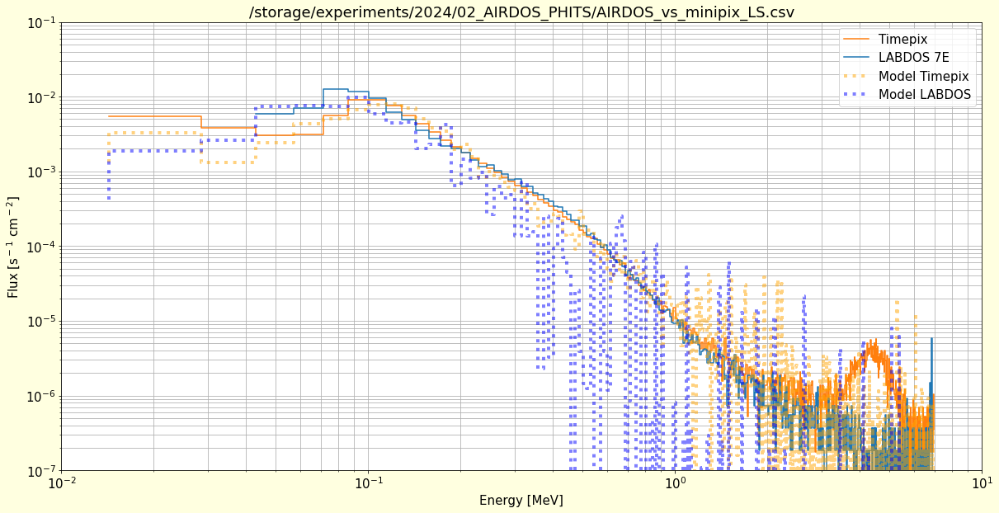

In [153]:
FIRST_CHANNEL = 8
#FROM = '2023-06-1'
#TO = '2023-07-7'
#FROM = '2023-06-25'
#TO = pd.to_datetime(FROM) + pd.DateOffset(5)

binsnum = 488 # int((7000-14.3)/14.3)

timepix = timepix.loc[timepix['volume']<=7000]
timepix = timepix.loc[timepix['volume']>14.3]
timepix.iat[0,2] = 7000

#tpx = timepix.loc[FROM:TO]
tpx = pd.concat([timepix.loc['2023-06-01':'2023-06-13'],timepix.loc['2023-06-15':'2023-06-19'],timepix.loc['2023-06-21':'2023-06-26'],timepix.loc['2023-06-28':'2023-07-07']]).copy() 

#tphistogram = np.histogram(tpx['volume'],bins=6750)
tphistogram = np.histogram(tpx['volume'],bins=binsnum)


labdos1 = labdos.loc[labdos[8]<9000].shift(-1, axis=1)
labdos2 = labdos.loc[labdos[8]>=9000]
labdos3 = pd.concat([labdos1, labdos2])
#labdos3 = labdos
labdos3 = labdos3.sort_index()
#rcc = labdos3.loc[FROM:TO] 
rcc = pd.concat([labdos3.loc['2023-06-01':'2023-06-13'],labdos3.loc['2023-06-15':'2023-06-19'],labdos3.loc['2023-06-21':'2023-06-26'],labdos3.loc['2023-06-28':'2023-07-07']]).copy() 

ener = rcc.iloc[:,FIRST_CHANNEL:500].sum()

coef2 = np.array([0.,0.])
coef2[1] = 0.0143
coef2[0] = 0.0143

print (coef2[0], coef2[1])

e2 = pd.DataFrame()
e2['1'] = ener
e2['i'] = ener.index
e2['x'] = (e2['i']-FIRST_CHANNEL) * coef2[1] + coef2[0]


plt.figure(figsize=(20,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


plt.yscale('log')
plt.xscale('log')

tphist = pd.DataFrame()
tphist['energy'] = tphistogram[1][:-1]/1000
tphist['count'] = tphistogram[0][:] * 1.04 / (1.408*1.408) / ((31+7-3)*24) /3600

plt.plot(tphist['energy'],tphist['count'], label='Timepix', drawstyle='steps-post', c='tab:orange')

labdos4 = pd.DataFrame()
labdos4['energy'] = e2.loc[10:,'x']
labdos4['count'] = e2.loc[10:,'1'] / 10 / 2 / len(rcc) * 60 * 60 /3600

plt.plot(labdos4['energy'], labdos4['count'], label='LABDOS 7E', drawstyle='steps-post', c='tab:blue')

model['E'] = model.index * coef2[1] + coef2[0]

#plt.plot(model['E'] - coef2[0]/2, model['minipix'], ms=20, marker='_', lw=0, label='Model Timepix', c='orange')
#plt.plot(model['E'] - coef2[0]/2, model['airdos'], ms=20, marker='_', lw=0, label='Model LABDOS', c='blue')
plt.plot(model['E'], model['minipix'], lw=4, label='Model Timepix', linestyle='dotted', drawstyle='steps-pre', c='orange', alpha=0.5)
plt.plot(model['E'], model['airdos'], lw=4, label='Model LABDOS', linestyle='dotted', drawstyle='steps-pre', c='blue', alpha=0.5)

plt.xlabel('Energy [MeV]')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]')
plt.grid(which='both')
plt.legend()

plt.xlim(0.01,10)
plt.ylim(1e-7,1e-1)
plt.title(fn)


#tphist.to_csv('spectrum_tpx.csv')
#labdos4.to_csv('spectrum_labdos.csv')

None

In [452]:
print('LABDOS')
      
deathtime_ratio = 1.1

e2['total'] = e2['1']*e2['x']
depener = e2.loc[e2.x>0.04].loc[e2.x<=1]['total'].sum()*deathtime_ratio
print('Deposited Energy including deathtime', round(depener,2), 'MeV')
dose = (1e6*(1.602e-19 * depener*1e6)/0.101122e-3) 

# size of the chip (20 mm · 10 mm), 
# the thickness of the depletion layer (0.217 mm), 
# and the density of silicon (2.33 g cm^3)
# 0.101122e-3 kg
#dose = ((1e6 * (1.602e-19 * depener * 1e6)/0.101122e-3)/10.4) * 3600 * 2.71 # in uGy/h

print('Dose in silicon', round(dose,2), 'µGy')
print('--------------------------------------------------------------------------')

print('Timepix')

deathtime_ratio = 1.0

depener = np.multiply(tphistogram[0][3:17*4], tphistogram[1][3:17*4]).sum()/1000
print('Deposited Energy including deathtime', round(depener,2), 'MeV')
dose = (1e6*(1.602e-19 * depener*1e6)/0.1398e-3) 

# size of the chip (20 mm · 10 mm), 
# the thickness of the depletion layer (0.3 mm), 
# and the density of silicon (2.33 g cm^3)
# 0.1398e-3 kg
#dose = ((1e6 * (1.602e-19 * depener * 1e6)/0.1398e-3)/10.4) * 3600 * 2.71 # in uGy/h

print('Dose in silicon', round(dose,2), 'µGy')


LABDOS
Deposited Energy including deathtime 76245.08 MeV
Dose in silicon 120.79 µGy
--------------------------------------------------------------------------
Timepix
Deposited Energy including deathtime 67040.59 MeV
Dose in silicon 76.82 µGy


In [447]:
e2.loc[e2.x>0.04].loc[e2.x<=1]
tphistogram[1][3:17*4-1]

array([ 50.04337303,  65.05180403,  80.06023504,  95.06866605,
       110.07709706, 125.08552807, 140.09395908, 155.10239009,
       170.11082109, 185.1192521 , 200.12768311, 215.13611412,
       230.14454513, 245.15297614, 260.16140715, 275.16983815,
       290.17826916, 305.18670017, 320.19513118, 335.20356219,
       350.2119932 , 365.22042421, 380.22885521, 395.23728622,
       410.24571723, 425.25414824, 440.26257925, 455.27101026,
       470.27944127, 485.28787227, 500.29630328, 515.30473429,
       530.3131653 , 545.32159631, 560.33002732, 575.33845833,
       590.34688933, 605.35532034, 620.36375135, 635.37218236,
       650.38061337, 665.38904438, 680.39747539, 695.40590639,
       710.4143374 , 725.42276841, 740.43119942, 755.43963043,
       770.44806144, 785.45649245, 800.46492345, 815.47335446,
       830.48178547, 845.49021648, 860.49864749, 875.5070785 ,
       890.51550951, 905.52394052, 920.53237152, 935.54080253,
       950.54923354, 965.55766455, 980.56609556, 995.57

# CERF 2022 Spacedos & Liuin

In [252]:
filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220352_00.y16'
#filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220941_00.y15'
#filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220356_00.y10'
#filename = '/storage/experiments/2023/04_HIMAC/WAW_NRT/Liulin/2304220945_00.y14'
#filename = '/storage/experiments/2023/05_CERF/15052023/LIULIN/2305150921_01.y10'
/storage/experiments/2023/04_HIMAC/NRT_WAW_PRG/Liulin/2304250616_01.y10'
#'/storage/experiments/2022/06_CERN/Airwatch_A/spacedos/DATALOG.TXT'
filename = '

# extract time
path = filename.split('/')
time = path[-1].split('_')
print (time)
date_object = datetime.datetime.strptime(time[0], '%y%m%d%H%M')
print (date_object)

# read data
liulin = pd.read_csv(filename, header = None, sep = ' ', skiprows = 1) # read Liulin data Y
liulin = liulin.drop(256, axis=1) # delete last empty column
infile = open(filename, 'r')
header = infile.readline()
print (header) # print data header
exposition = header.split(' ')[4].split('[')[0] # extract exposition time  
exposition_val = float(exposition)
exposition += 'S'
print (exposition)

# compute time series
#dates = pd.date_range(date_object, freq='5T', periods=len(liulin)).tolist()


['2304250616', '01.y10']
2023-04-25 06:16:00
MDU-10  EXPOSITION = 120[sec]

120S


In [253]:
time_offset = 6*60
liulin['time'] = date_object + pd.to_timedelta(liulin.index * exposition_val, unit='s') + pd.to_timedelta(time_offset, unit='min')
#rc['time'] = pd.to_datetime(rc.run) + pd.to_timedelta(rc[2], unit='s')
liulin_data = liulin
liulin.set_index('time', drop=False, inplace=True)

(28040460.0, 28041300.0)

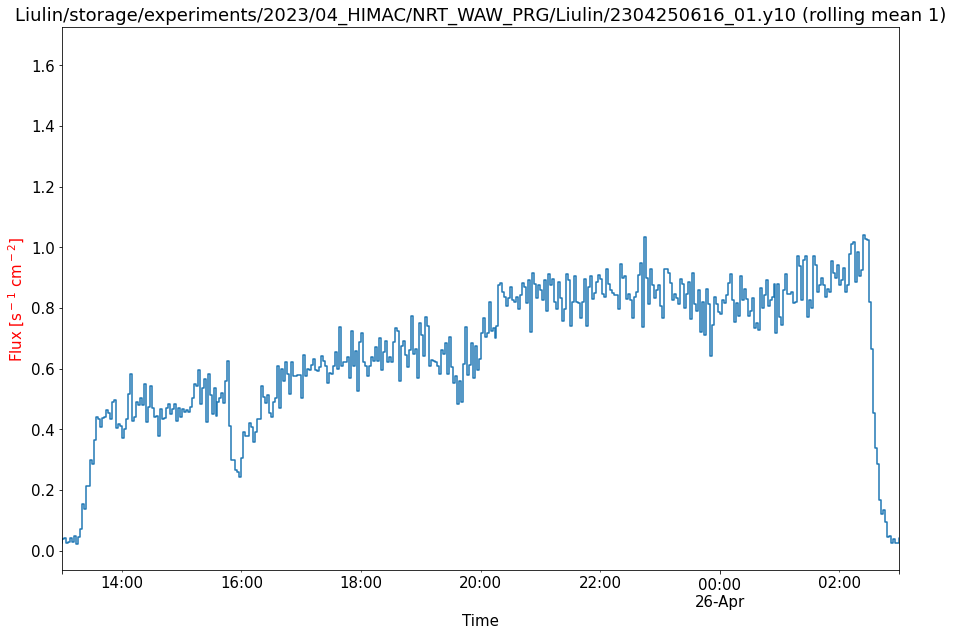

In [254]:
# index liulin data (compute time)
#liulin_data = pd.DataFrame(index = pd.date_range(date_object, freq=exposition, periods=len(liulin)).tolist(), data = liulin.as_matrix())
#liulin_data = pd.DataFrame(index = pd.date_range(date_object, freq=exposition, periods=len(liulin)).tolist(), data = liulin)
#liulin_data['flux'] = liulin_data[range(0,256)].sum(axis=1)
#liulin_data = liulin_data.loc['2018-08-02 17:00:00':'2018-08-03 13:00:00']
#ABSjets liulin_data = liulin_data.loc['2017-11-29 12:00:00':'2017-11-29 15:30:00']
#liulin_data = liulin_data#.loc['2023-04-22 13:15':'2023-04-23 13:15']

liulin_data['flux'] = liulin_data.iloc[:,0:255].sum(axis=1)/exposition_val/2

WINDOW = 1
#liulin_data['flux'] = liulin_data['flux'].rolling(WINDOW).mean()

#liulin_data
plt.figure(figsize=(15, 10))
matplotlib.rcParams.update({'font.size': 15})
liulin_data['flux'].plot(drawstyle='steps')
plt.title('Liulin' + filename + ' (rolling mean ' + str(WINDOW) + ')')
plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]', color='red')
plt.xlabel('Time')
plt.xlim('2023-04-25 13:00','2023-04-26 3:00')


0.1 0.05


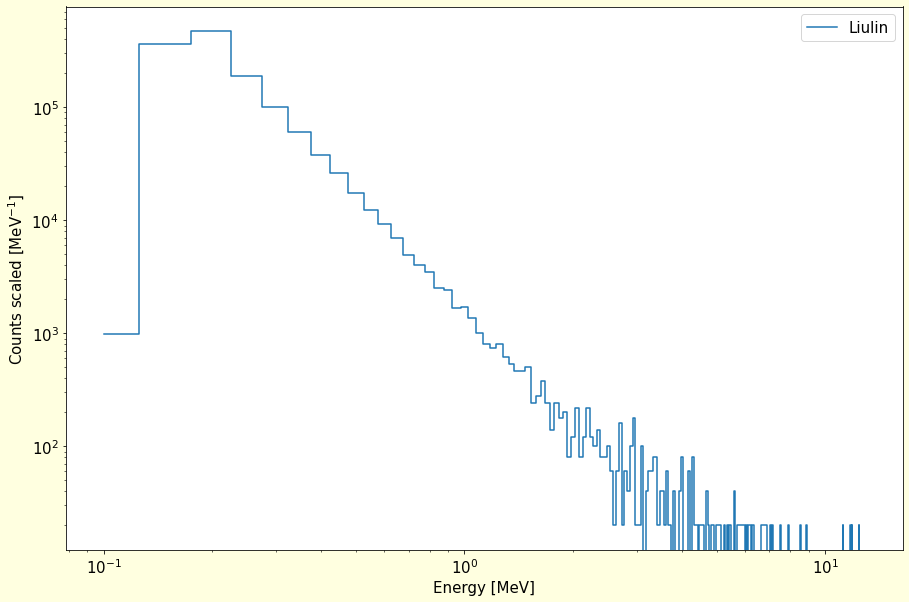

In [255]:
plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})

#liulin_data2 = liulin_data.loc['2023-05-15 21:00:00':'2023-05-15 22:00']
#liulin_data2 = liulin_data.loc['2023-04-22 14:25':'2023-04-23 2:30']
liulin_data2 = liulin_data.loc['2023-04-25 13:00':'2023-04-26 03:00']

ener = liulin_data2.iloc[:,0:256].sum()

coef3 = np.array([0.,0.])
coef3[1] = 0.05
coef3[0] = 0.1
#coef3[0] = 0.600

print (coef3[0], coef3[1])

e3 = pd.DataFrame()
e3['1'] = ener
e3['i'] = ener.index
e3['x'] = (e3['i'].astype(float)) * coef3[1] + coef3[0]

plt.yscale('log')
plt.xscale('log')

plt.plot(e3['x'], e3['1'] / coef3[1], label='Liulin', drawstyle='steps-mid')
#plt.plot(e3['x'], e3['1'], label='Liulin', drawstyle='steps-mid')

plt.xlabel('Energy [MeV]')
plt.ylabel(r'Counts scaled [MeV$^{-1}$]')
#plt.grid()
plt.legend()


None

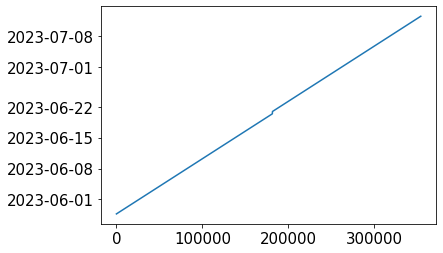

In [268]:
FIRST_CHANNEL = 8

plt.figure(figsize=(15,10), facecolor='lightyellow')
matplotlib.rcParams.update({'font.size': 15})


(rc['sum']).plot(label='LABDOS '+f.split('/')[-2], alpha=0.5)

#liulin_data2 = liulin_data.resample('10s').mean()

(liulin_data['flux']+0).plot(label='Liulin '+filename.split('.')[-1], alpha=0.5)


plt.ylabel('Flux [s$^-$$^1$ cm$^-$$^2$]')
plt.title(f)

#plt.ylim([0,2])
#plt.xlim('2023-05-15 14:25','2023-04-23 2:30')

plt.legend()





In [327]:
labdos.loc[labdos[8]<9000] = labdos.loc[:,8:].loc[labdos[8]<9000].shift(-1, axis=1)

In [347]:
labdos1 = labdos.loc[labdos[8]<9000].shift(-1, axis=1)
labdos2 = labdos.loc[labdos[8]>=9000]
labdos3 = pd.concat([labdos1, labdos2])
labdos3 = labdos3.sort_index()

In [348]:
labdos3

,0,1,2,3,4,5,6,7,8,9,...,496,497,498,499,500,501,502,503,504,505
time,,,,,,,,,,,,,,,,,,,,,
2023-05-28 16:43:38.443489536,1685292218.44349,$HIST,0,10.94,20688.0,0,76,14213,11093.0,13.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:01.161919232,1685292241.161919,$HIST,1,21.78,20859.0,2,118,15010,10090.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:11.972123136,1685292251.972123,$HIST,2,32.60,20829.0,3,101,14914,10231.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:22.819764992,1685292262.819765,$HIST,3,43.41,20743.0,1,75,14506,10748.0,10.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-05-28 16:44:33.618832640,1685292273.618833,$HIST,4,54.22,20767.0,0,78,14473,10758.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-12 13:04:29.571891968,1689167069.571892,$HIST,5010,54236.33,20589.0,1,2,7921,17479.0,91.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-07-12 13:04:40.412965888,1689167080.412966,$HIST,5011,54247.17,20591.0,2,3,7674,17725.0,88.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-07-12 13:05:06.076821504,1689167106.076822,$HIST,5012,54258.0,20495.0,1,3,8314,17190.0,80.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
